# Complete analysis and treatment of Horizontal MD4224 scan

In [1]:
import sys
import gzip
import glob
import pickle
import pandas as pd
import numpy as np
import scipy.io as sio 

sys.path.append('/eos/user/s/sterbini/MD_ANALYSIS/public/')
sys.path.append('/eos/project/l/liu/Toolbox/')

from myToolbox import *
from math import log10, floor
from scipy.signal import savgol_filter
from scipy.interpolate import interp1d
import matplotlib.cm as cm
import matplotlib.gridspec as gridspec

Version 0.03. This is the latest version.
Please help me to improve it reporting bugs to guido.sterbini@cern.ch.
Your platform is Linux-3.10.0-1127.10.1.el7.x86_64-x86_64-with-centos-7.7.1908-Core
Your folder is /eos/home-h/harafiqu/SWAN_projects/PS/From_Scratch/H_Optimised
Your IP is 172.17.0.14
2020-08-14 14:40:19


In [2]:
%run ../MD_Functions.ipynb


	Importing MD Analysis functions for MD4224


In [3]:
path = './Write_Up'
make_directory(path)

Successfully created the directory ./Write_Up 


### Import MD files

In [4]:
#myFiles=glob.glob('/eos/user/h/harafiqu/MD4224/2018.09.05_vertical/2018*.mat')
myFiles=glob.glob('/eos/user/h/harafiqu/MD4224/2018.09.03_horizontal_setup/2018*.mat')
len(myFiles)

481

### Convert matlab files to dataframe

In [5]:
# Convert mat files to dataframe
df_test = fromMatlabToDataFrame(myFiles,['PR_BQS72.SamplerAcquisition.value.estimatedTuneV','PR_BQS72.SamplerAcquisition.value.estimatedTuneH','PR_BQS72.SamplerAcquisition.cycleStamp','PR_BCT_ST.Samples.value.samples','PR_BCT_ST.Samples.cycleStamp'])

In [6]:
# cleanup dataframe
df_test['PR_BCT_ST.Samples.cycleStamp']=df_test['PR_BCT_ST.Samples.cycleStamp']/1e9
df_test['PR_BQS72.SamplerAcquisition.cycleStamp']=df_test['PR_BQS72.SamplerAcquisition.cycleStamp']/1e9

In [7]:
df_test

,cycleStamp,matlabPLS,matlabFilePath,PR_BQS72.SamplerAcquisition.value.estimatedTuneV,PR_BQS72.SamplerAcquisition.cycleStamp,PR_BCT_ST.Samples.cycleStamp,PR_BCT_ST.Samples.value.samples,PR_BQS72.SamplerAcquisition.value.estimatedTuneH
2018-09-04 08:30:23.500,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.2400633838653782, 0.24071684060591647, 0.24...",1.536043e+09,1.536043e+09,"[-0.11624000000000001, -0.10534, -0.0999, -0.0...","[0.06925515749517883, 0.06973344379232979, 0.0..."
2018-09-04 08:31:07.900,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.240164392846053, 0.24070426568970765, 0.240...",1.536043e+09,1.536043e+09,"[-0.11624000000000001, -0.10534, -0.0999, -0.0...","[0.06903893480409946, 0.0698538814992571, 0.06..."
2018-09-04 08:30:23.500,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.24050455328258302, 0.2398882633906126, 0.23...",1.536043e+09,1.536043e+09,"[-0.13622, -0.13077, -0.12653, -0.11382, -0.10...","[0.20995352903286288, 0.21067020868710704, 0.2..."
2018-09-04 08:31:07.900,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.23999910805682345, 0.24038658159481574, 0.2...",1.536043e+09,1.536043e+09,"[-0.21553000000000003, -0.20585, -0.1967600000...","[0.20090626615692153, 0.20022577459852903, 0.2..."
2018-09-04 08:31:52.300,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.23920904522475026, 0.23922914467035167, 0.2...",1.536043e+09,1.536043e+09,"[-0.20040000000000002, -0.19313000000000002, -...","[0.19156456206690262, 0.19032274178797184, 0.1..."
2018-09-04 08:33:21.100,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.2395665702216988, 0.2391189857897399, 0.239...",1.536043e+09,1.536043e+09,"[-0.12714, -0.11745000000000001, -0.1083700000...","[0.19045308754184034, 0.1914852705347637, 0.19..."
2018-09-04 08:33:21.100,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.23962860413251058, 0.23834961636211321, 0.2...",1.536043e+09,1.536043e+09,"[-0.10353000000000001, -0.09626000000000001, -...","[0.16946551270565605, 0.17004205624494292, 0.1..."
2018-09-04 08:34:49.900,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.23882057258518413, 0.23888081153944538, 0.2...",1.536043e+09,1.536043e+09,"[-0.16831000000000002, -0.16831000000000002, -...","[0.17196781208006878, 0.1723985292401067, 0.17..."
2018-09-04 08:34:49.900,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.2382619451410699, 0.2389334619079185, 0.239...",1.536043e+09,1.536043e+09,"[-0.20524, -0.1895, -0.18163, -0.1677000000000...","[0.15291621940585948, 0.15318778737219924, 0.1..."
2018-09-04 08:36:18.700,1.536050e+18,CPS.USER.MD1,/eos/user/h/harafiqu/MD4224/2018.09.03_horizon...,"[0.23925441494855273, 0.2382666456672961, 0.23...",1.536043e+09,1.536043e+09,"[-0.16831000000000002, -0.15136000000000002, -...","[0.15184832491946984, 0.15332481868757536, 0.1..."


In [8]:
# Check cyclestamp differences

# Iterate over each row in the dataframe
differences = []
for index, row in df_test.iterrows():
    difference = (row['PR_BCT_ST.Samples.cycleStamp'] - row['PR_BQS72.SamplerAcquisition.cycleStamp'])/row['PR_BCT_ST.Samples.cycleStamp']
    differences.append(difference)
    
print 'Difference between BCT and BQS73 cycle times (percentage) \n Mean:', np.mean(differences),' Min:',np.min(differences),' Max:', np.max(differences)

# Iterate over each row in the dataframe
differences = []
for index, row in df_test.iterrows():
    difference = (row['cycleStamp'] - (row['PR_BCT_ST.Samples.cycleStamp']*1E9))/row['cycleStamp']
    differences.append(difference)
    
print '\nDifference between BCT and cyclestamp cycle times (percentage) \n Mean:', np.mean(differences),' Min:',np.min(differences),' Max:', np.max(differences)

Difference between BCT and BQS73 cycle times (percentage) 
 Mean: 2.7610980770525687e-11  Min: 0.0  Max: 1.3280881750622855e-08

Difference between BCT and cyclestamp cycle times (percentage) 
 Mean: 4.701978064056953e-06  Min: 4.687281837851767e-06  Max: 4.745158443302907e-06


In [9]:
df_bct = fromMatlabToDataFrame(myFiles,['PR_BCT_ST.Samples.value.samples','PR_BCT_ST.Samples.cycleStamp', 'PR_SCBFC.Samples.value.samples'])
df_bqs72 = fromMatlabToDataFrame(myFiles,['PR_BQS72.SamplerAcquisition.value.estimatedTuneV','PR_BQS72.SamplerAcquisition.value.estimatedTuneH','PR_BQS72.SamplerAcquisition.cycleStamp'])

In [10]:
df_first = pnd.merge(df_bct, df_bqs72, left_on = 'PR_BCT_ST.Samples.cycleStamp',  right_on = 'PR_BQS72.SamplerAcquisition.cycleStamp')

In [11]:
# Have to convert this for unknown reason (myToolbox.unixtime2datetimeVectorize expects this converted cycleStamp)
df_first['PR_BCT_ST.Samples.cycleStamp']=df_first['PR_BCT_ST.Samples.cycleStamp']/1e9
# copy to new column
df_first['cf_cycleStamp']=df_first['PR_BCT_ST.Samples.cycleStamp']
# rename BCT cyclestamp to cycleStamp
df_first = df_first.rename(index=str, columns={"PR_BCT_ST.Samples.cycleStamp" : "cycleStamp", })
# convert to datetime
#df_first['PR_BCT_ST.Samples.cycleStamp']=df_first['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize)
df_first['cf_timeStamp'] = df_first['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize)
#df_first['cf_timeStamp']=df_first['timeStamp']
# Set index
df_first = df_first.set_index(['cycleStamp'])
df_first = df_first.drop(labels='matlabFilePath_x',axis='columns')
df_first = df_first.drop(labels='matlabFilePath_y',axis='columns')
df_first = df_first.drop(labels='cycleStamp_x',axis='columns')
df_first = df_first.drop(labels='cycleStamp_y',axis='columns')
df_first = df_first.drop(labels='matlabPLS_y',axis='columns')
df_first = df_first.drop(labels='matlabPLS_x',axis='columns')
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.cycleStamp',axis='columns')
#df_first = df_first.drop(labels='PR_BCT_ST.Samples.cycleStamp',axis='columns')

In [12]:
df_first['Qx']=df_first.apply(lambda x: np.nanmean(x['PR_BQS72.SamplerAcquisition.value.estimatedTuneH'][20:280]),axis=1)
df_first['Qy']=df_first.apply(lambda x: np.nanmean(x['PR_BQS72.SamplerAcquisition.value.estimatedTuneV'][20:280]),axis=1)

In [13]:
# Remove anomalous cases etc
#df_first = df_first.drop(df_first[df_first['Qx'] < .295].index )
df_first = df_first.dropna(axis=0,how='all',subset =['Qy'])
df_first = df_first.dropna(axis=0,how='all',subset =['Qx'])
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.value.estimatedTuneV',axis='columns')
df_first = df_first.drop(labels='PR_BQS72.SamplerAcquisition.value.estimatedTuneH',axis='columns')
#df_mergetest

In [14]:
df_first

,PR_BCT_ST.Samples.value.samples,PR_SCBFC.Samples.value.samples,cf_cycleStamp,cf_timeStamp,Qx,Qy
cycleStamp,,,,,,
1.536043e+09,"[-0.11624000000000001, -0.10534, -0.0999, -0.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:29:39.100,0.068468,0.239291
1.536043e+09,"[-0.11624000000000001, -0.10534, -0.0999, -0.0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:29:39.100,0.068468,0.239291
1.536043e+09,"[-0.13622, -0.13077, -0.12653, -0.11382, -0.10...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:30:23.500,0.209375,0.239995
1.536043e+09,"[-0.21553000000000003, -0.20585, -0.1967600000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:31:07.900,0.199853,0.239851
1.536043e+09,"[-0.20040000000000002, -0.19313000000000002, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:31:52.300,0.190123,0.239320
1.536043e+09,"[-0.12714, -0.11745000000000001, -0.1083700000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:32:36.700,0.190050,0.238540
1.536043e+09,"[-0.10353000000000001, -0.09626000000000001, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:33:21.100,0.170671,0.238617
1.536043e+09,"[-0.16831000000000002, -0.16831000000000002, -...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:34:05.500,0.171046,0.238833
1.536043e+09,"[-0.20524, -0.1895, -0.18163, -0.1677000000000...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,2018-09-04 08:34:49.900,0.152070,0.238388


In [15]:
# Check chirp time
test = myToolbox.japcMatlabImport(myFiles[0])
test.PR_BQS72.SamplerAcquisition.value.acqOffset

20

# Intensity, Losses, Ratio

In [16]:
df_second=intensity_df(df_first,start=70,end=1185)

In [17]:
df_second = df_second.drop(labels='PR_BCT_ST.Samples.value.samples',axis='columns');
df_second = df_second.set_index(['cf_timeStamp']);
df_second

,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
cf_timeStamp,,,,,,,
2018-09-04 08:29:39.100,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.068468,0.239291,7.102362e+11,0.774874,0.992251
2018-09-04 08:29:39.100,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.068468,0.239291,7.102362e+11,0.774874,0.992251
2018-09-04 08:30:23.500,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.209375,0.239995,7.301678e+11,1.755472,0.982445
2018-09-04 08:31:07.900,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.199853,0.239851,7.119099e+11,1.411161,0.985888
2018-09-04 08:31:52.300,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.190123,0.239320,7.243861e+11,1.241589,0.987584
2018-09-04 08:32:36.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.190050,0.238540,7.443178e+11,1.106104,0.988939
2018-09-04 08:33:21.100,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.170671,0.238617,7.017158e+11,1.237806,0.987622
2018-09-04 08:34:05.500,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.171046,0.238833,6.969991e+11,0.985538,0.990145
2018-09-04 08:34:49.900,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.152070,0.238388,7.227126e+11,0.887386,0.991126


### Check for duplicates

In [18]:
df_second = df_second.drop(df_second.index[0])
df_second[df_second.index.duplicated()]

,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
cf_timeStamp,,,,,,,


### Plot Intensity, Losses, Ratio

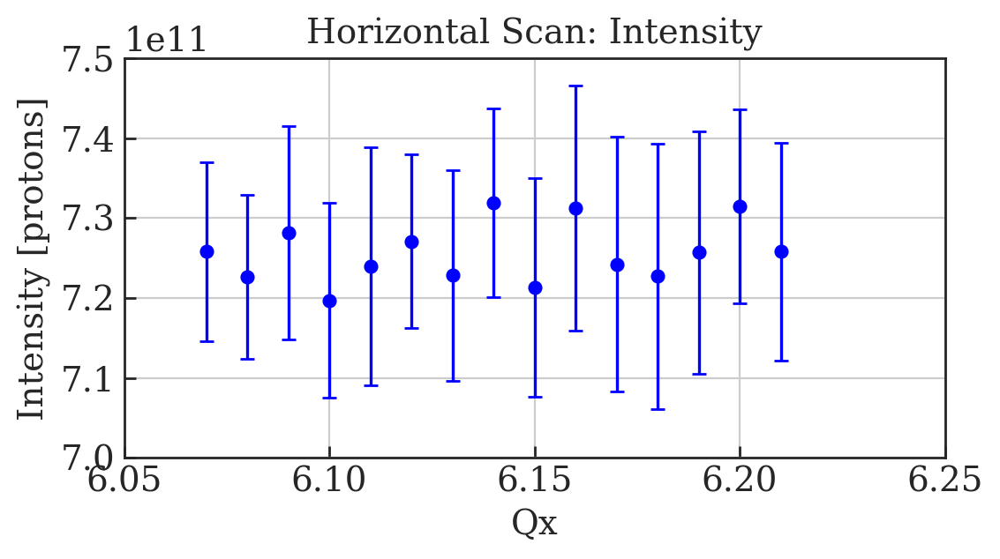

In [19]:
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df_second['intensity'][(df_second['Qx']>lower_lim)][(df_second['Qx']<upper_lim)] ) )
    y_error_172.append( np.std( df_second['intensity'][(df_second['Qx']>lower_lim)][(df_second['Qx']<upper_lim)] ) )
    
fig=plt.figure(figsize=(6, 3), dpi= 200, facecolor='w', edgecolor='k');

plt.errorbar(x_data, y_data_172, y_error_172, linestyle='None', marker='o', capsize=3, color='b')

x_d = np.linspace(6.0, 7.0, 2)
y_d = (7.25E11, 7.25E11)

plt.xlabel('Qx');
plt.ylabel('Intensity [protons]');
plt.title('Horizontal Scan: Intensity')
plt.ylim(70E10,75E10)
plt.xlim(6.05, 6.25)
#plt.legend()
plt.grid();
fig.savefig('MD4224_Complete_Horizontal_Intensities_Errors.png');

# Timber: Horizontal

In [20]:
dfH=read_data(year=2018,date=4,month=9,hour=8,minutes=20,span=8,user='CPS%MD1',WS='65.H');

In [21]:
len(dfH)

227

In [22]:
dfH

,PR.BWS.65.H_ROT:ACQ_DELAY,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BCT.LT:SAMPLES,PR.BWS.65.H_ROT:PROF_DATA_IN,cycleStamp
2018-09-04 08:30:23.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.13622, -0.13077, -0.12653, -0.11382, -0.10...","[0.173300683154985, 0.173502430703752, 0.17249...",1.536050e+18
2018-09-04 08:31:07.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.21553, -0.20585, -0.19676, -0.178, -0.1586...","[0.174717857718864, 0.17512488920122, 0.174514...",1.536050e+18
2018-09-04 08:31:52.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.2004, -0.19313, -0.18163, -0.16044, -0.142...","[0.17573721506667, 0.175532868924527, 0.176556...",1.536050e+18
2018-09-04 08:33:21.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.10353, -0.09626, -0.09203, -0.07931, -0.06...","[0.175941799097855, 0.17512488920122, 0.175737...",1.536050e+18
2018-09-04 08:34:49.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.20524, -0.1895, -0.18163, -0.1677, -0.1483...","[0.17573721506667, 0.17573721506667, 0.1755328...",1.536050e+18
2018-09-04 08:36:18.700,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.12532, -0.11079, -0.10111, -0.089, -0.0787...","[0.177587068653147, 0.178000784393168, 0.17862...",1.536050e+18
2018-09-04 08:37:47.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.17557, -0.16468, -0.15438, -0.1338, -0.119...","[0.174717857718864, 0.173502430703752, 0.17471...",1.536050e+18
2018-09-04 08:39:16.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.16589, -0.14712, -0.1338, -0.10958, -0.093...","[0.177380571512742, 0.178208003552817, 0.17758...",1.536050e+18
2018-09-04 08:40:45.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.13077, -0.12532, -0.12472, -0.11564, -0.10...","[0.17635168193542, 0.176762519656597, 0.176351...",1.536050e+18
2018-09-04 08:42:13.900,175.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[-0.19253, -0.17739, -0.16468, -0.14591, -0.12...","[0.174921255067789, 0.175532868924527, 0.17512...",1.536051e+18


# Manual Fit

In [23]:
df_H_filtered = Multi_filter(dfH, with_plot = True, WS = '65.H' )


Multi_filter row  0
5 parameter fit sigma =  4.4119310383040915  +/-  0.002914145266276778
3 parameter fit sigma =  4.411930986822637  +/-  0.010816417382478002
Second moment =  4.3764926897884795


/usr/local/bin/start_ipykernel.py:79: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:161: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:163: RuntimeWarning: invalid value encountered in sqrt



Multi_filter row  1
5 parameter fit sigma =  4.385078204284094  +/-  0.0030937376352799125
3 parameter fit sigma =  4.385077923670447  +/-  0.011540243857238536
Second moment =  4.259797370207958

Multi_filter row  2
5 parameter fit sigma =  4.434069732151142  +/-  0.0029127442997559597
3 parameter fit sigma =  4.434069219375807  +/-  0.010678926112903846
Second moment =  4.351412601781533

Multi_filter row  3
5 parameter fit sigma =  4.468285259732235  +/-  0.003124287050226527
3 parameter fit sigma =  4.468284998488029  +/-  0.011511872830552472
Second moment =  4.377511954189166

Multi_filter row  4
5 parameter fit sigma =  4.59375611180132  +/-  0.0028428103920089868
3 parameter fit sigma =  4.5937560326213065  +/-  0.010113211080327601
Second moment =  4.51728732744514

Multi_filter row  5
5 parameter fit sigma =  4.697891265586504  +/-  0.0029637498972557345
3 parameter fit sigma =  4.697891178560968  +/-  0.01026656510179562
Second moment =  4.846254714643309

Multi_filter row 


Multi_filter row  43
5 parameter fit sigma =  4.8029279976204196  +/-  0.003495917733946858
3 parameter fit sigma =  4.8029254308872  +/-  0.012644063399368823
Second moment =  4.737634460427686

Multi_filter row  44
5 parameter fit sigma =  4.821255427903209  +/-  0.0035173473862649277
3 parameter fit sigma =  4.821255117804676  +/-  0.012754042959218961
Second moment =  4.816287500113392

Multi_filter row  45
5 parameter fit sigma =  5.319063160407108  +/-  0.004604455368937491
3 parameter fit sigma =  5.3190604727438355  +/-  0.015901383751559754
Second moment =  5.141877479576826

Multi_filter row  46
5 parameter fit sigma =  5.790448522671267  +/-  0.004672381048590634
3 parameter fit sigma =  5.790449233157407  +/-  0.015277758817701347
Second moment =  5.678166447494334

Multi_filter row  47
5 parameter fit sigma =  4.348981030949833  +/-  0.002835274335436684
3 parameter fit sigma =  4.348980986982779  +/-  0.010456858001503241
Second moment =  4.4215175821403925

Multi_filter


Multi_filter row  85
5 parameter fit sigma =  4.437458999956741  +/-  0.0028960710740445054
3 parameter fit sigma =  4.437458624584091  +/-  0.010648185158178803
Second moment =  4.33024010954803

Multi_filter row  86
5 parameter fit sigma =  4.4092876988889005  +/-  0.0027968370755140945
3 parameter fit sigma =  4.409288719152602  +/-  0.010389500462277558
Second moment =  4.43367988779502

Multi_filter row  87
5 parameter fit sigma =  4.503467166055622  +/-  0.003267252786969994
3 parameter fit sigma =  4.503469337779128  +/-  0.012245554740549365
Second moment =  4.407507038016954

Multi_filter row  88
5 parameter fit sigma =  4.636240911534021  +/-  0.003097617278902683
3 parameter fit sigma =  4.636240875233502  +/-  0.01141109422803188
Second moment =  4.590016020055857

Multi_filter row  89
5 parameter fit sigma =  4.973159329365637  +/-  0.0037084461755382482
3 parameter fit sigma =  4.973159933049034  +/-  0.013265821747996846
Second moment =  4.818429996340825

Multi_filter 


Multi_filter row  127
5 parameter fit sigma =  5.47140930464889  +/-  0.004303413900432663
3 parameter fit sigma =  5.471409072080677  +/-  0.014556704364692457
Second moment =  5.601206134950219

Multi_filter row  128
5 parameter fit sigma =  5.919787326011903  +/-  0.005037633443044629
3 parameter fit sigma =  5.919787695608012  +/-  0.016361700342454016
Second moment =  5.5059411476500335

Multi_filter row  129
5 parameter fit sigma =  4.41980319852834  +/-  0.0028046886422514344
3 parameter fit sigma =  4.4198038609957635  +/-  0.010439650934729275
Second moment =  4.364078654036144

Multi_filter row  130
5 parameter fit sigma =  4.416615383715263  +/-  0.0029342131633795215
3 parameter fit sigma =  4.416615286414225  +/-  0.010954677614264552
Second moment =  4.31176905860845

Multi_filter row  131
5 parameter fit sigma =  4.499386213116249  +/-  0.002843624180186387
3 parameter fit sigma =  4.499385234680585  +/-  0.010441589046505934
Second moment =  4.363610915421009

Multi_fi


Multi_filter row  169
5 parameter fit sigma =  4.984515967131949  +/-  0.003445902398587343
3 parameter fit sigma =  4.984515554475306  +/-  0.011863190628658756
Second moment =  4.835284519015939

Multi_filter row  170
5 parameter fit sigma =  5.463460246325279  +/-  0.004546048186186064
3 parameter fit sigma =  5.4634592274875615  +/-  0.015534213116481881
Second moment =  5.165023205918372

Multi_filter row  171
5 parameter fit sigma =  5.993457601647336  +/-  0.005099984947802033
3 parameter fit sigma =  5.993456840929918  +/-  0.016602076793227546
Second moment =  5.640843505504249

Multi_filter row  172
5 parameter fit sigma =  4.384724106676884  +/-  0.002848167316275948
3 parameter fit sigma =  4.384724623985665  +/-  0.010685555095255006
Second moment =  4.371576040729943

Multi_filter row  173
5 parameter fit sigma =  4.458278879450483  +/-  0.0030108124812569005
3 parameter fit sigma =  4.4582781137583565  +/-  0.011319678933284592
Second moment =  4.442206535903683

Multi_


Multi_filter row  211
5 parameter fit sigma =  4.424315833004393  +/-  0.002942747902659792
3 parameter fit sigma =  4.424315706414014  +/-  0.01097471160800633
Second moment =  4.361144981324213

Multi_filter row  212
5 parameter fit sigma =  4.587936027290125  +/-  0.0031431135073126688
3 parameter fit sigma =  4.58793589498223  +/-  0.011677442137390108
Second moment =  4.5225487179783475

Multi_filter row  213
5 parameter fit sigma =  4.732862030896154  +/-  0.0032365666832259794
3 parameter fit sigma =  4.732861400750446  +/-  0.011670461443721386
Second moment =  4.720630150953136

Multi_filter row  214
5 parameter fit sigma =  4.77590023650177  +/-  0.0031016752680976816
3 parameter fit sigma =  4.775900291633621  +/-  0.010998563191012448
Second moment =  4.702202902117167

Multi_filter row  215
5 parameter fit sigma =  4.873807548265324  +/-  0.0033532949696412485
3 parameter fit sigma =  4.87380810245368  +/-  0.011868867525417796
Second moment =  4.833670503439342

Multi_fi

In [24]:
df_H_filtered = df_H_filtered.dropna(axis=0, how='all', subset=['profile H']);
df_H_filtered = df_H_filtered.dropna(axis=0, how='all', subset=['sig H']);
df_H_filtered = df_H_filtered.drop(labels = 'PR.BCT.LT:SAMPLES',axis='columns');
df_H_filtered['cycleStamp'] = df_H_filtered['cycleStamp']/1e9;
df_H_filtered['timeStamp_h'] = df_H_filtered['cycleStamp'].apply(myToolbox.unixtime2datetimeVectorize);


In [25]:
df_H_filtered

,PR.BWS.65.H_ROT:ACQ_DELAY,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,cycleStamp,2ndMoment H,sig H,sig errH,A H,mu H,position H,profile H,timeStamp_h
2018-09-04 08:30:23.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.173300683154985, 0.173502430703752, 0.17249...",1.536050e+09,4.376493,4.411930986822637,0.010816,7.104645728686517,-2.737597599968522,"[-26.44740240003148, -26.31840240003148, -26.2...","[-0.0010291567039261706, -0.001231909621088295...",2018-09-04 10:30:23.500
2018-09-04 08:31:07.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.17512488920122, 0.174514...",1.536050e+09,4.259797,4.385077923670447,0.011540,6.889804203620628,-2.6681059516376338,"[-26.289894048362363, -26.192894048362366, -26...","[-0.0005403673674068132, 7.05067213957189e-05,...",2018-09-04 10:31:07.900
2018-09-04 08:31:52.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.175532868924527, 0.176556...",1.536050e+09,4.351413,4.434069219375807,0.010679,6.972747213985072,-2.6428228411117747,"[-26.575177158888224, -26.380177158888223, -26...","[0.0014204721379618146, 0.001009509217427873, ...",2018-09-04 10:31:52.300
2018-09-04 08:33:21.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.175941799097855, 0.17512488920122, 0.175737...",1.536050e+09,4.377512,4.468284998488029,0.011512,6.719656512893831,-2.4287820659879413,"[-26.789217934012058, -26.62721793401206, -26....","[0.000569148482410825, 0.0015954702265423837, ...",2018-09-04 10:33:21.100
2018-09-04 08:34:49.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.17573721506667, 0.1755328...",1.536050e+09,4.517287,4.5937560326213065,0.010113,6.964483463383702,-3.0145971809522223,"[-27.43940281904778, -27.34140281904778, -27.3...","[0.0013127674308776593, 0.00151857347547657, 0...",2018-09-04 10:34:49.900
2018-09-04 08:36:18.700,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177587068653147, 0.178000784393168, 0.17862...",1.536050e+09,4.846255,4.697891178560968,0.010267,6.71314396867442,-3.028327388635603,"[-28.1416726113644, -27.979672611364396, -27.9...","[0.0025572118017685164, 0.0023501739147005207,...",2018-09-04 10:36:18.700
2018-09-04 08:37:47.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.173502430703752, 0.17471...",1.536050e+09,4.704099,4.927503294667217,0.013057,6.990972365092053,-3.3162589470865695,"[-29.48574105291343, -29.453741052913433, -29....","[-0.001186698579288048, 0.001264047734976903, ...",2018-09-04 10:37:47.500
2018-09-04 08:39:16.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177380571512742, 0.178208003552817, 0.17758...",1.536050e+09,5.061085,5.176246325534791,0.017240,6.713900226898849,-3.394103806486972,"[-31.011896193513028, -30.87989619351303, -30....","[0.0012531608091851942, 0.0033193790161270276,...",2018-09-04 10:39:16.300
2018-09-04 08:40:45.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17635168193542, 0.176762519656597, 0.176351...",1.536050e+09,5.892221,5.866034303890619,0.019750,6.902342903858677,-3.474954237427583,"[-35.17304576257242, -35.10704576257242, -34.9...","[-0.001107980961924132, -0.0004984713001990604...",2018-09-04 10:40:45.100
2018-09-04 08:42:13.900,175.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174921255067789, 0.175532868924527, 0.17512...",1.536051e+09,4.351022,4.416157449662227,0.010081,7.222033873364809,-2.448335591030603,"[-26.4446644089694, -26.347664408969397, -26.2...","[0.0008066847745771266, 0.0012169879923084048,...",2018-09-04 10:42:13.900


# Merge Timber WS dataframe with Intensity/Tunes dataframe

In [26]:
df_third = pnd.merge(df_H_filtered, df_second, left_index=True, right_index=True, how='outer');
df_third

,PR.BWS.65.H_ROT:ACQ_DELAY,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,cycleStamp,2ndMoment H,sig H,sig errH,A H,mu H,position H,profile H,timeStamp_h,PR_SCBFC.Samples.value.samples,cf_cycleStamp,Qx,Qy,intensity,losses,ratio
2018-09-04 08:30:23.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.173300683154985, 0.173502430703752, 0.17249...",1.536050e+09,4.376493,4.411930986822637,0.010816,7.104645728686517,-2.737597599968522,"[-26.44740240003148, -26.31840240003148, -26.2...","[-0.0010291567039261706, -0.001231909621088295...",2018-09-04 10:30:23.500,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.209375,0.239995,7.301678e+11,1.755472,0.982445
2018-09-04 08:31:07.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.17512488920122, 0.174514...",1.536050e+09,4.259797,4.385077923670447,0.011540,6.889804203620628,-2.6681059516376338,"[-26.289894048362363, -26.192894048362366, -26...","[-0.0005403673674068132, 7.05067213957189e-05,...",2018-09-04 10:31:07.900,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.199853,0.239851,7.119099e+11,1.411161,0.985888
2018-09-04 08:31:52.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.175532868924527, 0.176556...",1.536050e+09,4.351413,4.434069219375807,0.010679,6.972747213985072,-2.6428228411117747,"[-26.575177158888224, -26.380177158888223, -26...","[0.0014204721379618146, 0.001009509217427873, ...",2018-09-04 10:31:52.300,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.190123,0.239320,7.243861e+11,1.241589,0.987584
2018-09-04 08:32:36.700,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.190050,0.238540,7.443178e+11,1.106104,0.988939
2018-09-04 08:33:21.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.175941799097855, 0.17512488920122, 0.175737...",1.536050e+09,4.377512,4.468284998488029,0.011512,6.719656512893831,-2.4287820659879413,"[-26.789217934012058, -26.62721793401206, -26....","[0.000569148482410825, 0.0015954702265423837, ...",2018-09-04 10:33:21.100,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.170671,0.238617,7.017158e+11,1.237806,0.987622
2018-09-04 08:34:05.500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.171046,0.238833,6.969991e+11,0.985538,0.990145
2018-09-04 08:34:49.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.17573721506667, 0.1755328...",1.536050e+09,4.517287,4.5937560326213065,0.010113,6.964483463383702,-3.0145971809522223,"[-27.43940281904778, -27.34140281904778, -27.3...","[0.0013127674308776593, 0.00151857347547657, 0...",2018-09-04 10:34:49.900,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.152070,0.238388,7.227126e+11,0.887386,0.991126
2018-09-04 08:35:34.300,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.152020,0.238310,7.310808e+11,0.606180,0.993938
2018-09-04 08:36:18.700,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177587068653147, 0.178000784393168, 0.17862...",1.536050e+09,4.846255,4.697891178560968,0.010267,6.71314396867442,-3.028327388635603,"[-28.1416726113644, -27.979672611364396, -27.9...","[0.0025572118017685164, 0.0023501739147005207,...",2018-09-04 10:36:18.700,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.133166,0.238409,6.959341e+11,0.570801,0.994292
2018-09-04 08:37:03.100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",1.536043e+09,0.133072,0.238154,7.310808e+11,0.271576,0.997284


In [27]:
df_third=df_third.dropna(axis=0,how='all',subset =['Qx']);
df_third=df_third.dropna(axis=0,how='all',subset =['sig H']);
df_third=df_third.dropna(axis=1,how='all');
df_third = df_third.drop(labels = 'timeStamp_h',axis='columns');
df_third = df_third.drop(labels = 'cf_cycleStamp',axis='columns');
df_third

,PR.BWS.65.H_ROT:ACQ_DELAY,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,cycleStamp,2ndMoment H,sig H,sig errH,A H,mu H,position H,profile H,PR_SCBFC.Samples.value.samples,Qx,Qy,intensity,losses,ratio
2018-09-04 08:30:23.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.173300683154985, 0.173502430703752, 0.17249...",1.536050e+09,4.376493,4.411930986822637,0.010816,7.104645728686517,-2.737597599968522,"[-26.44740240003148, -26.31840240003148, -26.2...","[-0.0010291567039261706, -0.001231909621088295...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.209375,0.239995,7.301678e+11,1.755472,0.982445
2018-09-04 08:31:07.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.17512488920122, 0.174514...",1.536050e+09,4.259797,4.385077923670447,0.011540,6.889804203620628,-2.6681059516376338,"[-26.289894048362363, -26.192894048362366, -26...","[-0.0005403673674068132, 7.05067213957189e-05,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.199853,0.239851,7.119099e+11,1.411161,0.985888
2018-09-04 08:31:52.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.175532868924527, 0.176556...",1.536050e+09,4.351413,4.434069219375807,0.010679,6.972747213985072,-2.6428228411117747,"[-26.575177158888224, -26.380177158888223, -26...","[0.0014204721379618146, 0.001009509217427873, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.190123,0.239320,7.243861e+11,1.241589,0.987584
2018-09-04 08:33:21.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.175941799097855, 0.17512488920122, 0.175737...",1.536050e+09,4.377512,4.468284998488029,0.011512,6.719656512893831,-2.4287820659879413,"[-26.789217934012058, -26.62721793401206, -26....","[0.000569148482410825, 0.0015954702265423837, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.170671,0.238617,7.017158e+11,1.237806,0.987622
2018-09-04 08:34:49.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.17573721506667, 0.1755328...",1.536050e+09,4.517287,4.5937560326213065,0.010113,6.964483463383702,-3.0145971809522223,"[-27.43940281904778, -27.34140281904778, -27.3...","[0.0013127674308776593, 0.00151857347547657, 0...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.152070,0.238388,7.227126e+11,0.887386,0.991126
2018-09-04 08:36:18.700,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177587068653147, 0.178000784393168, 0.17862...",1.536050e+09,4.846255,4.697891178560968,0.010267,6.71314396867442,-3.028327388635603,"[-28.1416726113644, -27.979672611364396, -27.9...","[0.0025572118017685164, 0.0023501739147005207,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.133166,0.238409,6.959341e+11,0.570801,0.994292
2018-09-04 08:37:47.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.173502430703752, 0.17471...",1.536050e+09,4.704099,4.927503294667217,0.013057,6.990972365092053,-3.3162589470865695,"[-29.48574105291343, -29.453741052913433, -29....","[-0.001186698579288048, 0.001264047734976903, ...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.114450,0.238259,7.231689e+11,0.779939,0.992201
2018-09-04 08:39:16.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177380571512742, 0.178208003552817, 0.17758...",1.536050e+09,5.061085,5.176246325534791,0.017240,6.713900226898849,-3.394103806486972,"[-31.011896193513028, -30.87989619351303, -30....","[0.0012531608091851942, 0.0033193790161270276,...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.095983,0.238594,7.043024e+11,1.211873,0.987881
2018-09-04 08:40:45.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17635168193542, 0.176762519656597, 0.176351...",1.536050e+09,5.892221,5.866034303890619,0.019750,6.902342903858677,-3.474954237427583,"[-35.17304576257242, -35.10704576257242, -34.9...","[-0.001107980961924132, -0.0004984713001990604...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.

# Emittances

In [28]:
span=span_range(df_third)
span

xrange(225)

In [29]:
# Calculate emittances in Vertical
df_fourth = emittance_df(df_third, WS='65.H', verbose=True)

Emittance  0  =  1.0720585167841377
Emittance  1  =  1.039389501677297
Emittance  2  =  1.0736544997647173
Emittance  3  =  1.0847021738486387
Emittance  4  =  1.1803327033780053
Emittance  5  =  1.2577484255275342
Emittance  6  =  1.465641978716663
Emittance  7  =  1.7123883393906132
Emittance  8  =  2.542525638998941
Emittance  9  =  1.0757330077108824
Emittance  10  =  1.1092037394109615
Emittance  11  =  1.1397954698735193
Emittance  12  =  1.2076829822013382
Emittance  13  =  1.3218406848334272
Emittance  14  =  1.9167099850367684
Emittance  15  =  2.650150661103901
Emittance  16  =  1.0851398904201601
Emittance  17  =  1.0517367521161256
Emittance  18  =  1.0527135819384437
Emittance  19  =  1.1719847369934921
Emittance  20  =  1.3021520221345089
Emittance  21  =  1.4731680110494205
Emittance  22  =  1.8299161402860247
Emittance  23  =  2.3646157083824937
Emittance  24  =  1.089521660151752
Emittance  25  =  1.0816995058318428
Emittance  26  =  1.117322470587402
Emittance  27  = 

In [30]:
df_fourth

,PR.BWS.65.H_ROT:ACQ_DELAY,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,cycleStamp,2ndMoment H,sig H,sig errH,A H,mu H,position H,...,Qx,Qy,intensity,losses,ratio,emittance H,betx,bety,dx,emittance H noDisp
2018-09-04 08:30:23.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.173300683154985, 0.173502430703752, 0.17249...",1.536050e+09,4.376493,4.411930986822637,0.010816,7.104645728686517,-2.737597599968522,"[-26.44740240003148, -26.31840240003148, -26.2...",...,0.209375,0.239995,7.301678e+11,1.755472,0.982445,1.072059,22.435882,11.715731,3.413603,1.960295
2018-09-04 08:31:07.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.17512488920122, 0.174514...",1.536050e+09,4.259797,4.385077923670447,0.011540,6.889804203620628,-2.6681059516376338,"[-26.289894048362363, -26.192894048362366, -26...",...,0.199853,0.239851,7.119099e+11,1.411161,0.985888,1.039390,22.392001,11.721015,3.434507,1.940300
2018-09-04 08:31:52.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.175532868924527, 0.176556...",1.536050e+09,4.351413,4.434069219375807,0.010679,6.972747213985072,-2.6428228411117747,"[-26.575177158888224, -26.380177158888223, -26...",...,0.190123,0.239320,7.243861e+11,1.241589,0.987584,1.073654,22.339713,11.726460,3.457001,1.988541
2018-09-04 08:33:21.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.175941799097855, 0.17512488920122, 0.175737...",1.536050e+09,4.377512,4.468284998488029,0.011512,6.719656512893831,-2.4287820659879413,"[-26.789217934012058, -26.62721793401206, -26....",...,0.170671,0.238617,7.017158e+11,1.237806,0.987622,1.084702,22.207503,11.737483,3.506113,2.031370
2018-09-04 08:34:49.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.17573721506667, 0.1755328...",1.536050e+09,4.517287,4.5937560326213065,0.010113,6.964483463383702,-3.0145971809522223,"[-27.43940281904778, -27.34140281904778, -27.3...",...,0.152070,0.238388,7.227126e+11,0.887386,0.991126,1.180333,22.035852,11.748196,3.559735,2.163780
2018-09-04 08:36:18.700,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177587068653147, 0.178000784393168, 0.17862...",1.536050e+09,4.846255,4.697891178560968,0.010267,6.71314396867442,-3.028327388635603,"[-28.1416726113644, -27.979672611364396, -27.9...",...,0.133166,0.238409,6.959341e+11,0.570801,0.994292,1.257748,21.797181,11.759253,3.623272,2.287772
2018-09-04 08:37:47.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.173502430703752, 0.17471...",1.536050e+09,4.704099,4.927503294667217,0.013057,6.990972365092053,-3.3162589470865695,"[-29.48574105291343, -29.453741052913433, -29....",...,0.114450,0.238259,7.231689e+11,0.779939,0.992201,1.465642,21.467022,11.770369,3.698824,2.555578
2018-09-04 08:39:16.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177380571512742, 0.178208003552817, 0.17758...",1.536050e+09,5.061085,5.176246325534791,0.017240,6.713900226898849,-3.394103806486972,"[-31.011896193513028, -30.87989619351303, -30....",...,0.095983,0.238594,7.043024e+11,1.211873,0.987881,1.712388,20.999678,11.781491,3.791097,2.882865
2018-09-04 08:40:45.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17635168193542, 0.176762519656597, 0.176351...",1.536050e+09,5.892221,5.866034303890619,0.019750,6.902342903858677,-3.474954237427583,"[-35.17304576257242, -35.10704576257242, -34.9...",...,0.077534,0.238870,7.249947e+11,1.536863,0.984631,2.542526,20.300948,11.792737,3.909099,3.829834
2018-09-04 08:42:13.900,175.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174921255067789, 0.175532868924527, 0.17512...",1.536051e+09,4.351022,4.416157449662227,0.010081,7.222033873364809,-2.448335591030603,"[-26.4446644089694, -26.347664408969397, -26.2...",...,0.209286,0.239391,7.380797e+11,1.902385,0.980976,1.075733,22.435503,11.715780,3.413798,1.964086


# Emittances from 2nd Moment

In [31]:
df_fifth = emittance_df_2(df_fourth, WS='65.H', verbose=True)

Emittance from 2nd moment 0  =  1.040693336025172
Emittance from 2nd moment 1  =  0.9301054993827126
Emittance from 2nd moment 2  =  1.0002077253304604
Emittance from 2nd moment 3  =  1.0030060880303926
Emittance from 2nd moment 4  =  1.1088947329048733
Emittance from 2nd moment 5  =  1.4045298273735003
Emittance from 2nd moment 6  =  1.2391646137282577
Emittance from 2nd moment 7  =  1.5855394500470394
Emittance from 2nd moment 8  =  2.5767951407814196
Emittance from 2nd moment 9  =  1.018222512601362
Emittance from 2nd moment 10  =  0.973570969974511
Emittance from 2nd moment 11  =  1.1165657917805618
Emittance from 2nd moment 12  =  1.188847666981425
Emittance from 2nd moment 13  =  1.235537326522712
Emittance from 2nd moment 14  =  1.6484733588782878
Emittance from 2nd moment 15  =  2.1540461565806095
Emittance from 2nd moment 16  =  1.0126911437719806
Emittance from 2nd moment 17  =  0.9902452033171648
Emittance from 2nd moment 18  =  1.1797950653147526
Emittance from 2nd moment 1

Emittance from 2nd moment 174  =  1.156567488350599
Emittance from 2nd moment 175  =  1.155026987293299
Emittance from 2nd moment 176  =  1.1106624235352824
Emittance from 2nd moment 177  =  1.3933401144929294
Emittance from 2nd moment 178  =  1.8180148452195732
Emittance from 2nd moment 179  =  2.676959621054712
Emittance from 2nd moment 180  =  1.1970844954827975
Emittance from 2nd moment 181  =  1.0113990688835657
Emittance from 2nd moment 182  =  1.1087608125634338
Emittance from 2nd moment 183  =  1.1619117852185237
Emittance from 2nd moment 184  =  1.303680539227491
Emittance from 2nd moment 185  =  1.6370150887536563
Emittance from 2nd moment 186  =  1.9340962644850785
Emittance from 2nd moment 187  =  3.1258927785990656
Emittance from 2nd moment 188  =  1.052548195092622
Emittance from 2nd moment 189  =  1.0693954555005591
Emittance from 2nd moment 190  =  1.1721748420446185
Emittance from 2nd moment 191  =  1.197932258751127
Emittance from 2nd moment 192  =  1.4599647179712196

In [32]:
df_fifth

,PR.BWS.65.H_ROT:ACQ_DELAY,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,cycleStamp,2ndMoment H,sig H,sig errH,A H,mu H,position H,...,intensity,losses,ratio,emittance H,betx,bety,dx,emittance H noDisp,emittance H 2ndMoment noDisp,emittance H 2ndMoment
2018-09-04 08:30:23.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.173300683154985, 0.173502430703752, 0.17249...",1.536050e+09,4.376493,4.411930986822637,0.010816,7.104645728686517,-2.737597599968522,"[-26.44740240003148, -26.31840240003148, -26.2...",...,7.301678e+11,1.755472,0.982445,1.072059,22.435882,11.715731,3.413603,1.960295,1.928930,1.040693
2018-09-04 08:31:07.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.17512488920122, 0.174514...",1.536050e+09,4.259797,4.385077923670447,0.011540,6.889804203620628,-2.6681059516376338,"[-26.289894048362363, -26.192894048362366, -26...",...,7.119099e+11,1.411161,0.985888,1.039390,22.392001,11.721015,3.434507,1.940300,1.831016,0.930105
2018-09-04 08:31:52.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.175532868924527, 0.176556...",1.536050e+09,4.351413,4.434069219375807,0.010679,6.972747213985072,-2.6428228411117747,"[-26.575177158888224, -26.380177158888223, -26...",...,7.243861e+11,1.241589,0.987584,1.073654,22.339713,11.726460,3.457001,1.988541,1.915094,1.000208
2018-09-04 08:33:21.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.175941799097855, 0.17512488920122, 0.175737...",1.536050e+09,4.377512,4.468284998488029,0.011512,6.719656512893831,-2.4287820659879413,"[-26.789217934012058, -26.62721793401206, -26....",...,7.017158e+11,1.237806,0.987622,1.084702,22.207503,11.737483,3.506113,2.031370,1.949674,1.003006
2018-09-04 08:34:49.900,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17573721506667, 0.17573721506667, 0.1755328...",1.536050e+09,4.517287,4.5937560326213065,0.010113,6.964483463383702,-3.0145971809522223,"[-27.43940281904778, -27.34140281904778, -27.3...",...,7.227126e+11,0.887386,0.991126,1.180333,22.035852,11.748196,3.559735,2.163780,2.092342,1.108895
2018-09-04 08:36:18.700,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177587068653147, 0.178000784393168, 0.17862...",1.536050e+09,4.846255,4.697891178560968,0.010267,6.71314396867442,-3.028327388635603,"[-28.1416726113644, -27.979672611364396, -27.9...",...,6.959341e+11,0.570801,0.994292,1.257748,21.797181,11.759253,3.623272,2.287772,2.434553,1.404530
2018-09-04 08:37:47.500,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174717857718864, 0.173502430703752, 0.17471...",1.536050e+09,4.704099,4.927503294667217,0.013057,6.990972365092053,-3.3162589470865695,"[-29.48574105291343, -29.453741052913433, -29....",...,7.231689e+11,0.779939,0.992201,1.465642,21.467022,11.770369,3.698824,2.555578,2.329101,1.239165
2018-09-04 08:39:16.300,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.177380571512742, 0.178208003552817, 0.17758...",1.536050e+09,5.061085,5.176246325534791,0.017240,6.713900226898849,-3.394103806486972,"[-31.011896193513028, -30.87989619351303, -30....",...,7.043024e+11,1.211873,0.987881,1.712388,20.999678,11.781491,3.791097,2.882865,2.756016,1.585539
2018-09-04 08:40:45.100,172.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.17635168193542, 0.176762519656597, 0.176351...",1.536050e+09,5.892221,5.866034303890619,0.019750,6.902342903858677,-3.474954237427583,"[-35.17304576257242, -35.10704576257242, -34.9...",...,7.249947e+11,1.536863,0.984631,2.542526,20.300948,11.792737,3.909099,3.829834,3.864104,2.576795
2018-09-04 08:42:13.900,175.0,"[-51928.0, -51928.0, -51928.0, -51928.0, -5192...","[0.174921255067789, 0.175532868924527, 0.17512...",1.536051e+09,4.351022,4.416157449662227,0.010081,7.222033873364809,-2.448335591030603,"[-26.4446644089694, -26.347664408969397, -26.2...",...,7.380797e+11,1.902385,0.980976,1.075733,22.435503,11.715780,3.413798,1.964086,1.906575,1.018223


# Save Dataframe to pickle

In [33]:
df_fifth.to_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete')

In [3]:
df0 = pnd.read_pickle('MD4224_HighBrightness_Vertical_Using_Sim_Optics_Complete')
#df0 = df_fifth

## Find correct tomo file for sims

In [35]:
# First tomo file
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(1536135630))

'2018-09-05 10:20:30'

In [36]:
# Last tomo file
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(1536152855))

'2018-09-05 15:07:35'

In [37]:
# data start time
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(df0['cycleStamp'][0]))

'2018-09-04 10:30:23'

In [38]:
# data start time
time.strftime('%Y-%m-%d %H:%M:%S', time.localtime(df0['cycleStamp'][0]))

'2018-09-04 10:30:23'

# Plots

In [4]:
# These are our tune points:
scan_points = np.linspace(607, 621, 15);
scan_points = scan_points/100;
scan_points

array([6.07, 6.08, 6.09, 6.1 , 6.11, 6.12, 6.13, 6.14, 6.15, 6.16, 6.17,
       6.18, 6.19, 6.2 , 6.21])

In [5]:
from math import log10, floor

def round_sig(x, sig=4):
    return round(x, sig-int(floor(log10(abs(x))))-1)

In [6]:
Qx_points=[]
for i in scan_points:
    Qx_points.append(round_sig(i,5))
Qx_points

[6.07,
 6.08,
 6.09,
 6.1,
 6.11,
 6.12,
 6.13,
 6.14,
 6.15,
 6.16,
 6.17,
 6.18,
 6.19,
 6.2,
 6.21]

In [7]:
Qx_point_separation = Qx_points[1] - Qx_points[0]
Qx_pt_sep = Qx_point_separation/2
print 'Tune points separated by +/- ', Qx_pt_sep

Tune points separated by +/-  0.005


In [8]:
# Make dictionary of nearest tune point and iterators
tune_points = {}
for i in Qx_points:
    tune_points[i] = np.where(np.logical_and(np.greater_equal(df0['Qx'], (i-Qx_pt_sep-6)), np.less_equal(df0['Qx'], (i+Qx_pt_sep-6)) ) )[0]
tune_points

{6.07: array([187, 202, 209, 217]),
 6.08: array([  8,  15,  23,  31,  39,  46,  54,  62,  76,  84,  91,  99, 107,
        114, 128, 136, 142, 148, 155, 163, 171, 179]),
 6.09: array([186, 194, 201, 208, 216, 224]),
 6.1: array([  7,  14,  22,  30,  38,  45,  53,  61,  69,  75,  83,  90,  98,
        106, 113, 121, 127, 135, 141, 154, 162, 170, 178]),
 6.11: array([  6,  21,  29,  37,  52,  60,  68,  82,  89,  97, 105, 112, 120,
        134, 140, 153, 161, 169, 177, 185, 193, 200, 207, 215, 223]),
 6.12: array([ 44, 184, 192, 199, 206, 214, 222]),
 6.13: array([  5,  13,  20,  28,  36,  43,  51,  59,  67,  74,  81,  96, 104,
        111, 119, 126, 133, 147, 160, 168, 176]),
 6.14: array([183, 191, 198, 205, 213, 221]),
 6.15: array([  4,  12,  19,  27,  35,  50,  58,  66,  73,  80,  88,  95, 103,
        110, 118, 125, 132, 146, 152, 159, 167, 175]),
 6.16: array([182, 190, 197, 204, 212, 220]),
 6.17: array([  3,  11,  18,  26,  34,  42,  49,  57,  65,  72,  79,  87,  94,
        102,

In [9]:
import matplotlib.cm as cm
# One colour per data point
colors = cm.rainbow(np.linspace(0, 1, len(df0)))

## Plot all WS profiles grouped by tune point

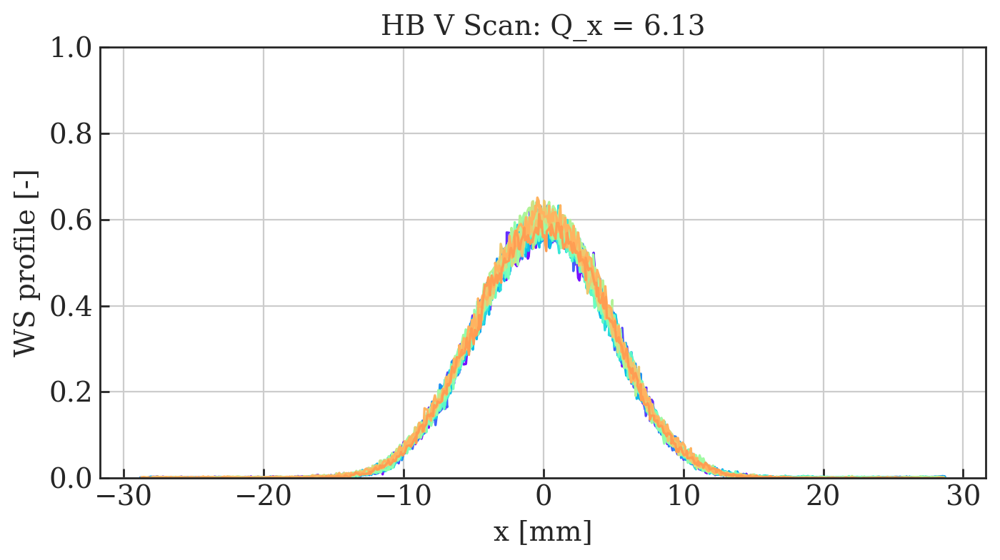

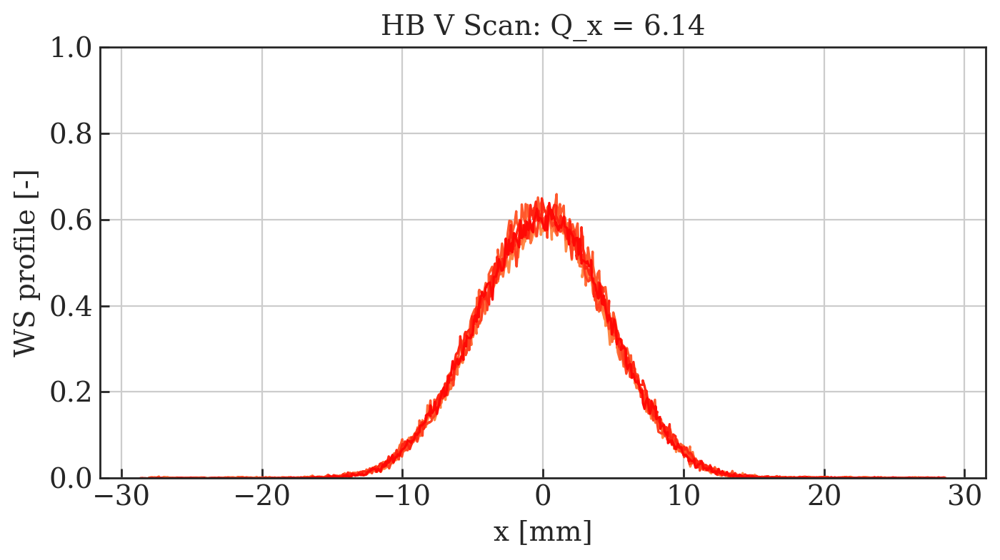

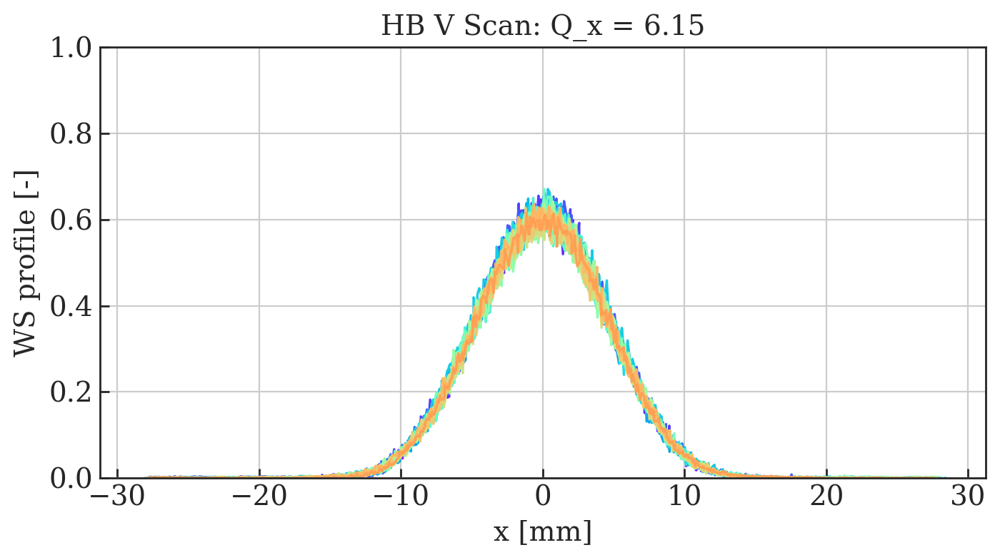

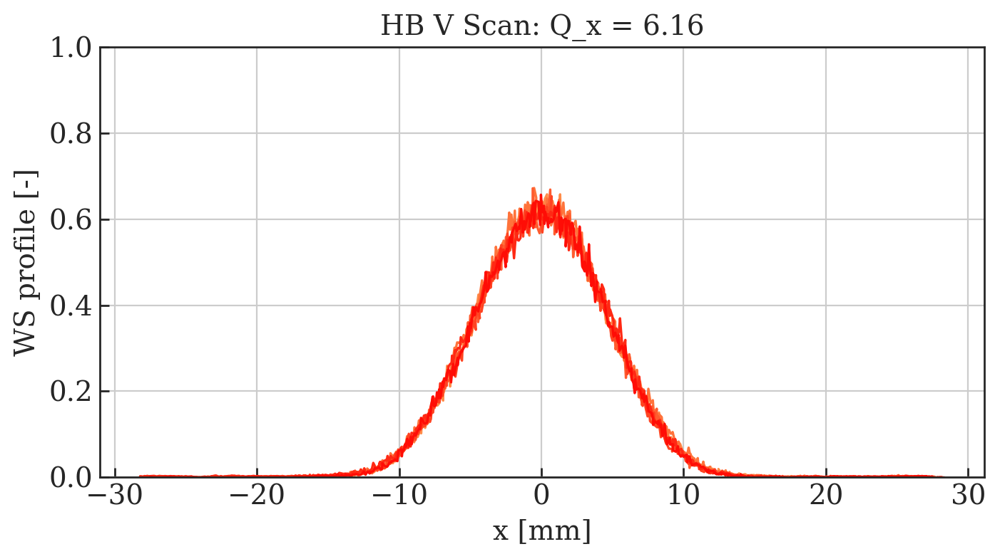

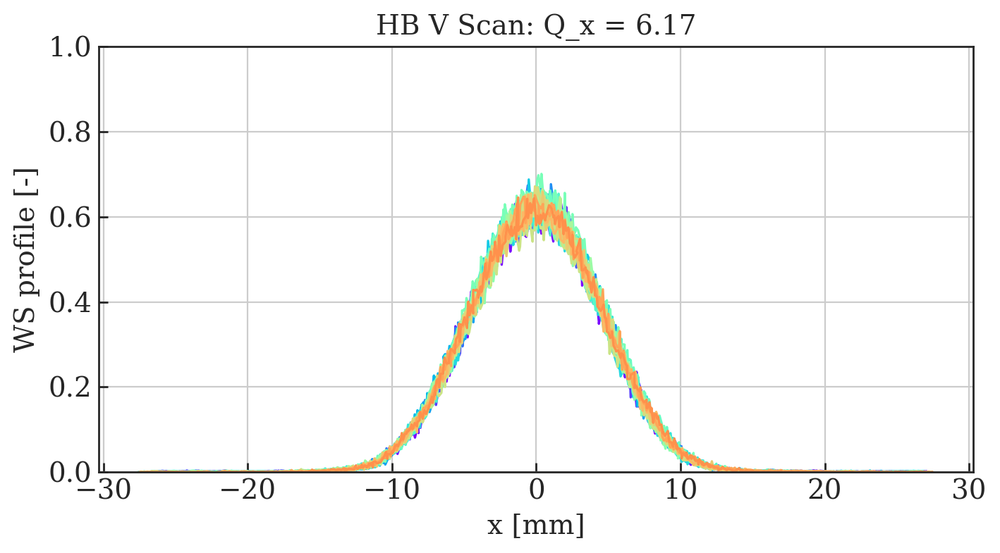

...

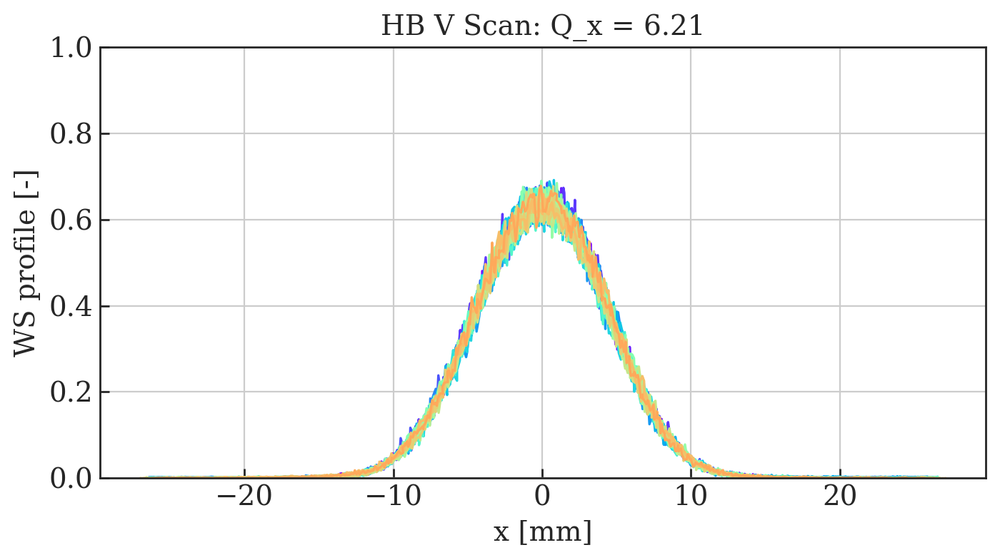

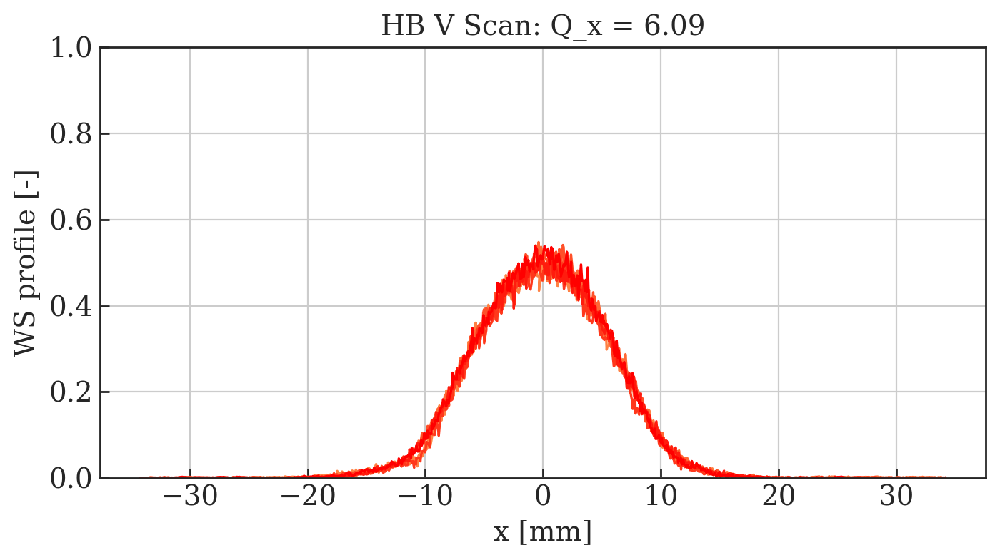

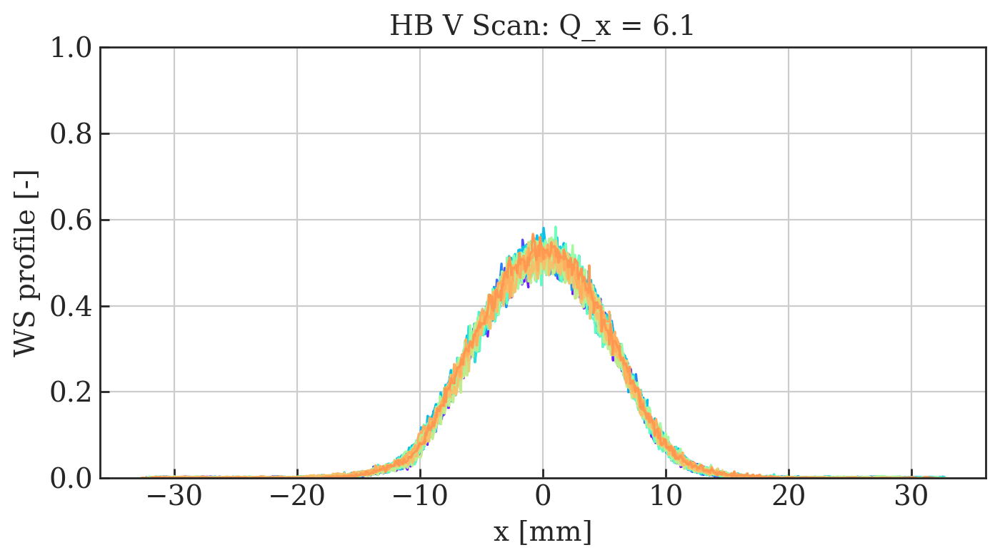

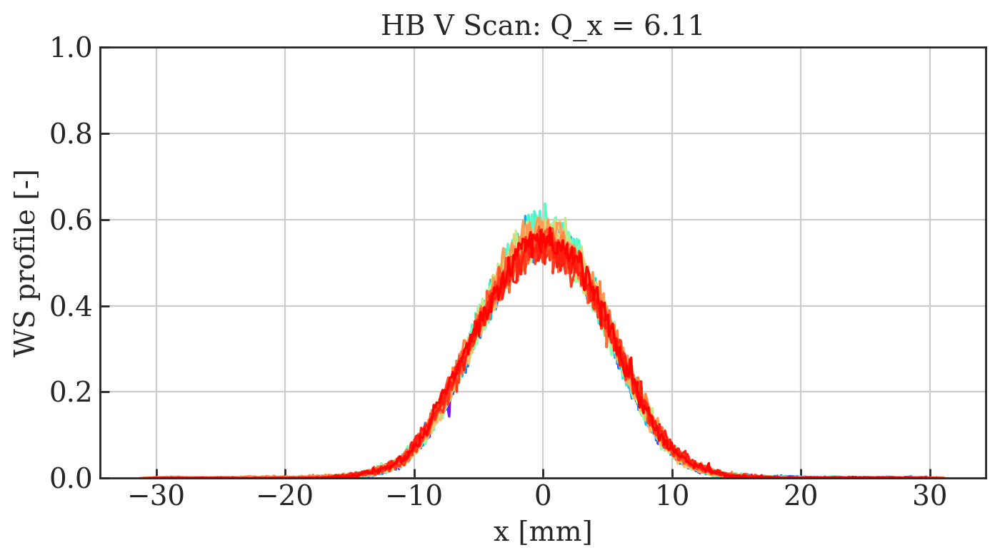

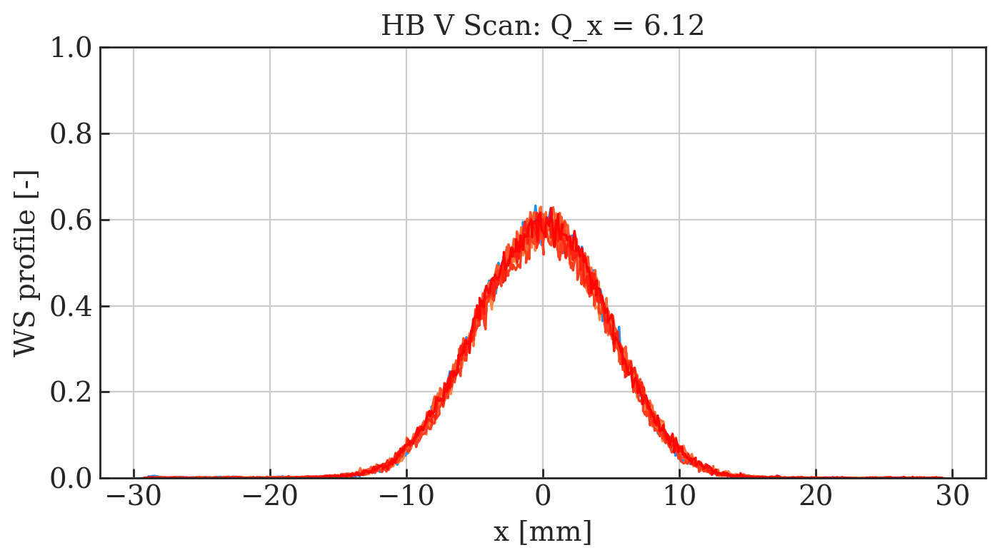

In [45]:
# Plot WS profiles grouped by Qx
for key, value in tune_points.iteritems():
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    for i in xrange(len(value)):
        # dataframe index = value[i]
        plt.plot(df0['position H'].iloc[value[i]], df0['profile H'].iloc[value[i]], color=colors[value[i]])
    plt.xlabel('x [mm]')
    plt.ylabel('WS profile [-]')
    title = str('HB V Scan: Q_x = ' + str(key))
    plt.title(title)
    plt.ylim(0, 1)
    plt.grid()
    savename = str('MD4224_HB_Horizontal_Manual_Fit_WS_Profiles_Qx=' + str(key) + '_Using_Sim_Optics.png')
#     fig.savefig(savename)

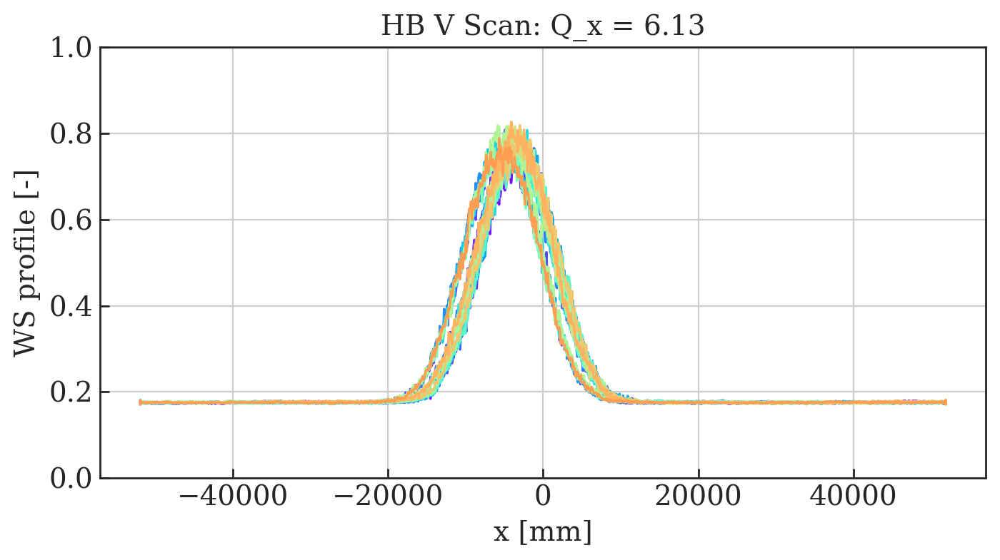

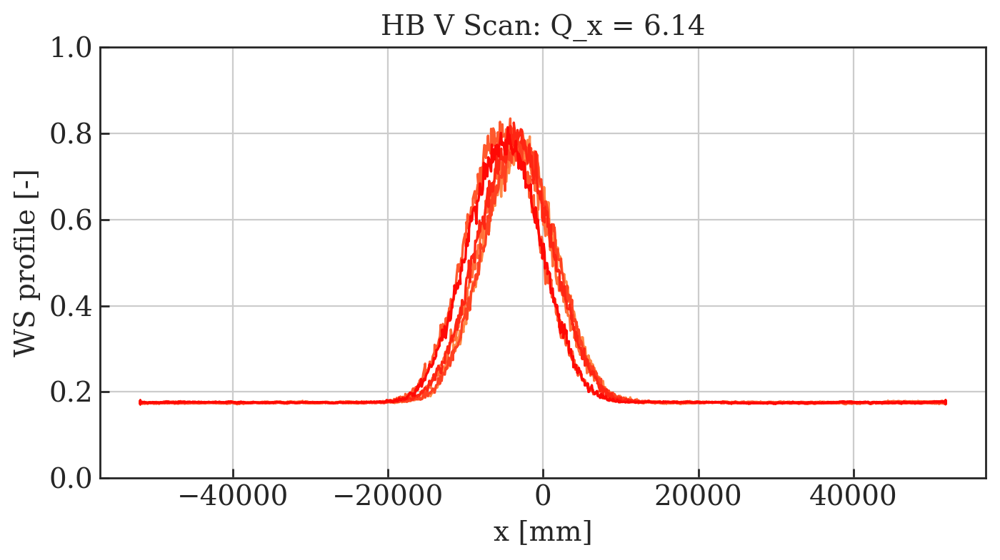

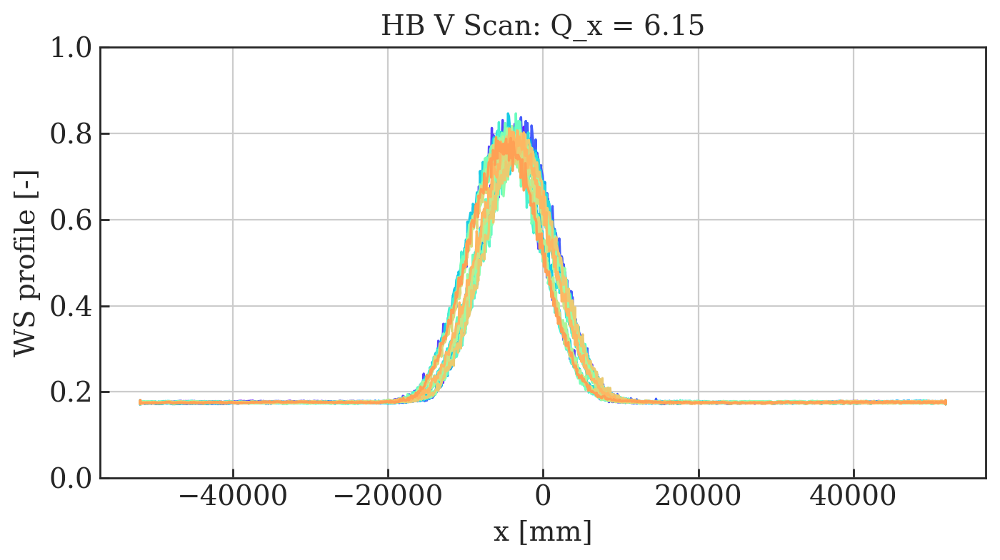

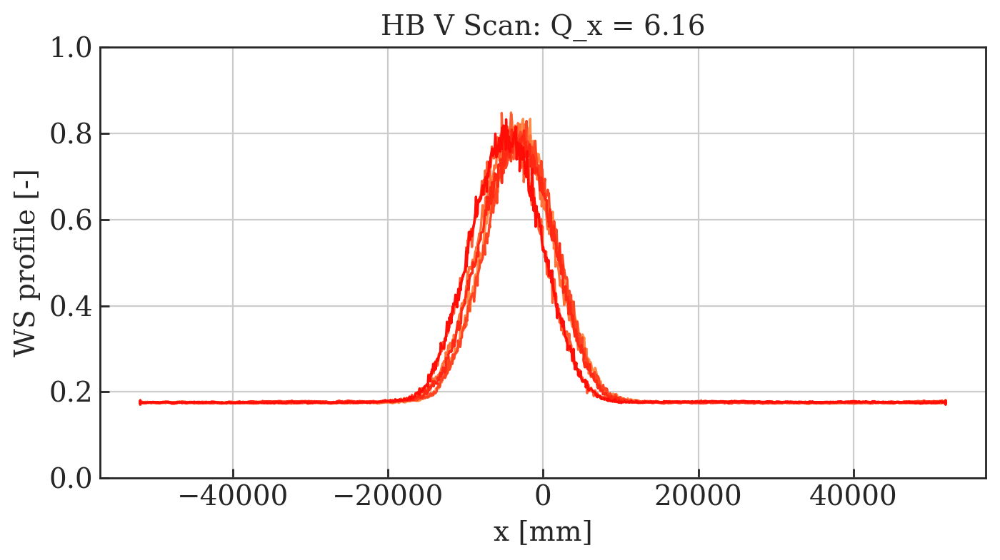

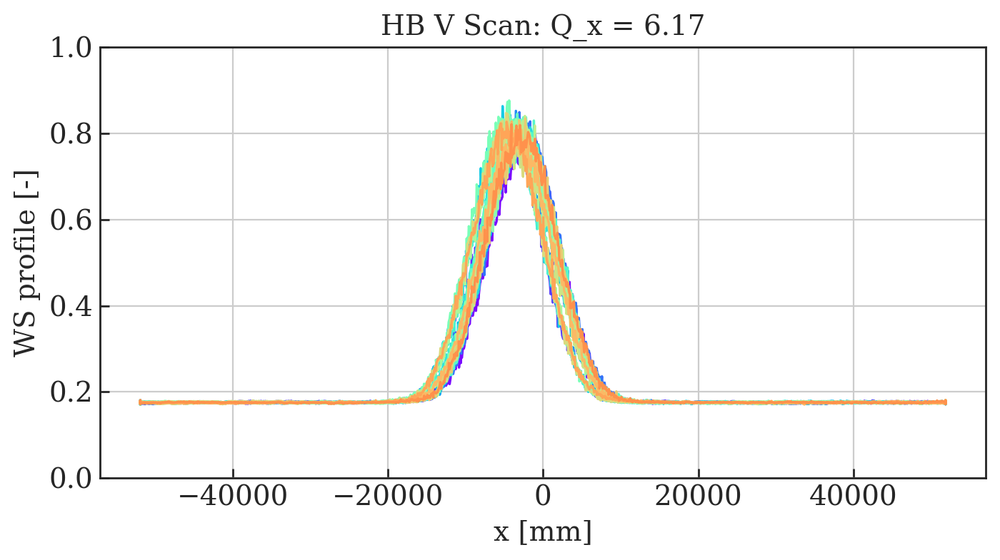

...

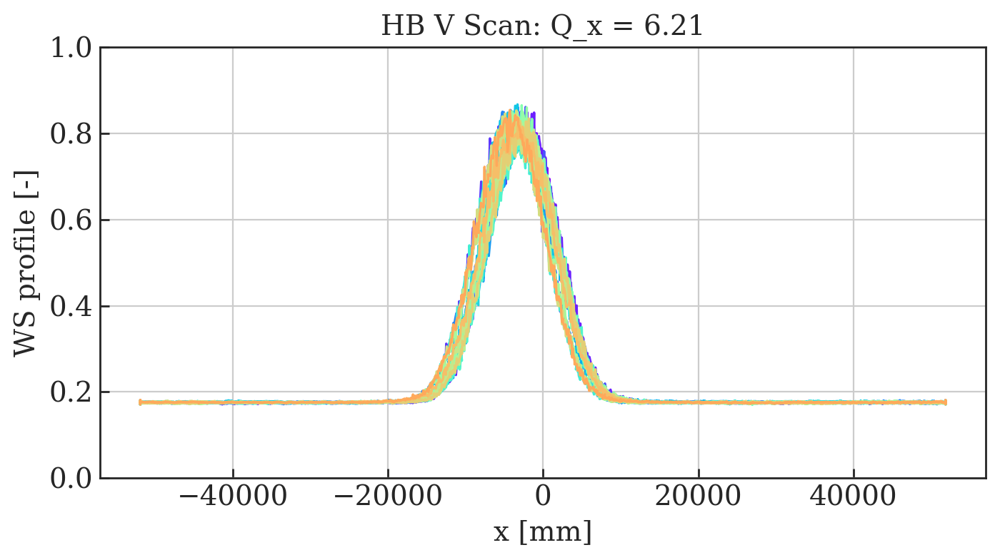

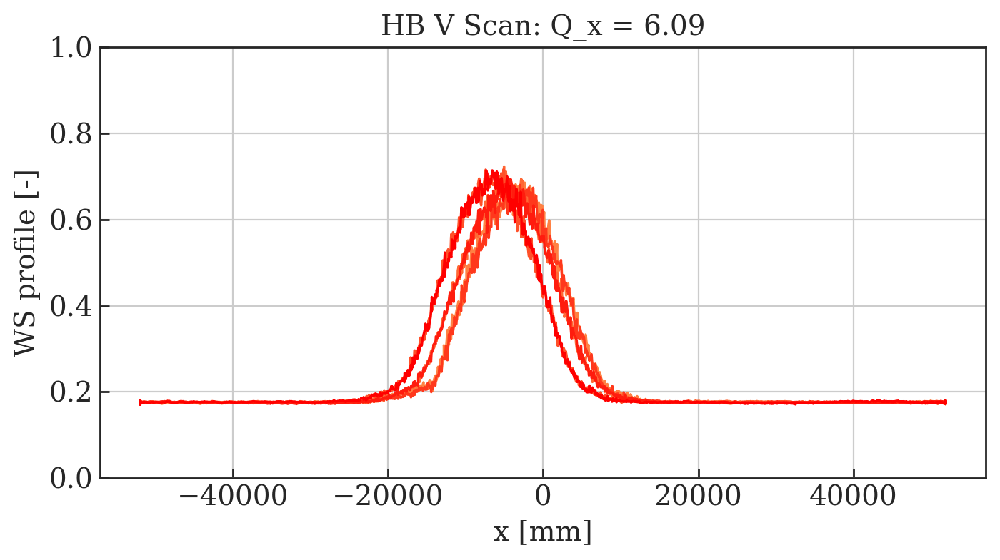

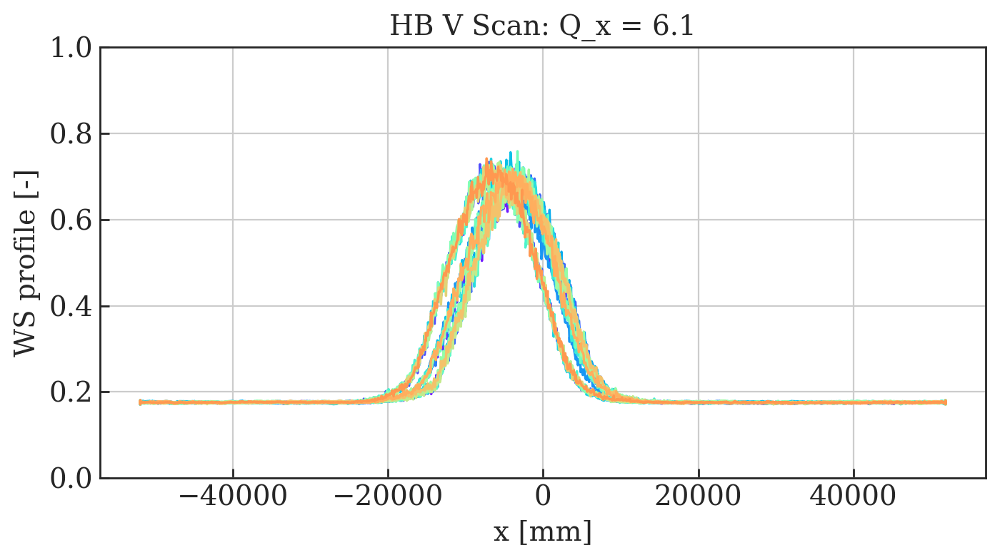

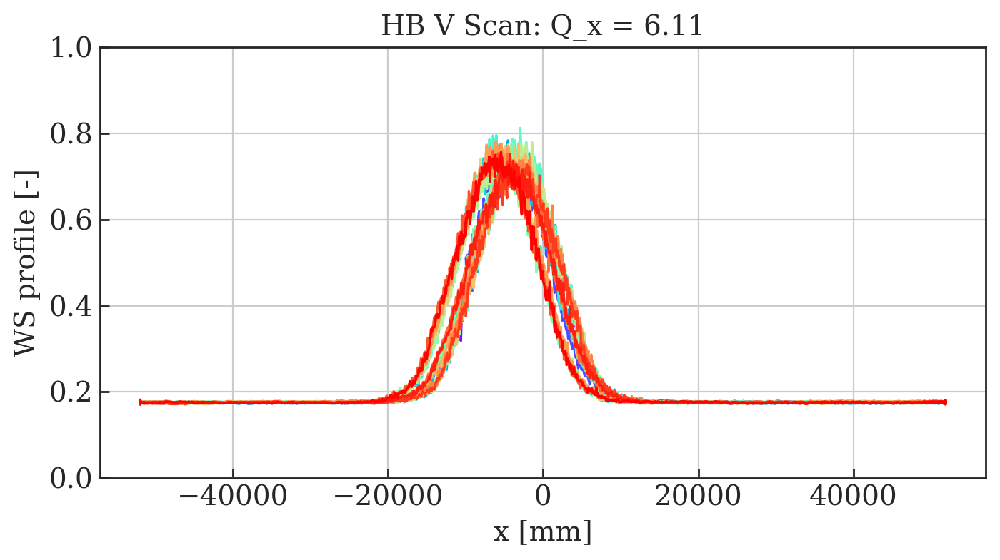

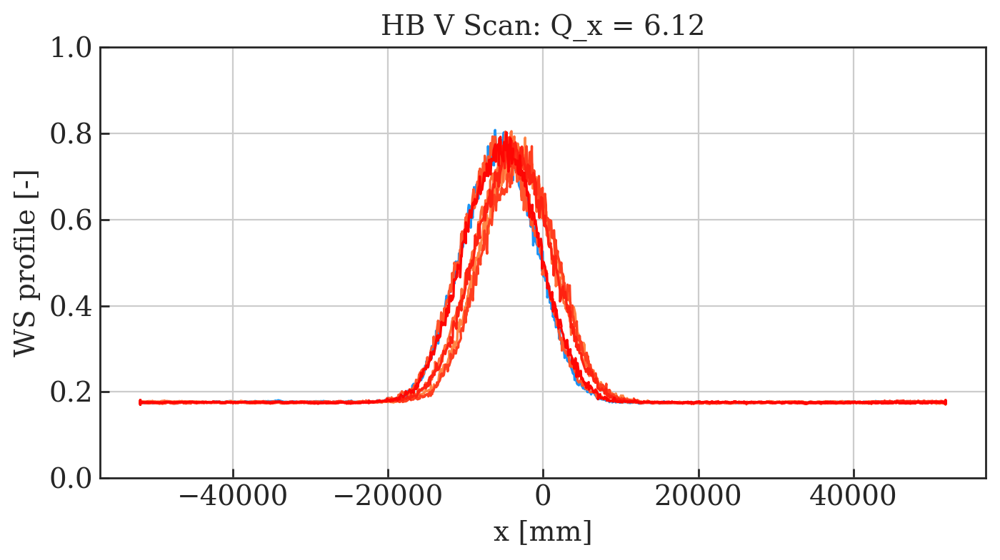

In [46]:
# Plot WS profiles grouped by Qx
for key, value in tune_points.iteritems():
    fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
    for i in xrange(len(value)):
        # dataframe index = value[i]
        plt.plot(df0['PR.BWS.65.H_ROT:PROF_POSITION_IN'].iloc[value[i]], df0['PR.BWS.65.H_ROT:PROF_DATA_IN'].iloc[value[i]], color=colors[value[i]])
    plt.xlabel('x [mm]')
    plt.ylabel('WS profile [-]')
    title = str('HB V Scan: Q_x = ' + str(key))
    plt.title(title)
    plt.ylim(0, 1)
    plt.grid()
    savename = str('MD4224_HB_Horizontal_Manual_Fit_WS_Profiles_Raw_Qx=' + str(key) + '_Using_Sim_Optics.png')
#     fig.savefig(savename)

## Plot Horizontal emittance

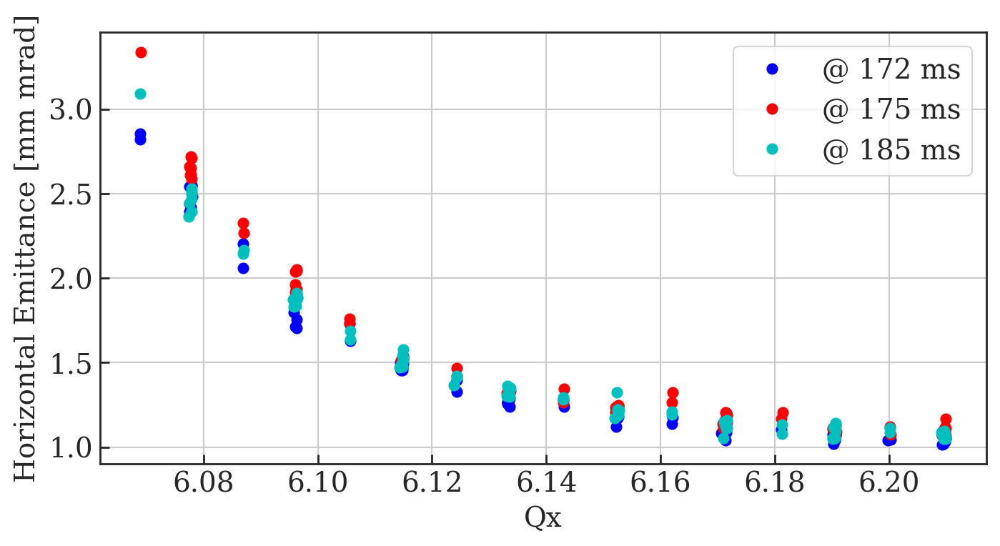

In [47]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
plt.plot(df0['Qx'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)]+6, df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)],'bo', label='@ 172 ms');
plt.plot(df0['Qx'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)]+6, df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)],'ro', label='@ 175 ms');
plt.plot(df0['Qx'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)]+6, df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)],'co', label='@ 185 ms');
plt.xlabel('Qx');
plt.ylabel('Horizontal Emittance [mm mrad]');
plt.legend();
#plt.title('Wire Scanner Acquisition Delay');
#plt.xlim(6.075, 6.25);
#plt.ylim(0,5);
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_Emittance_Using_Sim_Optics.png');

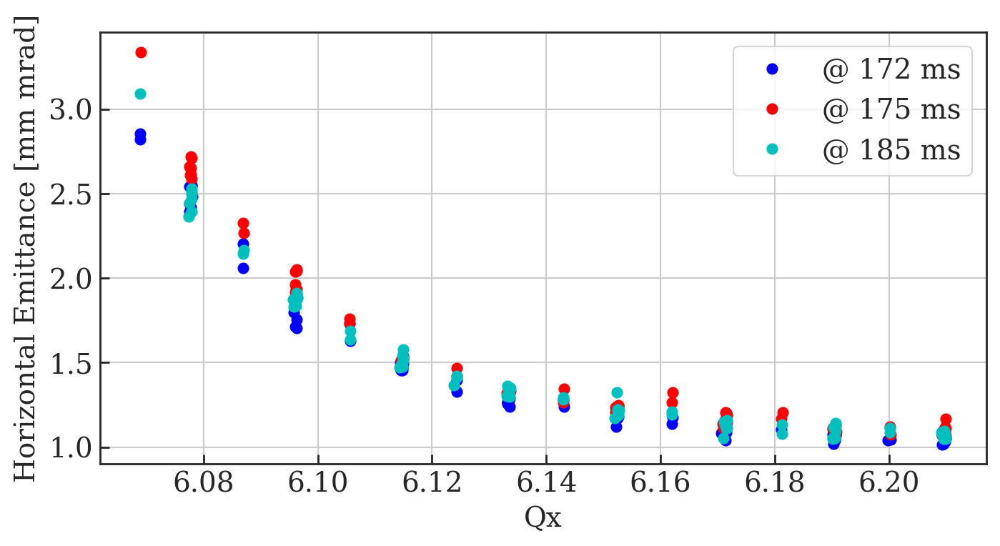

In [48]:
# Plot each shot: Qy vs Ey

fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
plt.plot(df0['Qx'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)]+6, df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)],'bo', label='@ 172 ms');
plt.plot(df0['Qx'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)]+6, df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)],'ro', label='@ 175 ms');
plt.plot(df0['Qx'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)]+6, df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)],'co', label='@ 185 ms');
plt.xlabel('Qx');
plt.ylabel('Horizontal Emittance [mm mrad]');
plt.legend();
#plt.title('Wire Scanner Acquisition Delay');
#plt.xlim(6.075, 6.25);
#plt.ylim(0,5);
plt.grid();
fig.savefig('MD4224_Horizontal_WS_Delay_Emittance_Using_Sim_Optics.png');

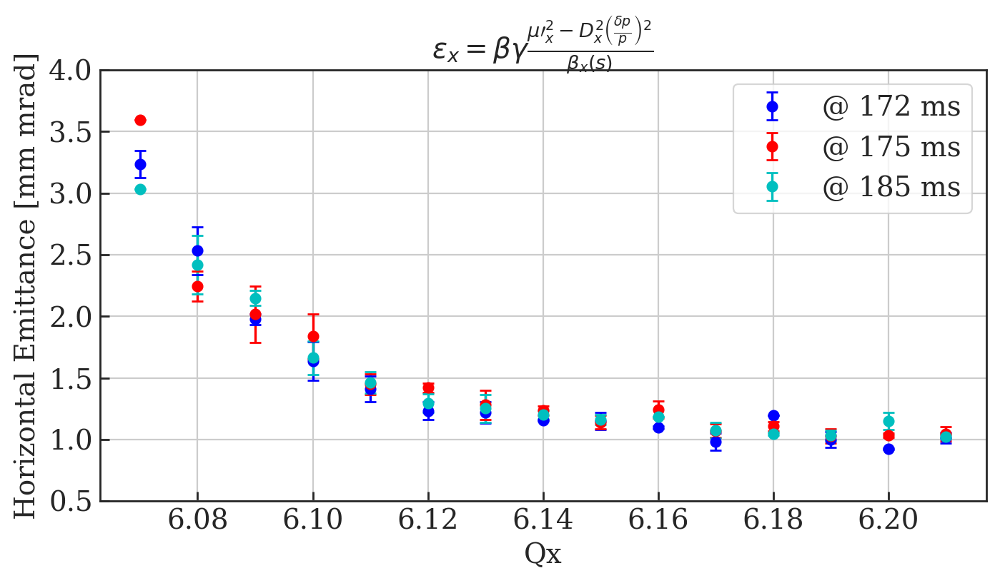

In [49]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qx');
plt.ylabel('Horizontal Emittance [mm mrad]');

plt.title(r'$\epsilon_{x} = \beta\gamma \frac{\mu\prime_x^2 - D_x^2 \left(\frac{\delta p}{p}\right)^2}{\beta_{x}(s)}$')

plt.ylim(0.5, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_Emittance_2nd_Errors_Using_Sim_Optics.png');

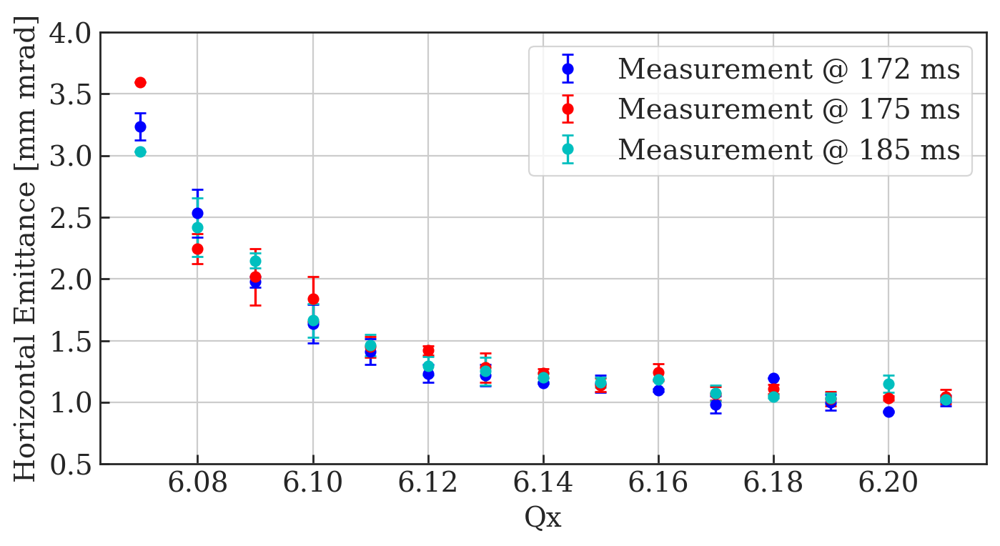

In [50]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='Measurement @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='Measurement @ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='Measurement @ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qx');
plt.ylabel('Horizontal Emittance [mm mrad]');

#plt.title(r'$\epsilon_{x} = \beta\gamma \frac{\mu\prime_x^2 - D_x^2 \left(\frac{\delta p}{p}\right)^2}{\beta_{x}(s)}$')

plt.ylim(0.5, 4)

plt.legend();
plt.grid();
fig.savefig('00_MD4224_Horizontal_Manual_Fit_WS_Delay_Emittance_2nd_Errors_Using_Sim_Optics.png');

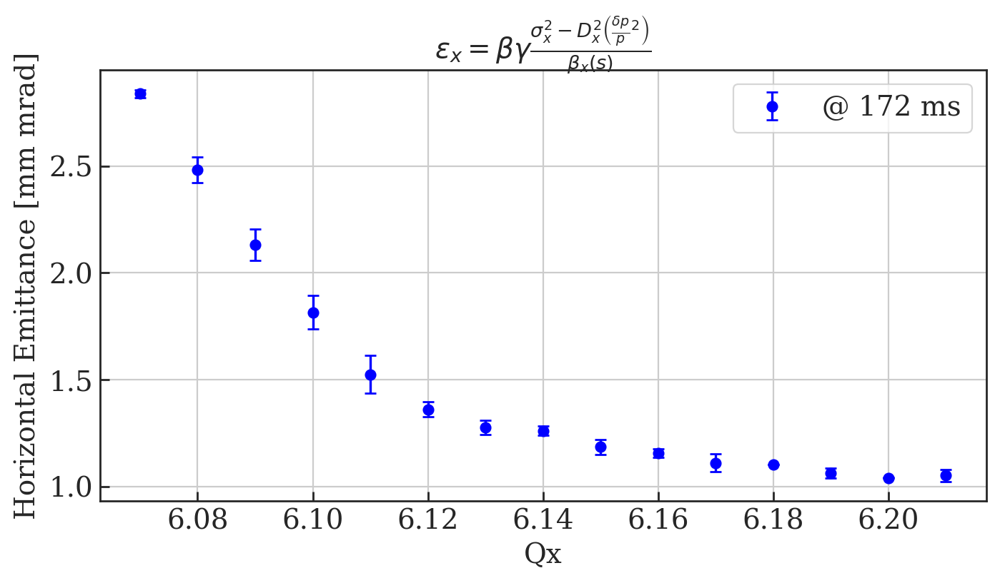

In [51]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_172.append( np.std( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
        
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.xlabel('Qx');
plt.ylabel('Horizontal Emittance [mm mrad]');
plt.title(r'$\epsilon_{x} = \beta\gamma \frac{\sigma_x^2 - D_x^2 \left(\frac{\delta p}{p}^2 \right)}{\beta_{x}(s)}$')
#plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$')

#plt.ylim(0, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_Emittance_Errors_Using_Sim_Optics_172.png');

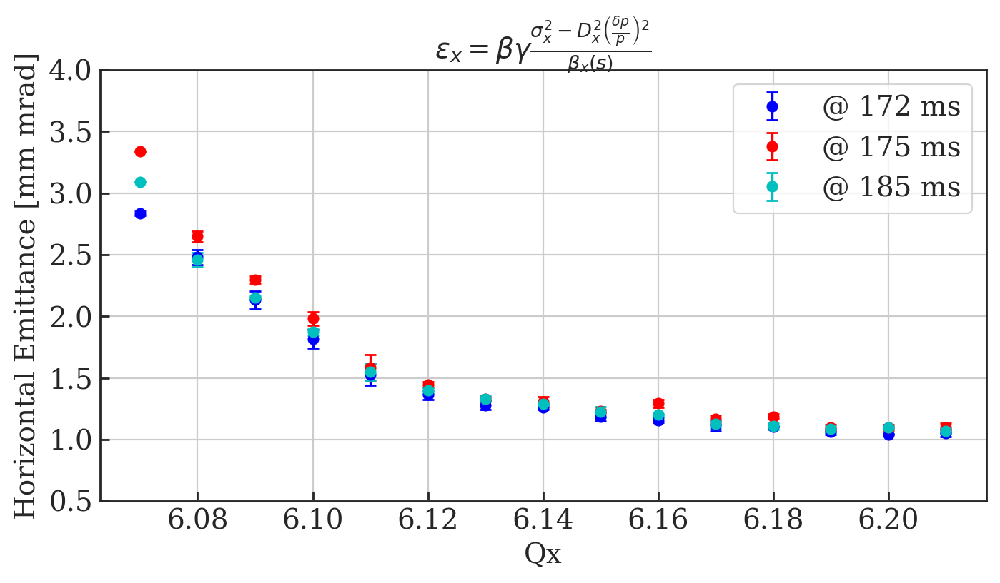

In [52]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qx');
plt.ylabel('Horizontal Emittance [mm mrad]');

plt.title(r'$\epsilon_{x} = \beta\gamma \frac{\sigma_x^2 - D_x^2 \left(\frac{\delta p}{p}\right)^2}{\beta_{x}(s)}$')

plt.ylim(0.5, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_Emittance_Errors_Using_Sim_Optics.png');

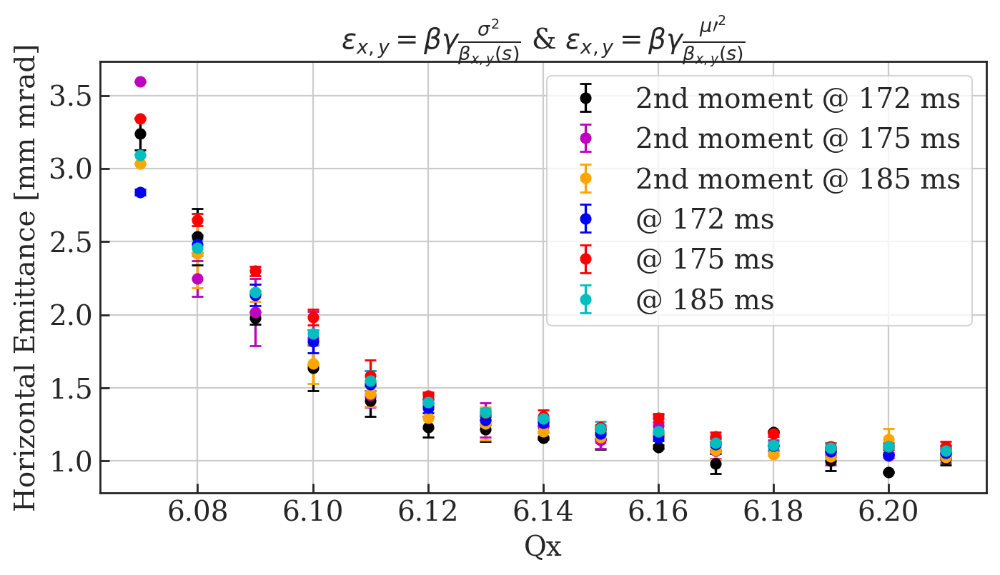

In [53]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

y_data_1722 = []
y_data_1752 = []
y_data_1852 = []

y_error_1722 = []
y_error_1752 = []
y_error_1852 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_175.append( np.std( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_185.append( np.std( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_data_1722.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_1752.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_1852.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_1722.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_1752.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_1852.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_1722, y_error_1722, label='2nd moment @ 172 ms', linestyle='None', marker='o', capsize=3, color='k')
plt.errorbar(x_data, y_data_1752, y_error_1752, label='2nd moment @ 175 ms', linestyle='None', marker='o', capsize=3, color='m')
plt.errorbar(x_data, y_data_1852, y_error_1852, label='2nd moment @ 185 ms', linestyle='None', marker='o', capsize=3, color='orange')

    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qx');
plt.ylabel('Horizontal Emittance [mm mrad]');

plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$ & $\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2}{\beta_{x,y}(s)}$')

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_Emittance_both_Errors_Using_Sim_Optics.png');

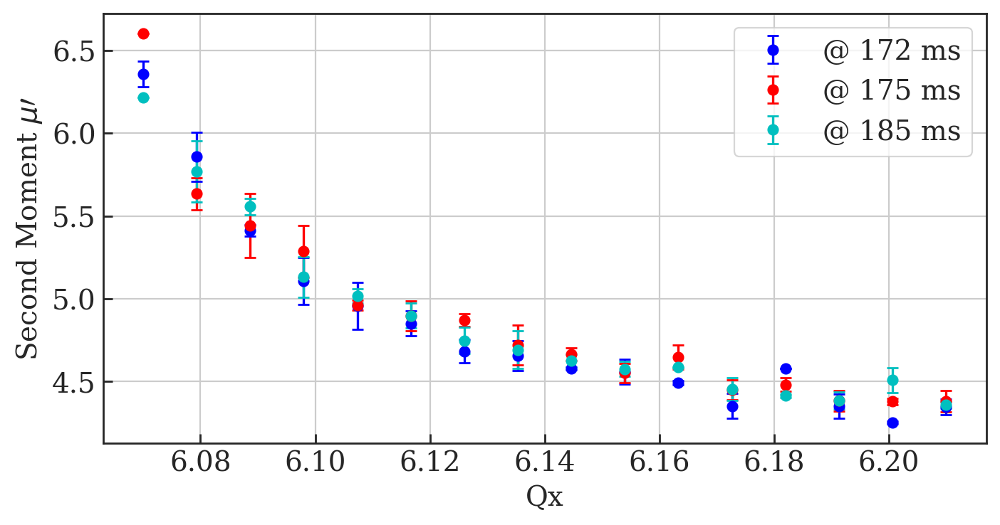

In [54]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_175.append( np.std( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_185.append( np.std( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qx');
plt.ylabel(r'Second Moment $\mu\prime$');

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_2nd_Moment_Errors_Using_Sim_Optics.png');

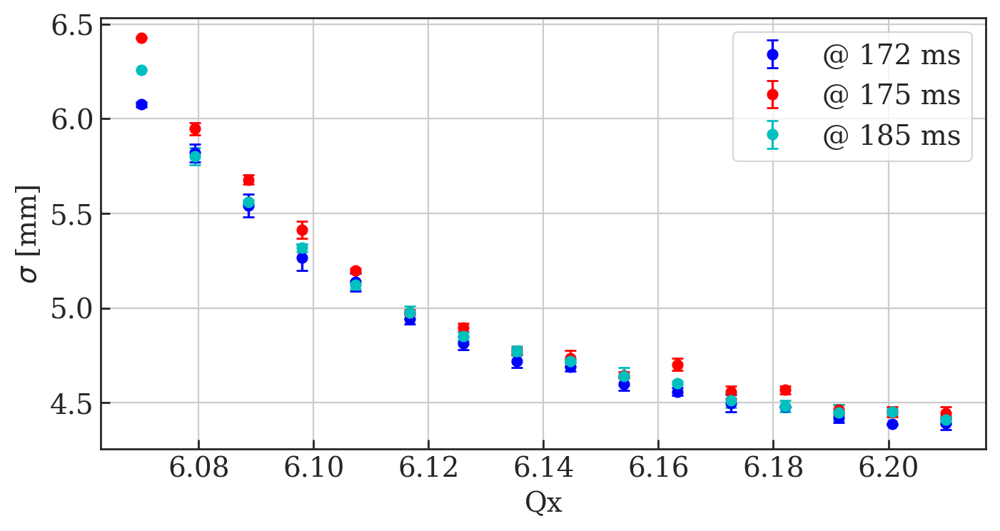

In [55]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_175.append( np.std( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_185.append( np.std( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

plt.xlabel('Qx');
plt.ylabel(r'$\sigma$ [mm]');

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_Sigma_Errors_Using_Sim_Optics.png');

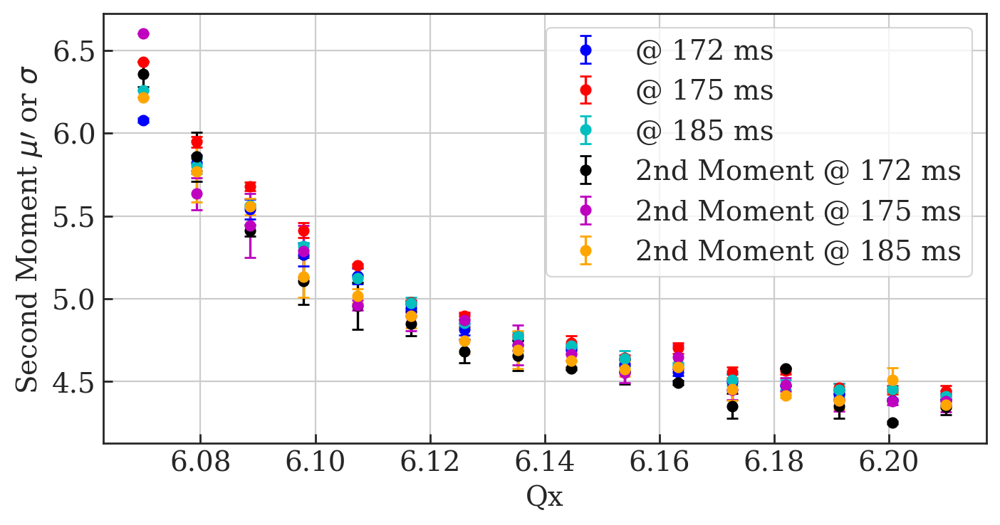

In [56]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
# Plot averaged data points with error bars
x_data = np.linspace(607, 621, 16);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

y_data_1722 = []
y_data_1752 = []
y_data_1852 = []

y_error_1722 = []
y_error_1752 = []
y_error_1852 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_1722.append( np.mean( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_1752.append( np.mean( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_1852.append( np.mean( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_1722.append( np.std( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_1752.append( np.std( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_1852.append( np.std( df0['2ndMoment H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_data_172.append( np.mean( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_175.append( np.mean( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_data_185.append( np.mean( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_175.append( np.std( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==175)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_185.append( np.std( df0['sig H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==185)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')
plt.errorbar(x_data, y_data_175, y_error_175, label='@ 175 ms', linestyle='None', marker='o', capsize=3, color='r')
plt.errorbar(x_data, y_data_185, y_error_185, label='@ 185 ms', linestyle='None', marker='o', capsize=3, color='c')

    
plt.errorbar(x_data, y_data_1722, y_error_1722, label='2nd Moment @ 172 ms', linestyle='None', marker='o', capsize=3, color='k')
plt.errorbar(x_data, y_data_1752, y_error_1752, label='2nd Moment @ 175 ms', linestyle='None', marker='o', capsize=3, color='m')
plt.errorbar(x_data, y_data_1852, y_error_1852, label='2nd Moment @ 185 ms', linestyle='None', marker='o', capsize=3, color='orange')

plt.xlabel('Qx');
plt.ylabel(r'Second Moment $\mu\prime$ or $\sigma$');

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_2nd_Moment_and_Sigma_Errors_Using_Sim_Optics.png');

In [57]:
np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>.05)][(df0['Qx']<.1045)] )

2.202622639850918

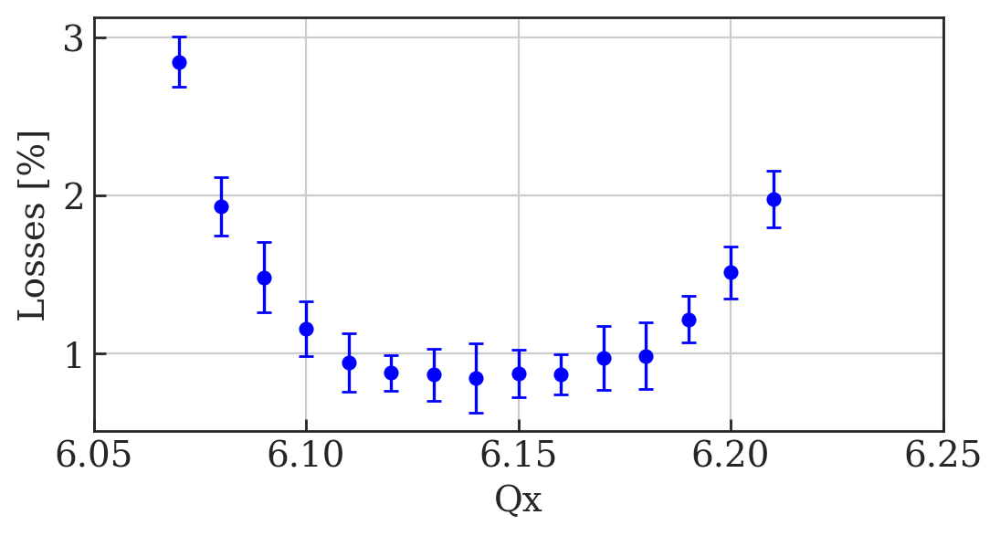

In [58]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(6, 3), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_data_175 = []
y_data_185 = []

y_error_172 = []
y_error_175 = []
y_error_185 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['losses'][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
    y_error_172.append( np.std( df0['losses'][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='@ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.xlabel('Qx');
plt.ylabel('Losses [%]');
plt.xlim(6.05, 6.25)

#plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Losses_Errors_Using_Sim_Optics.png');

# Load Distributions From Simulation Data

In [11]:
# Read .mat files into a dictionary

# matfiles = glob.glob("13_May/*.mat")
#matfiles = glob.glob("../Simulation_Output/V_Scan_Matched_Initial/Bunch_Profiles/*.mat")
matfiles = glob.glob("../MD4224_Repo_Outputs/H_Optimised/Simulation_Profiles/*.mat")
sims = dict()

for f in matfiles:
    first = f.split('/')[-1]
    second = first.split('.')[0]
    sims[str(second)] = f
    
sims

{'607_SbS_c172': '../MD4224_Repo_Outputs/H_Optimised/Simulation_Profiles/607_SbS_c172.mat',
 '608_SbS_c172': '../MD4224_Repo_Outputs/H_Optimised/Simulation_Profiles/608_SbS_c172.mat',
 '609_SbS_c172': '../MD4224_Repo_Outputs/H_Optimised/Simulation_Profiles/609_SbS_c172.mat',
 '610_SbS_c172': '../MD4224_Repo_Outputs/H_Optimised/Simulation_Profiles/610_SbS_c172.mat',
 '611_SbS_c172': '../MD4224_Repo_Outputs/H_Optimised/Simulation_Profiles/611_SbS_c172.mat',
 '612_SbS_c172': '../MD4224_Repo_Outputs/H_Optimised/Simulation_Profiles/612_SbS_c172.mat',
 '613_SbS_c172': '../MD4224_Repo_Outputs/H_Optimised/Simulation_Profiles/613_SbS_c172.mat',
 '614_SbS_c172': '../MD4224_Repo_Outputs/H_Optimised/Simulation_Profiles/614_SbS_c172.mat',
 '615_SbS_c172': '../MD4224_Repo_Outputs/H_Optimised/Simulation_Profiles/615_SbS_c172.mat',
 '616_SbS_c172': '../MD4224_Repo_Outputs/H_Optimised/Simulation_Profiles/616_SbS_c172.mat',
 '617_SbS_c172': '../MD4224_Repo_Outputs/H_Optimised/Simulation_Profiles/617_SbS

# Dictionary of tune points

In [12]:
# These are our tune points:
scan_points = np.linspace(607, 621, 15);
scan_points = scan_points/100;

Qy_points=[]
for i in scan_points:
    Qy_points.append(round_sig(i,5))
print Qy_points

[6.07, 6.08, 6.09, 6.1, 6.11, 6.12, 6.13, 6.14, 6.15, 6.16, 6.17, 6.18, 6.19, 6.2, 6.21]


In [13]:
# Make dictionary of nearest tune point and iterators
Qy_point_separation = Qy_points[1] - Qy_points[0]
Qy_pt_sep = Qy_point_separation/2
print 'Tune points separated by +/- ', Qy_pt_sep

tune_points = {}
for i in Qy_points:
    tune_points[i] = np.where(np.logical_and(np.greater_equal(df0['Qx'], (i-Qy_pt_sep-6)), np.less_equal(df0['Qx'], (i+Qy_pt_sep-6)) ) )[0]
tune_points

Tune points separated by +/-  0.005


{6.07: array([187, 202, 209, 217]),
 6.08: array([  8,  15,  23,  31,  39,  46,  54,  62,  76,  84,  91,  99, 107,
        114, 128, 136, 142, 148, 155, 163, 171, 179]),
 6.09: array([186, 194, 201, 208, 216, 224]),
 6.1: array([  7,  14,  22,  30,  38,  45,  53,  61,  69,  75,  83,  90,  98,
        106, 113, 121, 127, 135, 141, 154, 162, 170, 178]),
 6.11: array([  6,  21,  29,  37,  52,  60,  68,  82,  89,  97, 105, 112, 120,
        134, 140, 153, 161, 169, 177, 185, 193, 200, 207, 215, 223]),
 6.12: array([ 44, 184, 192, 199, 206, 214, 222]),
 6.13: array([  5,  13,  20,  28,  36,  43,  51,  59,  67,  74,  81,  96, 104,
        111, 119, 126, 133, 147, 160, 168, 176]),
 6.14: array([183, 191, 198, 205, 213, 221]),
 6.15: array([  4,  12,  19,  27,  35,  50,  58,  66,  73,  80,  88,  95, 103,
        110, 118, 125, 132, 146, 152, 159, 167, 175]),
 6.16: array([182, 190, 197, 204, 212, 220]),
 6.17: array([  3,  11,  18,  26,  34,  42,  49,  57,  65,  72,  79,  87,  94,
        102,

# Function to find Peak

# Test Peakfinder

In [19]:
peak = peakfinder(np.array(df0['position H'].iloc[0]), np.array(df0['profile H'].iloc[0]),tolerance = 0.01, verbose=True)
print peak



	MAX(y_dat) =  0.6728868609218155
	index from y_dat peak not within tolerance of 0.01 mm. 
	try manual search
	index =  0
	index of x_dat =  -26.44740240003148  is  0
	Mean of peak point +/- 3 points =  -0.0009820836308117667
	 using peak value
0.6728868609218155


In [26]:
%run ../MD_Functions.ipynb


	Importing MD Analysis functions for MD4224



	MAX(y_dat) =  66.47322144178487
	MAX(y_dat) index =  239
	abs(x_dat[index]) =  0.0014539062811590661
	index =  255
	index of x_dat =  8.174969858610465e-05  is  255

Taking the average of centre  61  points
	Mean of  61  points about centre =  58.78365766844209
peak @ 58.78365766844209


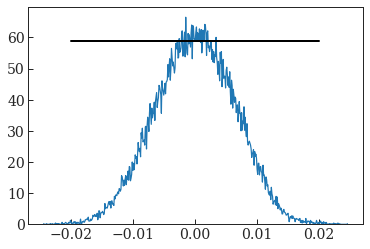

In [19]:
matfiles = glob.glob("../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/*.mat")
plt.clf()

d = particles_from_matfile("../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/607_SbS_c172.mat")
x, bins_, p = plt.hist(d['particles']['x'][0][0][0], bins = 512, density=True, histtype=u'step', lw=0, color='k')
    
    
peak = peakfinder(np.array(bins_[:-1]), np.array(x), verbose=True)
print 'peak @', peak

plt.plot(bins_[:-1], x);

plt.plot([-0.02, 0.02], [peak, peak], color='k', linestyle='-', linewidth=2)


	MAX(y_dat) =  82.16641001741854
	MAX(y_dat) index =  246
	abs(x_dat[index]) =  0.0006791937982714054
	index =  256
	index of x_dat =  4.372935228861077e-05  is  256

Taking the average of centre  61  points
	Mean of  61  points about centre =  72.72840707839953
peak @ 72.72840707839953


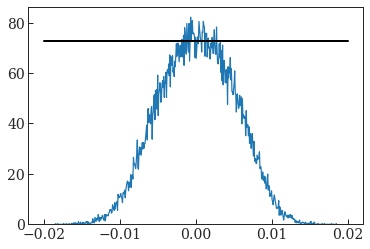

In [20]:
matfiles = glob.glob("../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/*.mat")
plt.clf()

d = particles_from_matfile("../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/610_SbS_c172.mat")
x, bins_, p = plt.hist(d['particles']['x'][0][0][0], bins = 512, density=True, histtype=u'step', lw=0, color='k')
    
    
peak = peakfinder(np.array(bins_[:-1]), np.array(x), verbose=True)
print 'peak @', peak

plt.plot(bins_[:-1], x);

plt.plot([-0.02, 0.02], [peak, peak], color='k', linestyle='-', linewidth=2)


	MAX(y_dat) =  94.99317145795418
	MAX(y_dat) index =  231
	abs(x_dat[index]) =  0.0008740215380098164
	index =  244
	index of x_dat =  2.646424099023159e-05  is  244

Taking the average of centre  61  points
	Mean of  61  points about centre =  82.40725073909816
peak @ 82.40725073909816


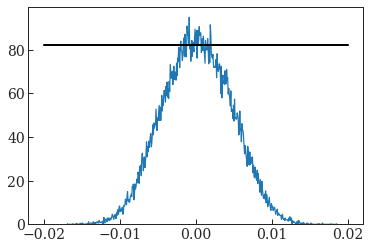

In [21]:
matfiles = glob.glob("../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/*.mat")
plt.clf()

d = particles_from_matfile("../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/613_SbS_c172.mat")
x, bins_, p = plt.hist(d['particles']['x'][0][0][0], bins = 512, density=True, histtype=u'step', lw=0, color='k')
    
    
peak = peakfinder(np.array(bins_[:-1]), np.array(x), verbose=True)
print 'peak @', peak

plt.plot(bins_[:-1], x);

plt.plot([-0.02, 0.02], [peak, peak], color='k', linestyle='-', linewidth=2)


	MAX(y_dat) =  96.26120379583521
	MAX(y_dat) index =  272
	abs(x_dat[index]) =  0.0018835492919675526
	index =  244
	index of x_dat =  3.9400320212421014e-05  is  244

Taking the average of centre  61  points
	Mean of  61  points about centre =  83.59695895658349
peak @ 83.59695895658349


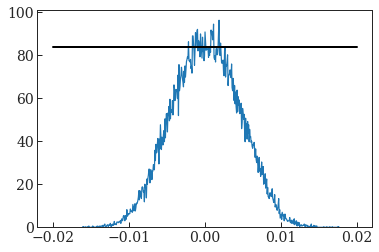

In [22]:
matfiles = glob.glob("../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/*.mat")
plt.clf()

d = particles_from_matfile("../MD4224_Repo_Outputs/H_Mini_Optimised/Simulation_Profiles/614_SbS_c172.mat")
x, bins_, p = plt.hist(d['particles']['x'][0][0][0], bins = 512, density=True, histtype=u'step', lw=0, color='k')
    
    
peak = peakfinder(np.array(bins_[:-1]), np.array(x), verbose=True)
print 'peak @', peak

plt.plot(bins_[:-1], x);

plt.plot([-0.02, 0.02], [peak, peak], color='k', linestyle='-', linewidth=2)


	MAX(y_dat) =  0.6690367967954023
	MAX(y_dat) index =  283
	abs(x_dat[index]) =  2.8901059516376337
	index =  0
	index of x_dat =  26.213105951637637  is  0

Taking the average of centre  61  points
	Mean of  61  points about centre =  0.0008571921882144142
	 using peak value
peak @ 0.6690367967954023


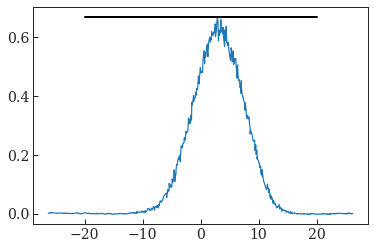

In [23]:
plt.clf()
i = 1
peak = peakfinder(np.flip(np.array(df0['position H'].iloc[i])), np.array(df0['profile H'].iloc[i]), peak_points = 30, verbose=True)
print 'peak @', peak

plt.plot(np.flip(np.array(df0['position H'].iloc[i])), np.array(df0['profile H'].iloc[i]))

plt.plot([-20, 20], [peak, peak], color='k', linestyle='-', linewidth=2)

In [127]:
i=1
print len(df0['position H'].iloc[i])
print df0['position H'].iloc[i][283]
print df0['profile H'].iloc[i][283]

595
0.3831059516376336
0.6690367967954023



	MAX(y_dat) =  0.6690367967954023
	MAX(y_dat) index =  283
	abs(x_dat[index]) =  0.3831059516376336
	index =  279
	index of x_dat =  0.056105951637633655  is  279

Taking the average of centre  61  points
	Mean of  61  points about centre =  0.5846271631745636
peak @ 0.5846271631745636


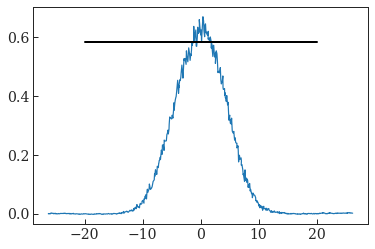

In [129]:
plt.clf()
i = 1
peak = peakfinder(np.array(df0['position H'].iloc[i]), np.array(df0['profile H'].iloc[i]), vertical=0, verbose=True)
print 'peak @', peak

plt.plot(np.array(df0['position H'].iloc[i]), np.array(df0['profile H'].iloc[i]));

plt.plot([-20, 20], [peak, peak], color='k', linestyle='-', linewidth=2)

# Check all simulation data peaks

In [106]:
for key, value in sorted(sims.iteritems()):
    print value
    d = particles_from_matfile(value)
    plt.clf()
    x, bins_, p = plt.hist(d['particles']['x'][0][0][0], bins = 1000, density=True, histtype=u'step', lw=0, color='k')

    peak = peakfinder(np.array(bins_[:-1]), np.array(x), verbose=True)
    print '\n peak = ', peak, '\n'
    plt.close()

../MD4224_Repo_Outputs/H_Optimised/Simulation_Profiles/607_SbS_c172.mat

	MAX(y_dat) =  64.42944157795411
	MAX(y_dat) index =  508
	abs(x_dat[index]) =  0.000292514120672948

index from y_dat peak not within tolerance of 0.001 mm. 
	try manual search
	index =  514
	index of x_dat =  1.9455058443414858e-05  is  514

Taking the average of centre  61  points
	Mean of peak point +/- 5 points =  60.31301980530092

 peak =  60.31301980530092 

../MD4224_Repo_Outputs/H_Optimised/Simulation_Profiles/608_SbS_c172.mat

	MAX(y_dat) =  65.41413715760194
	MAX(y_dat) index =  526
	abs(x_dat[index]) =  0.0006638845231837914

index from y_dat peak not within tolerance of 0.001 mm. 
	try manual search
	index =  512
	index of x_dat =  2.4817773754966244e-05  is  512

Taking the average of centre  61  points
	Mean of peak point +/- 5 points =  61.384695836308474

 peak =  61.384695836308474 

../MD4224_Repo_Outputs/H_Optimised/Simulation_Profiles/609_SbS_c172.mat

	MAX(y_dat) =  69.8710719234777
	MAX(y_d

# Plot wirescanner profiles with simulation data


Importing simulation file: 607_SbS_c172
Qx =  6.07 , ctime = 172.0 [ms]
[187, 209]
	abs(x_dat[index]) =  0.047846252612343765

Taking the average of centre  61  points
	abs(x_dat[index]) =  0.2925141206729478

Taking the average of centre  61  points
	abs(x_dat[index]) =  1.275122575218134

Taking the average of centre  61  points
	abs(x_dat[index]) =  0.2925141206729478

Taking the average of centre  61  points

Importing simulation file: 608_SbS_c172
Qx =  6.08 , ctime = 172.0 [ms]
[8, 31, 54, 76, 99, 142, 163]
	abs(x_dat[index]) =  0.8029542374275827

Taking the average of centre  61  points
	abs(x_dat[index]) =  0.6638845231837927

Taking the average of centre  61  points
	abs(x_dat[index]) =  2.113813808055494

Taking the average of centre  61  points
	abs(x_dat[index]) =  0.6638845231837927

Taking the average of centre  61  points
	abs(x_dat[index]) =  0.25228847814752164

Taking the average of centre  61  points
	abs(x_dat[index]) =  0.6638845231837927

Taking the average of c


Importing simulation file: 616_SbS_c172
Qx =  6.16 , ctime = 172.0 [ms]
[182, 204]
	abs(x_dat[index]) =  1.3164533116155823

Taking the average of centre  61  points
	abs(x_dat[index]) =  0.4676566163131639

Taking the average of centre  61  points
	abs(x_dat[index]) =  0.7208570118015731

Taking the average of centre  61  points
	abs(x_dat[index]) =  0.4676566163131639

Taking the average of centre  61  points

Importing simulation file: 617_SbS_c172
Qx =  6.17 , ctime = 172.0 [ms]
[3, 26, 49, 72, 94, 117, 139, 158, 181]
	abs(x_dat[index]) =  0.7367820659879414

Taking the average of centre  61  points
	abs(x_dat[index]) =  0.46555781298564725

Taking the average of centre  61  points
	abs(x_dat[index]) =  0.26933612794721107

Taking the average of centre  61  points
	abs(x_dat[index]) =  0.46555781298564725

Taking the average of centre  61  points
	abs(x_dat[index]) =  0.026012658935334443

Taking the average of centre  61  points
	abs(x_dat[index]) =  0.46555781298564725

Taking t

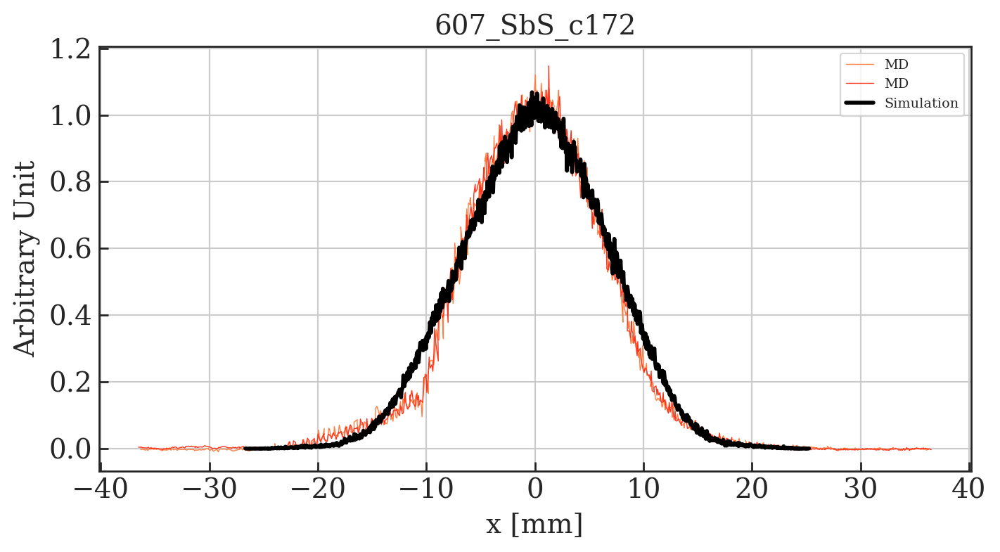

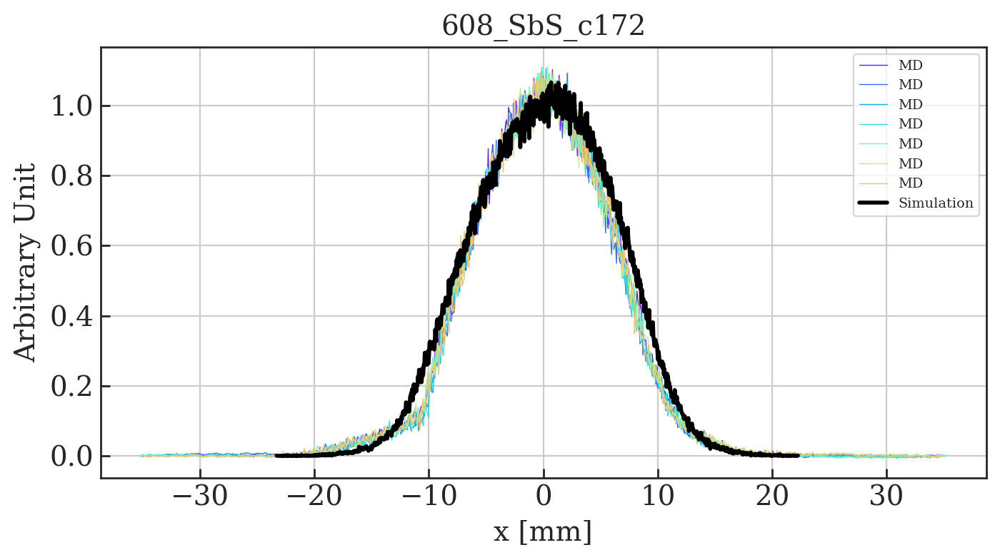

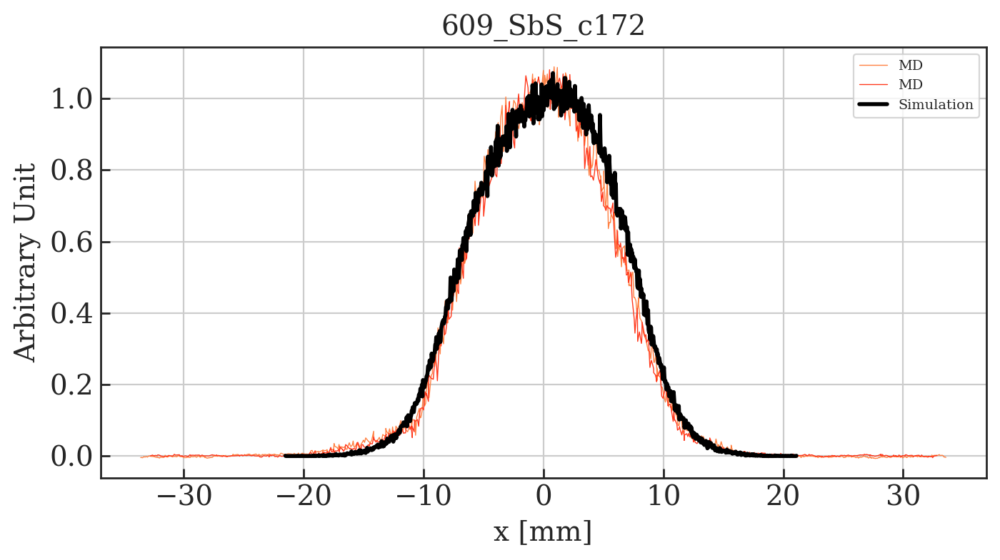

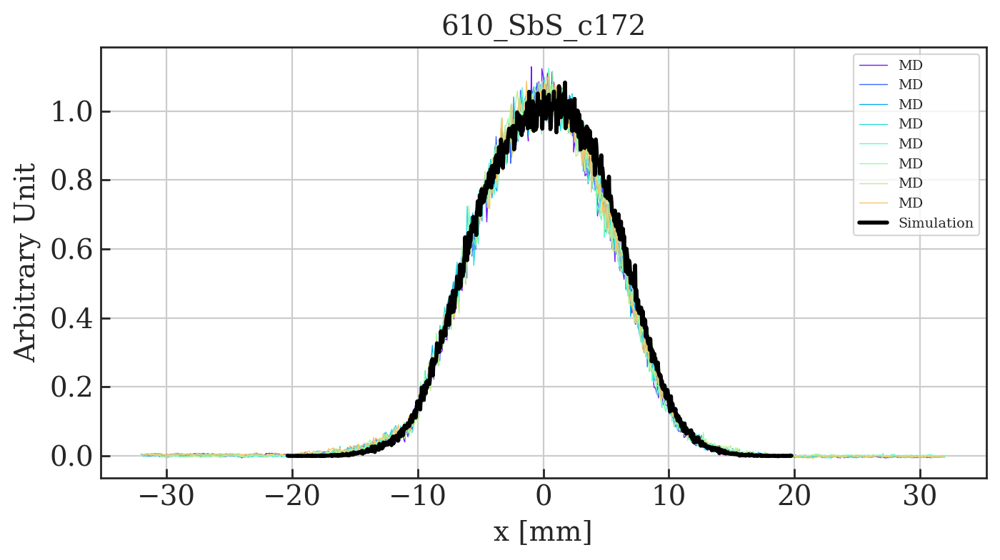

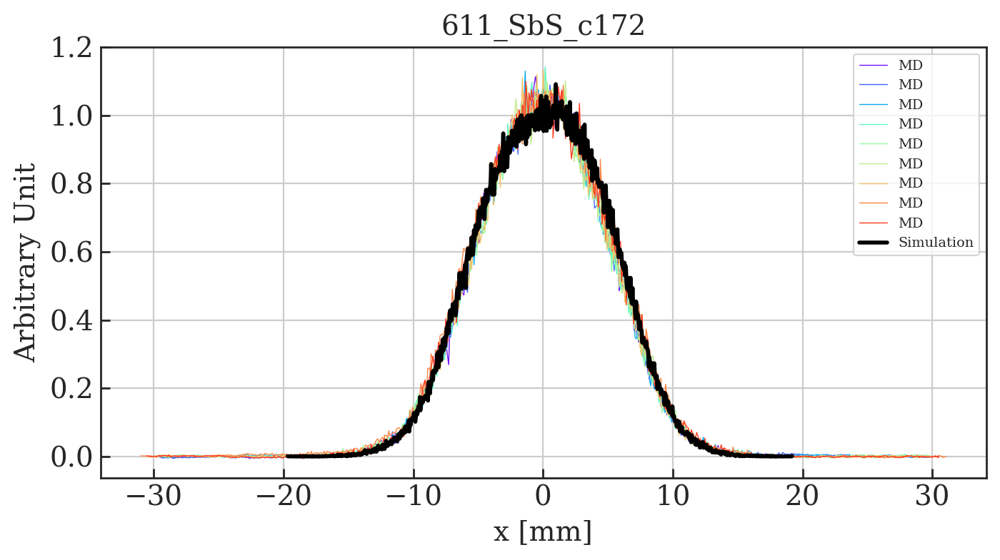

...

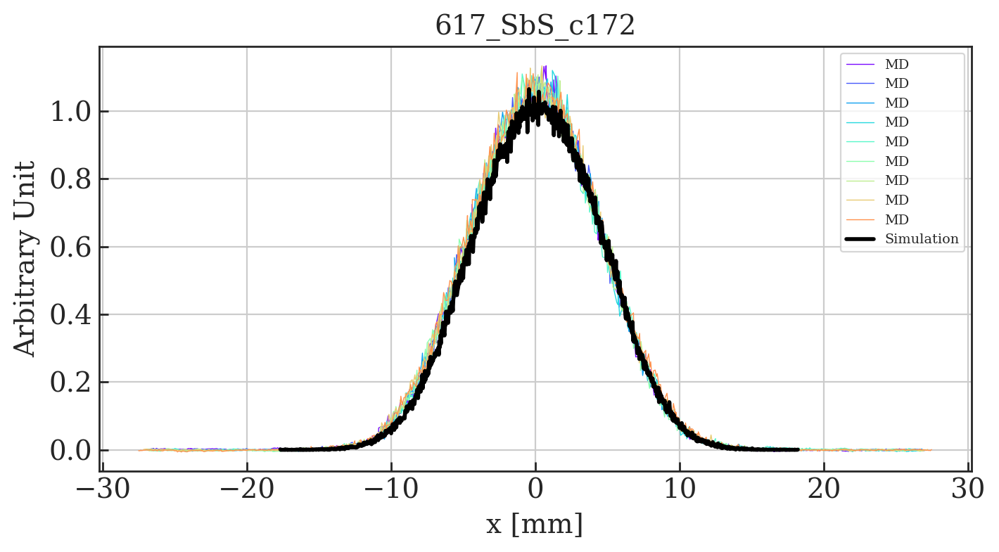

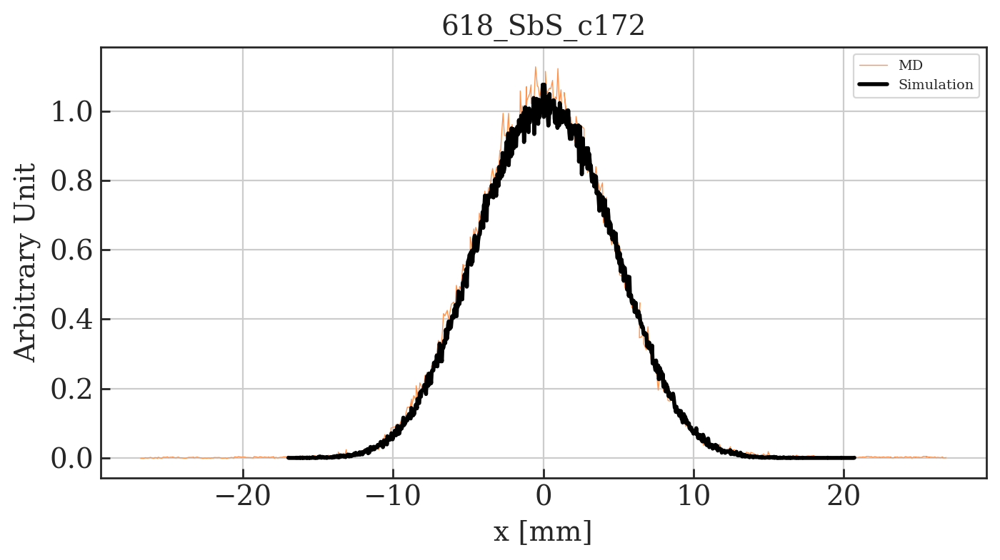

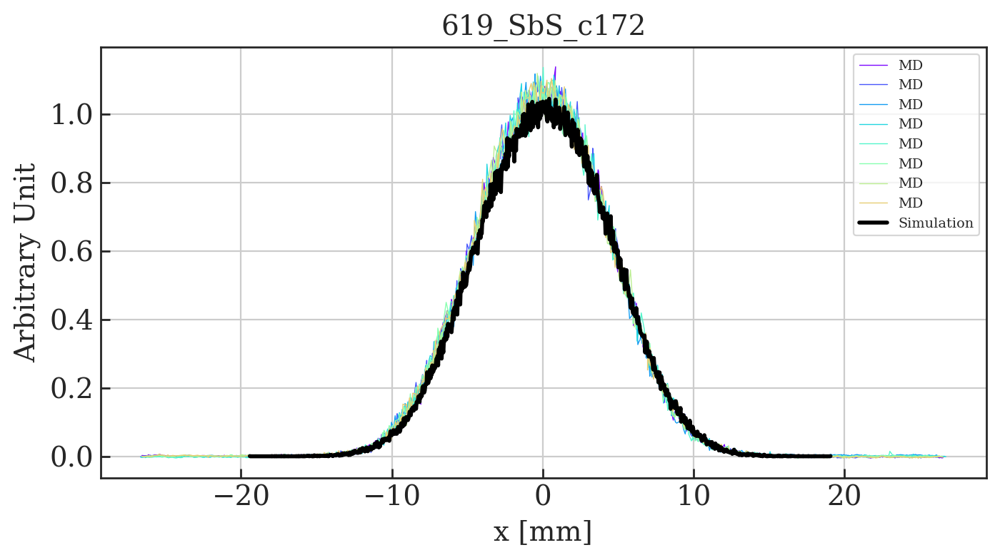

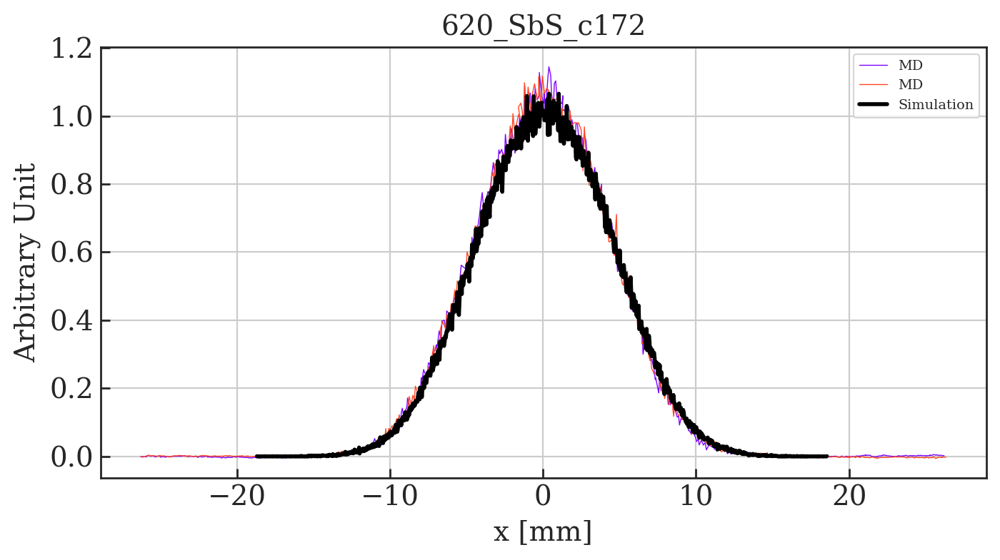

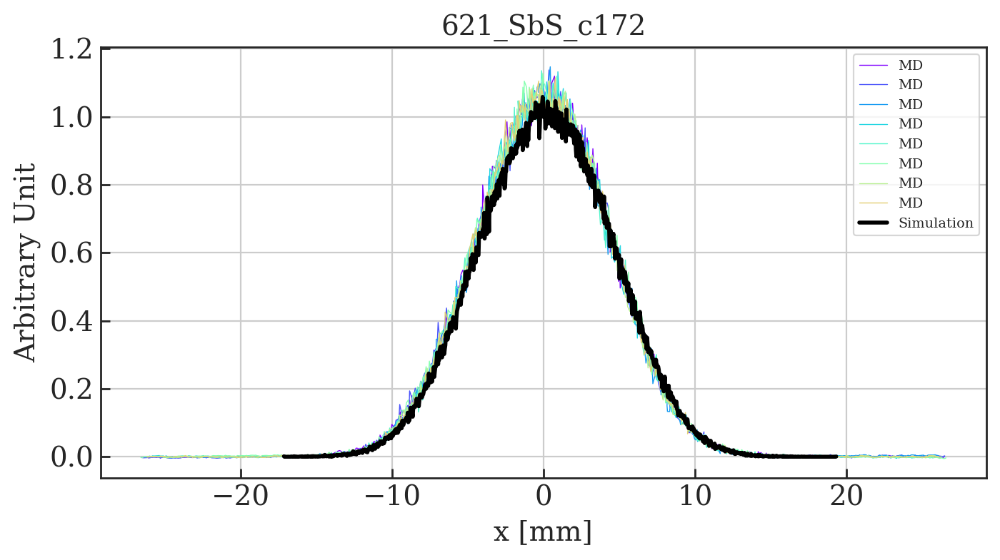

In [107]:
#Main function
verbose = True

for key, value in sorted(sims.iteritems()):
    if verbose: print '\nImporting simulation file:', key
    
    tune_x = float(key.split('_')[0])/100
    ctime = (key.split('_')[2])
    time = float(ctime.split('c')[1])
    if verbose: print 'Qx = ', tune_x, ', ctime =', time, '[ms]'
        
    d = particles_from_matfile(value)
        
    # Find MD data with same tune and ctime
    
    md_points = []
    for i in tune_points[tune_x]:
        if df0['PR.BWS.65.H_ROT:ACQ_DELAY'].iloc()[i] == time:
            md_points.append(i)
            
    if verbose: print md_points
        
    # Plot data
    main_label = key
    Plot_profiles_MD_cf_Sims(d, df0, md_points, 0, main_label, bins=1000)  

# Compare SC Models only


Importing simulation file: 607_SbS_c172
Qx =  6.07 , ctime = 172.0 [ms], label =  SbS
[187, 209]

	MAX(y_dat) =  0.06442944157795462
	MAX(y_dat) index =  508
	abs(x_dat[index]) =  0.2925141206729478

index from y_dat peak not within tolerance of 0.001 mm. 
	try manual search
	index =  514
	index of x_dat =  0.019455058443412554  is  514

Taking the average of centre  61  points
	Mean of peak point +/- 5 points =  0.06031301980530096

Importing simulation file: 608_SbS_c172
Qx =  6.08 , ctime = 172.0 [ms], label =  SbS
[8, 31, 54, 76, 99, 142, 163]

	MAX(y_dat) =  0.06541413715760237
	MAX(y_dat) index =  526
	abs(x_dat[index]) =  0.6638845231837927

index from y_dat peak not within tolerance of 0.001 mm. 
	try manual search
	index =  512
	index of x_dat =  0.024817773754964634  is  512

Taking the average of centre  61  points
	Mean of peak point +/- 5 points =  0.06138469583630856

Importing simulation file: 609_SbS_c172
Qx =  6.09 , ctime = 172.0 [ms], label =  SbS
[186, 208]

	MAX(y

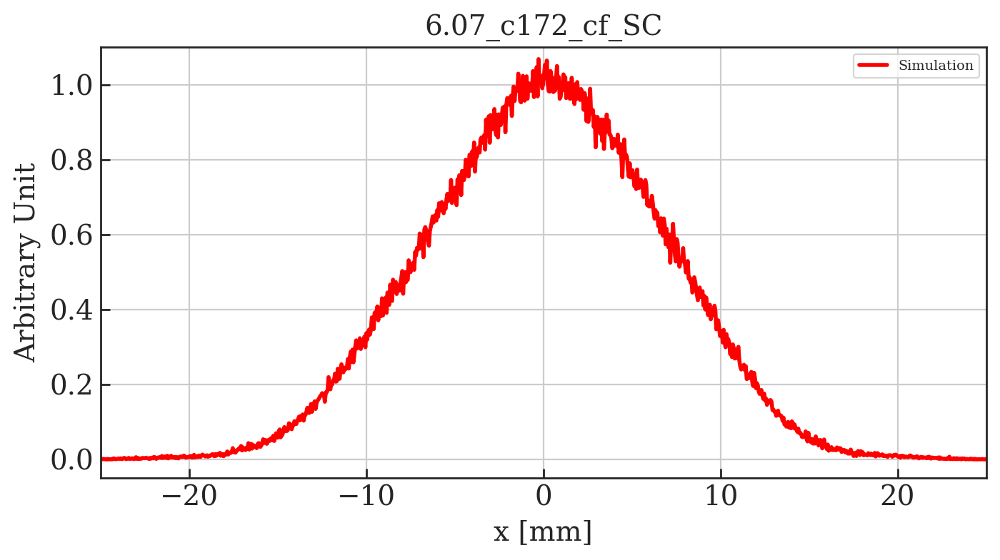

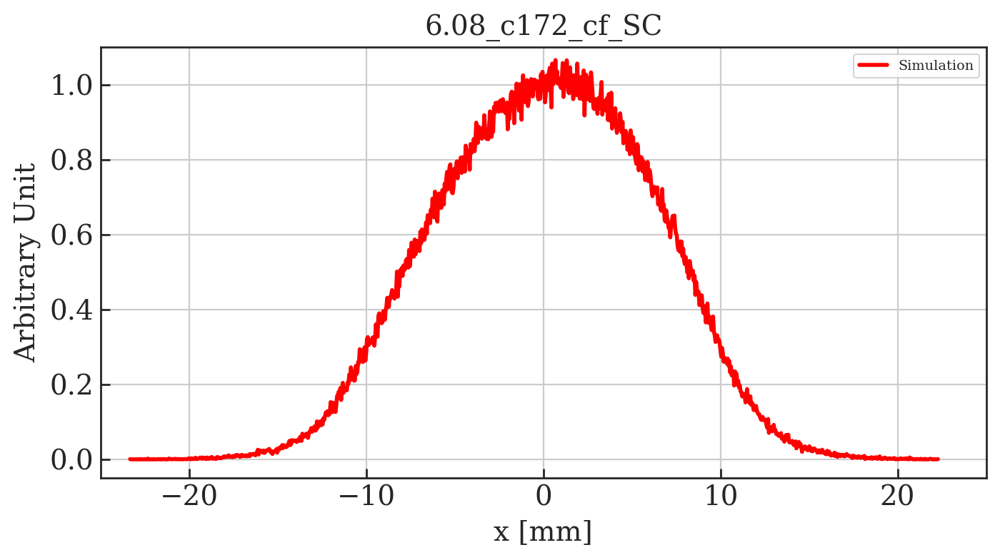

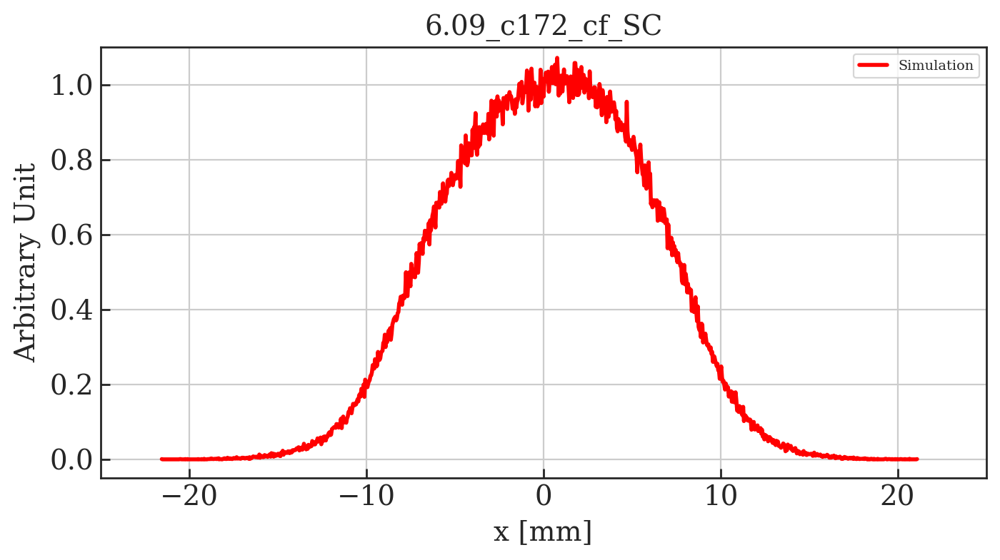

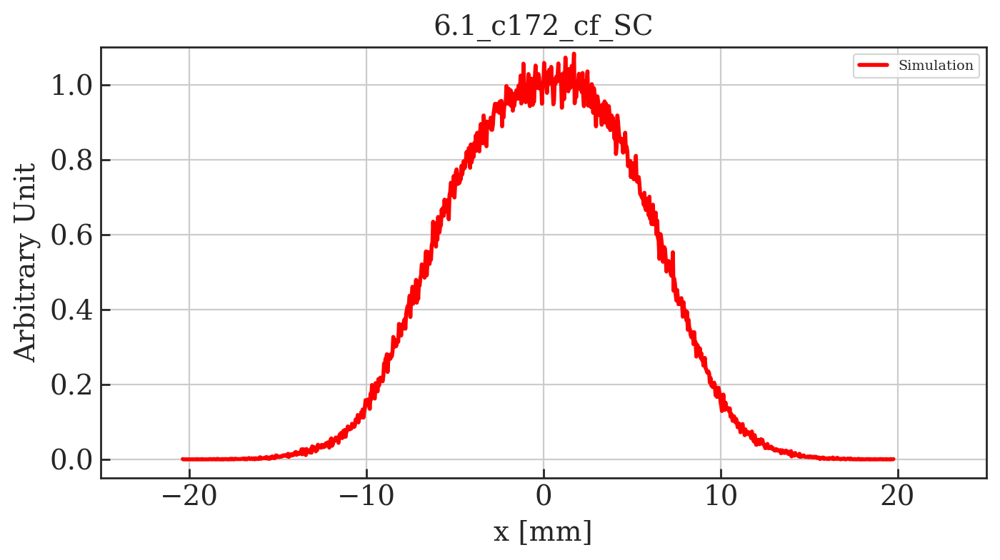

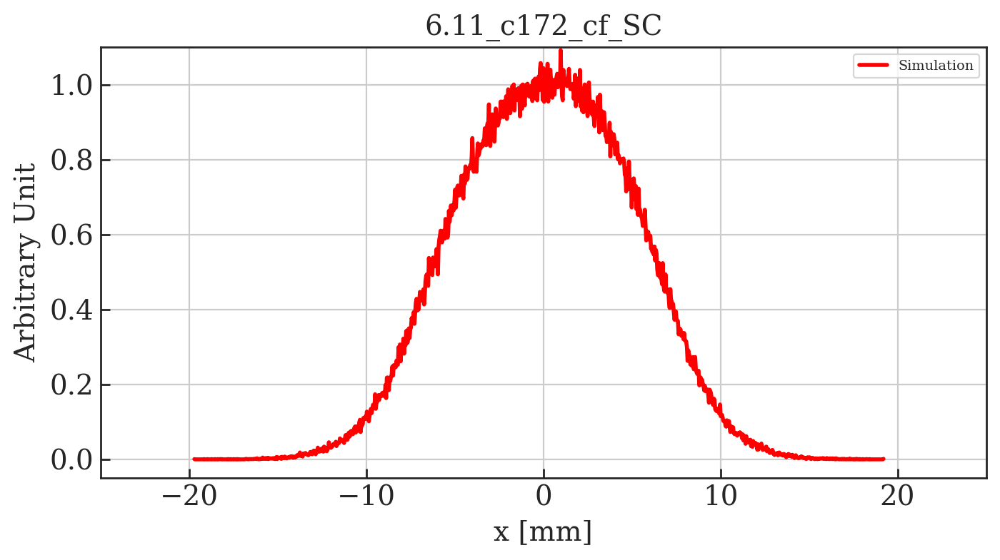

...

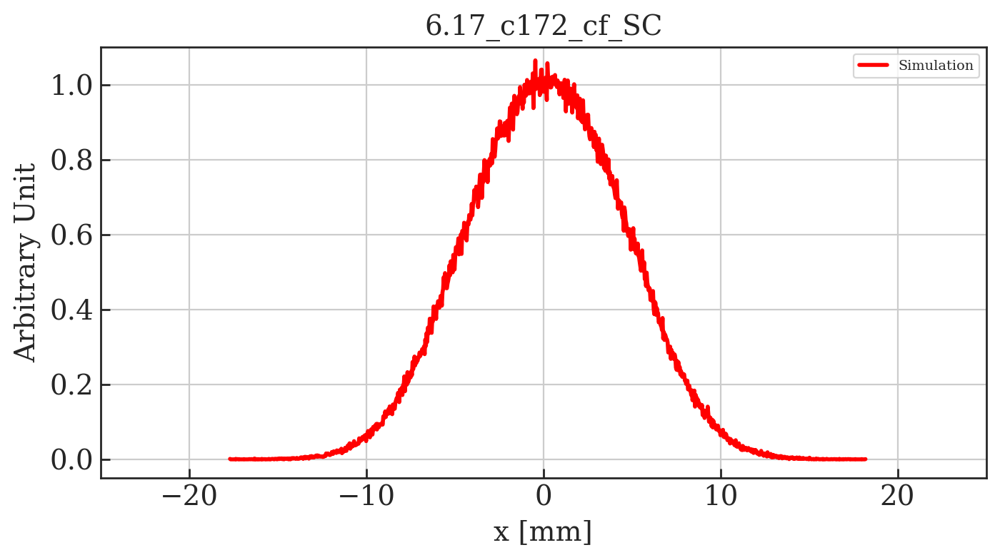

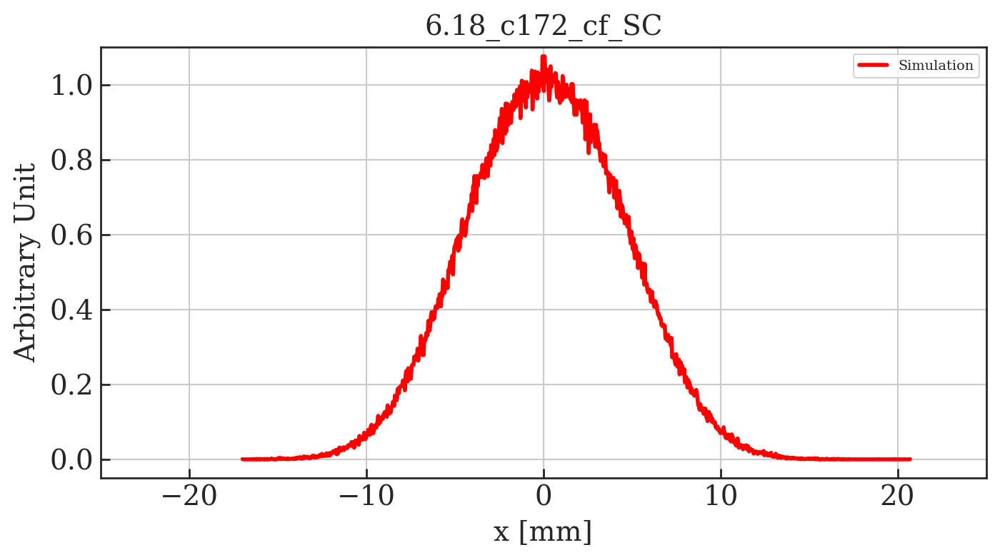

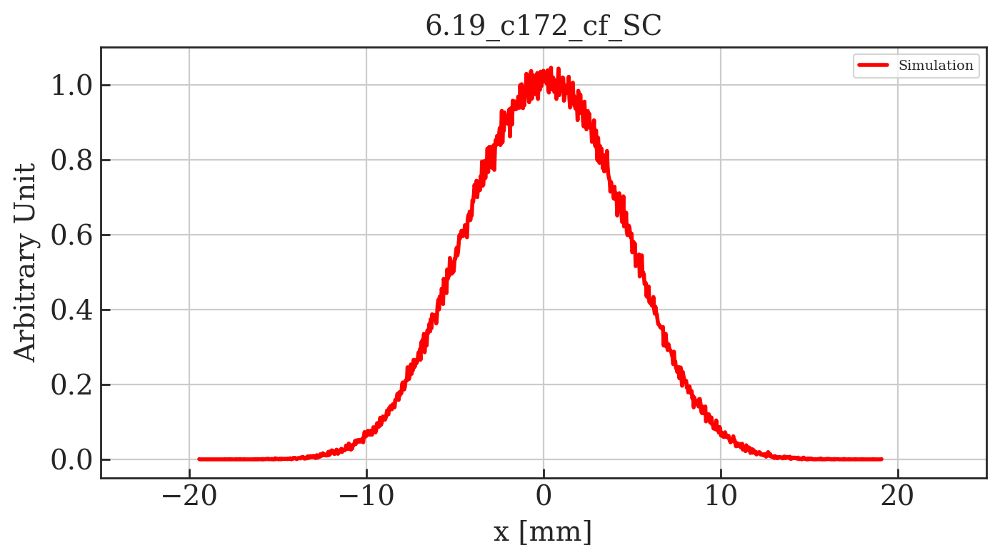

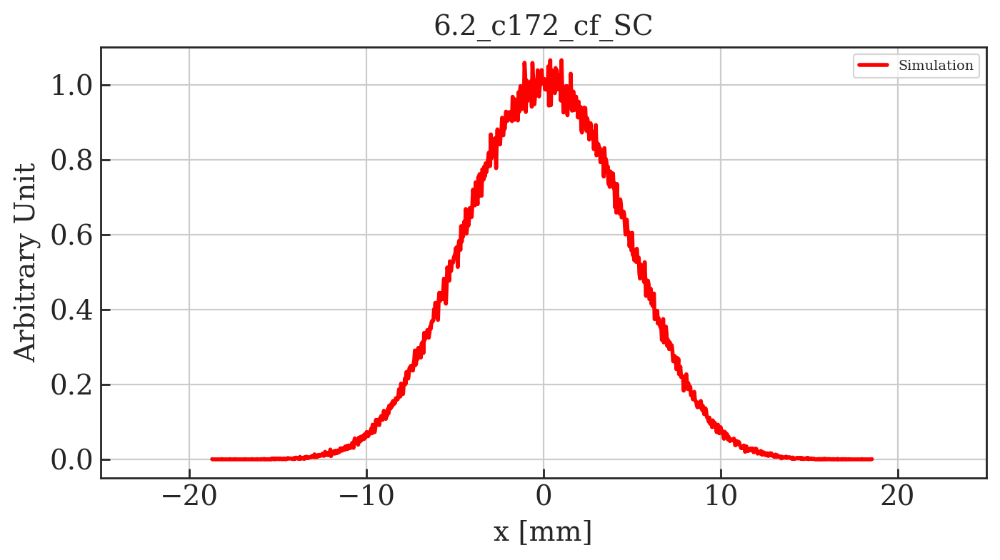

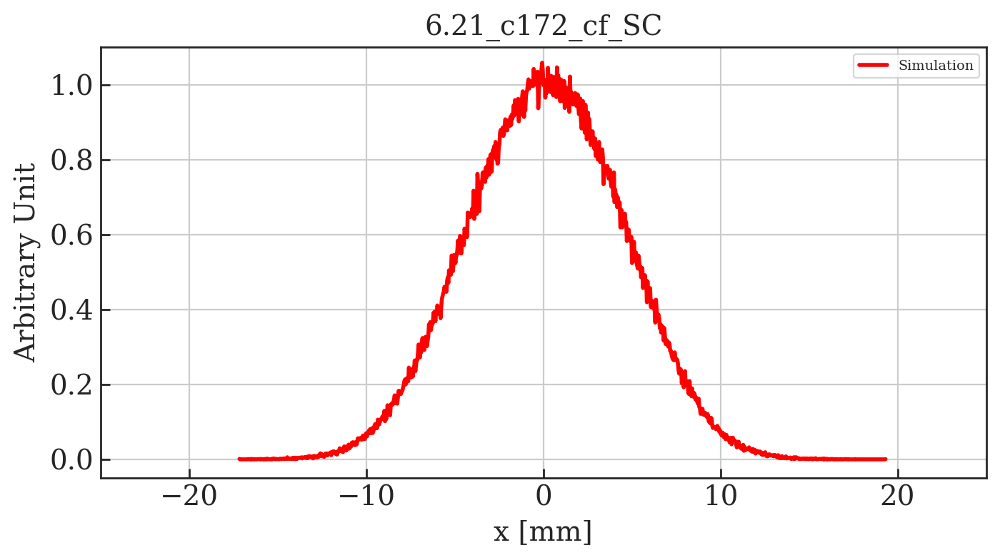

In [108]:
#Main function to plot comparison plots without MD data
verbose = True

plotted_names = []

for key, value in sorted(sims.iteritems()):
    if key not in plotted_names:        
        
        plotted_names.append(key)
        
        this_plot = []
        this_plot.append(value)
        if verbose: print '\nImporting simulation file:', key        

        tune_y = float(key.split('_')[0])/100
        ctime = (key.split('_')[2])
        time = float(ctime.split('c')[1])
        label = (key.split('_')[1])
        if verbose: print 'Qx = ', tune_y, ', ctime =', time, '[ms], label = ', label

        sim_labels=['Simulation']
        
        # Find MD data with same tune and ctime    
        for key1, value1 in sorted(sims.iteritems()):
#             if verbose: print '\tChecking other files:', key1  
            tune_y1 = float(key1.split('_')[0])/100
            ctime1 = (key1.split('_')[2])
            time1 = float(ctime1.split('c')[1])
            label1 = (key1.split('_')[1])
#             if verbose: print '\tQy = ', tune_y1, ', ctime =', time1, '[ms], label = ', label1
            if (tune_y1 == tune_y) and (time1 == time):
                if (label1 != label):
                    print '\tMATCH FOUND' 
                    print '\tQy = ', tune_y1, ', ctime =', time1, '[ms]'
                    print '\tlab = ', label, ', lab1 =', label1

                    this_plot.append(value1)
                    plotted_names.append(key1)
                    sim_labels.append(label1)

        # Find rows in dataframe at correct tune and WS time
        md_points = []
        for i in tune_points[tune_y]:
            if df0['PR.BWS.65.H_ROT:ACQ_DELAY'].iloc()[i] == time:
                md_points.append(i)          

        if verbose: print md_points                 

        # Plot data
        main_label = str(tune_y) + '_' + str(ctime) + '_cf_SC'
        
        if len(this_plot) is 1:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        elif len(this_plot) is 2:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        elif len(this_plot) is 3:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), particles_from_matfile(this_plot[1]), particles_from_matfile(this_plot[2]), main_label=main_label, sim_labels=sim_labels, plot_md=False)  
        else: print 'ERROR: More than 3 space charge methods found'

# Compare Sims and MD data

In [109]:
#Main function to plot comparison plots with MD data
verbose = True

plotted_names = []

for key, value in sorted(sims.iteritems()):
    if key not in plotted_names:        
        
        plotted_names.append(key)
        
        this_plot = []
        this_plot.append(value)
        if verbose: print '\nImporting simulation file:', key        

        tune_y = float(key.split('_')[0])/100
        ctime = (key.split('_')[2])
        time = float(ctime.split('c')[1])
        label = (key.split('_')[1])
        if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms], label = ', label
        
        sim_labels=['Simulation']

        # Find MD data with same tune and ctime    
        for key1, value1 in sorted(sims.iteritems()):
#             if verbose: print '\tChecking other files:', key1  
            tune_y1 = float(key1.split('_')[0])/100
            ctime1 = (key1.split('_')[2])
            time1 = float(ctime1.split('c')[1])
            label1 = (key1.split('_')[1])
#             if verbose: print '\tQy = ', tune_y1, ', ctime =', time1, '[ms], label = ', label1
            if (tune_y1 == tune_y) and (time1 == time):
                if (label1 != label):
                    print '\tMATCH FOUND' 
                    print '\tQy = ', tune_y1, ', ctime =', time1, '[ms]'
                    print '\tlab = ', label, ', lab1 =', label1

                    this_plot.append(value1)
                    plotted_names.append(key1)
                    sim_labels.append(label1)

        # Find rows in dataframe at correct tune and WS time
        md_points = []
        for i in tune_points[tune_y]:
            if df0['PR.BWS.65.H_ROT:ACQ_DELAY'].iloc()[i] == time:
                md_points.append(i)          

        if verbose: print md_points                 

        # Plot data
        main_label = r'$(Q_x, Q_y)$ = (6.21, ' + str(tune_y) + '), t = ' + str(ctime)
        save_name = 'H_Scan_WS_cf_' + str(tune_y)
        if len(this_plot) is 1:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), 0, main_label=main_label, save_name=save_name, bins=1000, sim_labels=sim_labels, plot_md=True)  
        elif len(this_plot) is 2:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), 0, particles_from_matfile(this_plot[1]), main_label=main_label, save_name=save_name, bins=1000, sim_labels=sim_labels, plot_md=True)  
        elif len(this_plot) is 3:
            Plot_profiles_cf_sc_models(df0, md_points, particles_from_matfile(this_plot[0]), 0, particles_from_matfile(this_plot[1]), particles_from_matfile(this_plot[2]), main_label=main_label, save_name=save_name, bins=1000, sim_labels=sim_labels, plot_md=True)  
        else: print 'ERROR: More than 3 space charge methods found'
        


IndentationError: unexpected indent (<ipython-input-109-9da113d8838a>, line 52)

# Wire scanner comparison plots for write-up


Importing simulation file: 607_SbS_c172
Qy =  6.07 , ctime = 172.0 [ms], label =  SbS
[187, 209]

	MAX(y_dat) =  0.06264741938725328
	MAX(y_dat) index =  264
	abs(x_dat[index]) =  0.10394671112075926
	index =  263
	index of x_dat =  0.0023942439604880406  is  263

Taking the average of centre  61  points
	Mean of  61  points about centre =  0.05838958641958686
	abs(x_dat[index]) =  0.047846252612343765

Taking the average of centre  21  points
	abs(x_dat[index]) =  1.275122575218134

Taking the average of centre  21  points

Importing simulation file: 608_SbS_c172
Qy =  6.08 , ctime = 172.0 [ms], label =  SbS
[8, 31, 54, 76, 99, 142, 163]

	MAX(y_dat) =  0.06377619870917652
	MAX(y_dat) index =  261
	abs(x_dat[index]) =  0.0771761382632512
	index =  262
	index of x_dat =  0.011979379235189214  is  262

Taking the average of centre  61  points
	Mean of  61  points about centre =  0.060557288487916874
	abs(x_dat[index]) =  0.8029542374275827

Taking the average of centre  21  points
	abs


Importing simulation file: 618_SbS_c172
Qy =  6.18 , ctime = 172.0 [ms], label =  SbS
[180]

	MAX(y_dat) =  0.09064416968345552
	MAX(y_dat) index =  230
	abs(x_dat[index]) =  0.051820971938219884
	index =  231
	index of x_dat =  0.021851720120416473  is  231

Taking the average of centre  61  points
	Mean of  61  points about centre =  0.08510260083787587
	abs(x_dat[index]) =  0.5178841472514093

Taking the average of centre  21  points

Importing simulation file: 619_SbS_c172
Qy =  6.19 , ctime = 172.0 [ms], label =  SbS
[2, 25, 48, 71, 93, 116, 138, 157]

	MAX(y_dat) =  0.09089286552206069
	MAX(y_dat) index =  260
	abs(x_dat[index]) =  0.13835881863088417
	index =  259
	index of x_dat =  0.06306137959989044  is  259

Taking the average of centre  61  points
	Mean of  61  points about centre =  0.08588148310121108
	abs(x_dat[index]) =  0.8628228411117747

Taking the average of centre  21  points
	abs(x_dat[index]) =  0.3066280085470936

Taking the average of centre  21  points
	abs(x

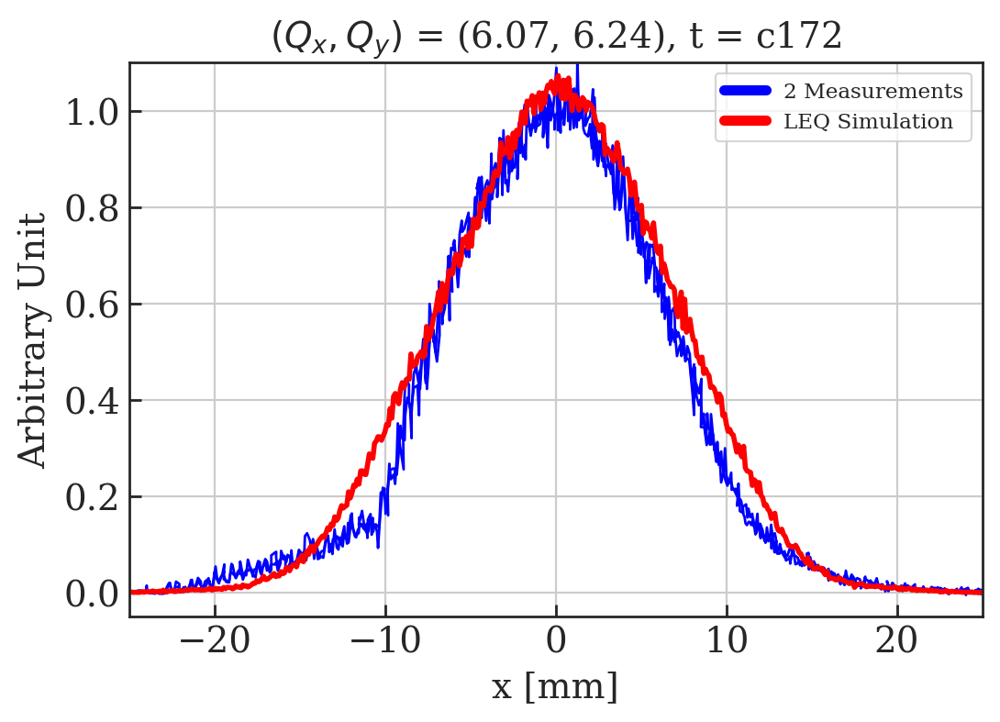

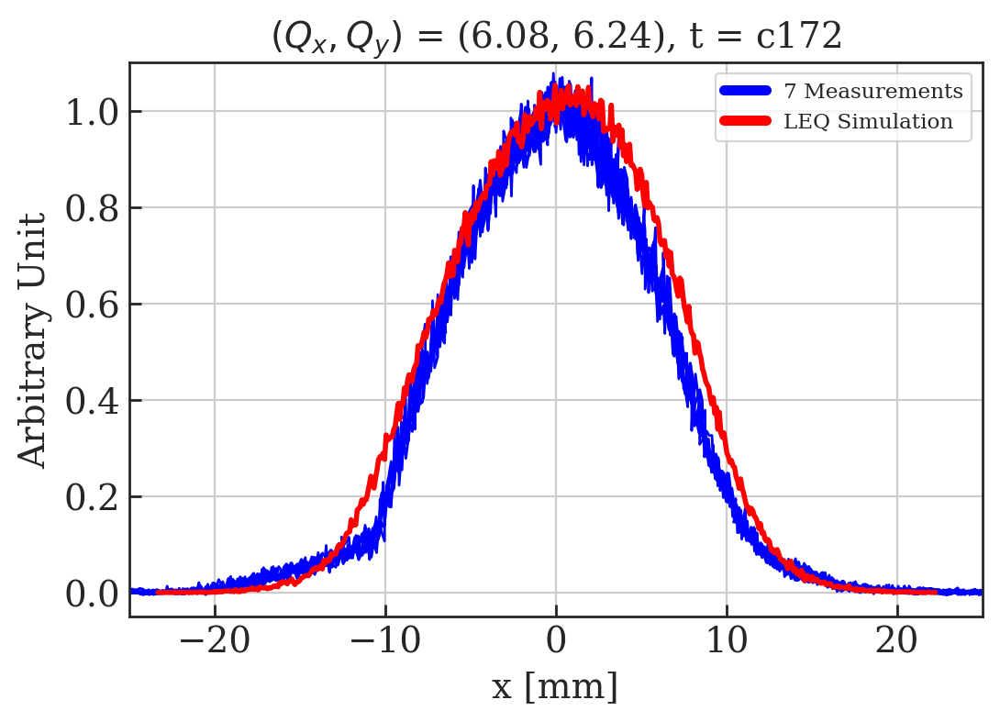

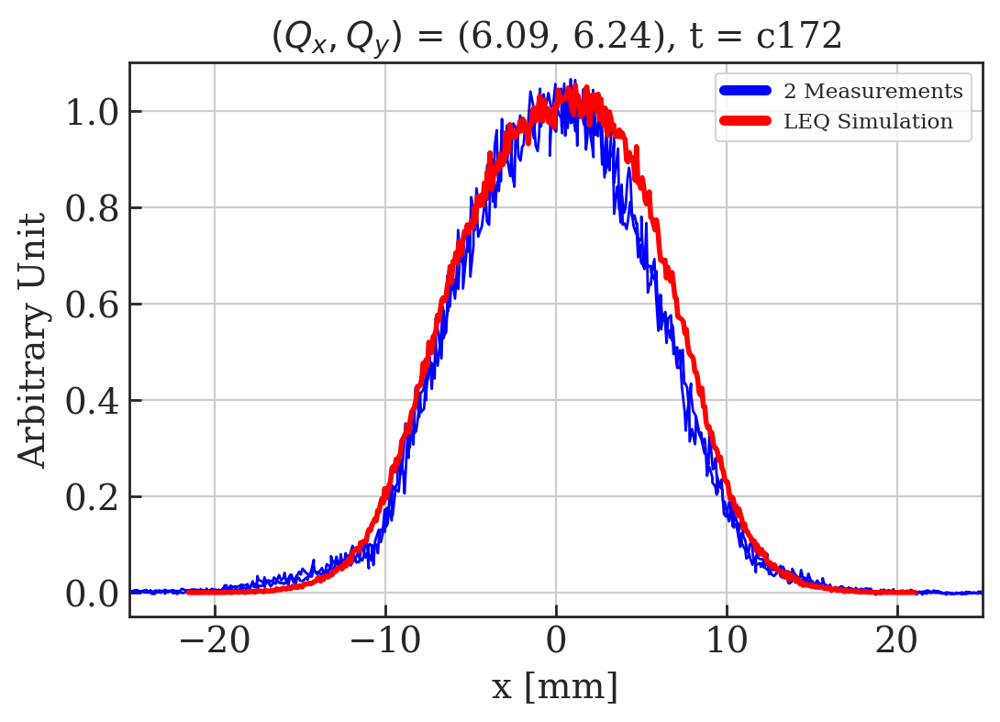

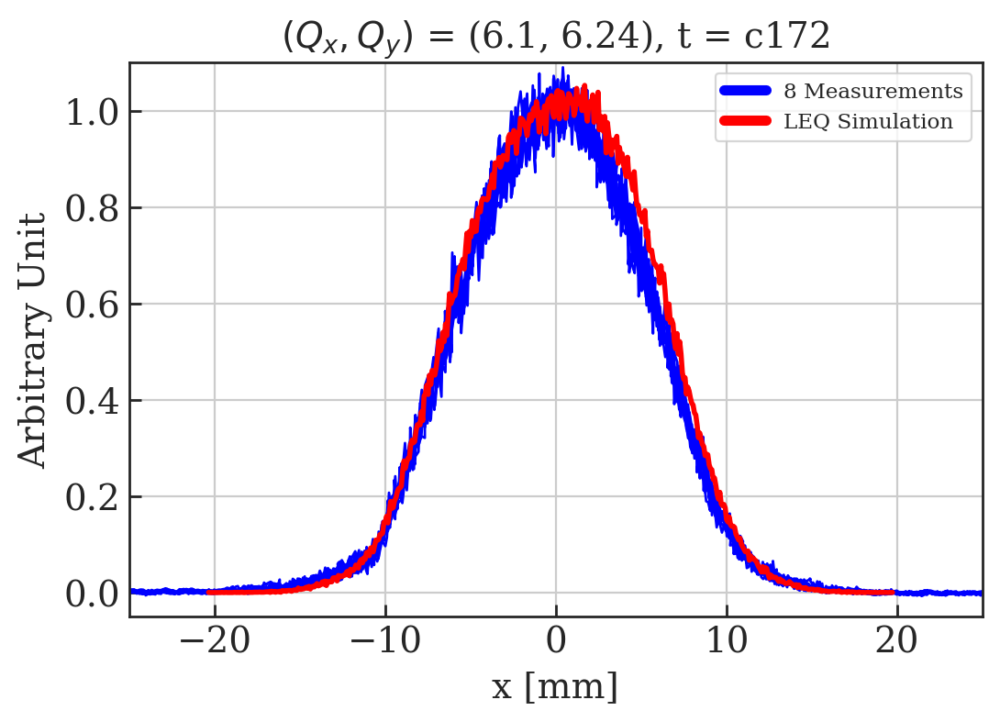

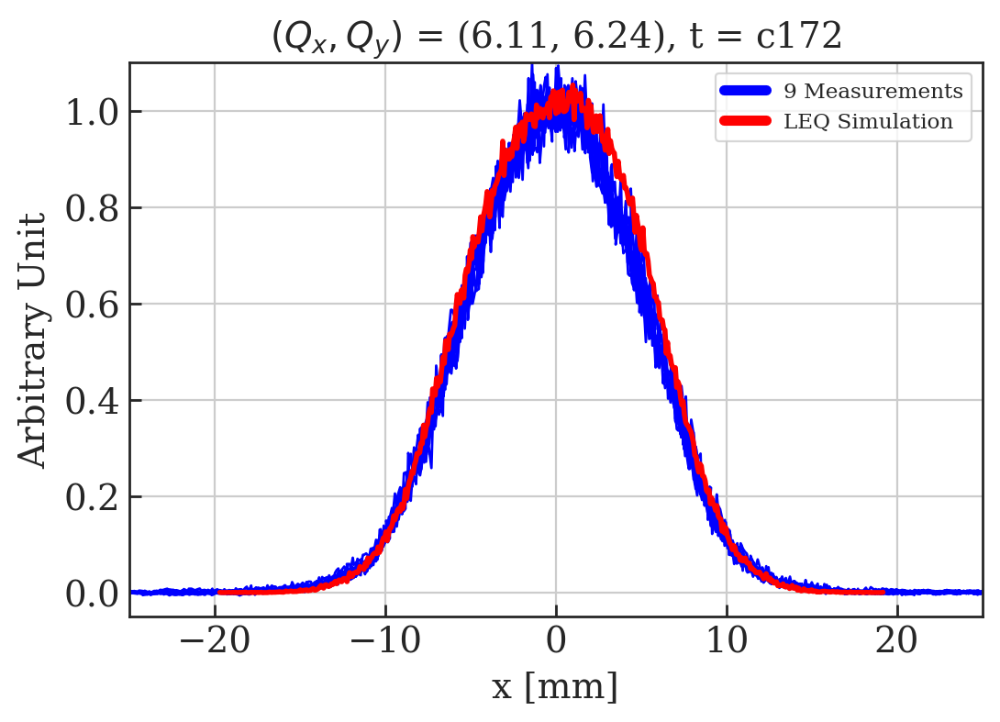

...

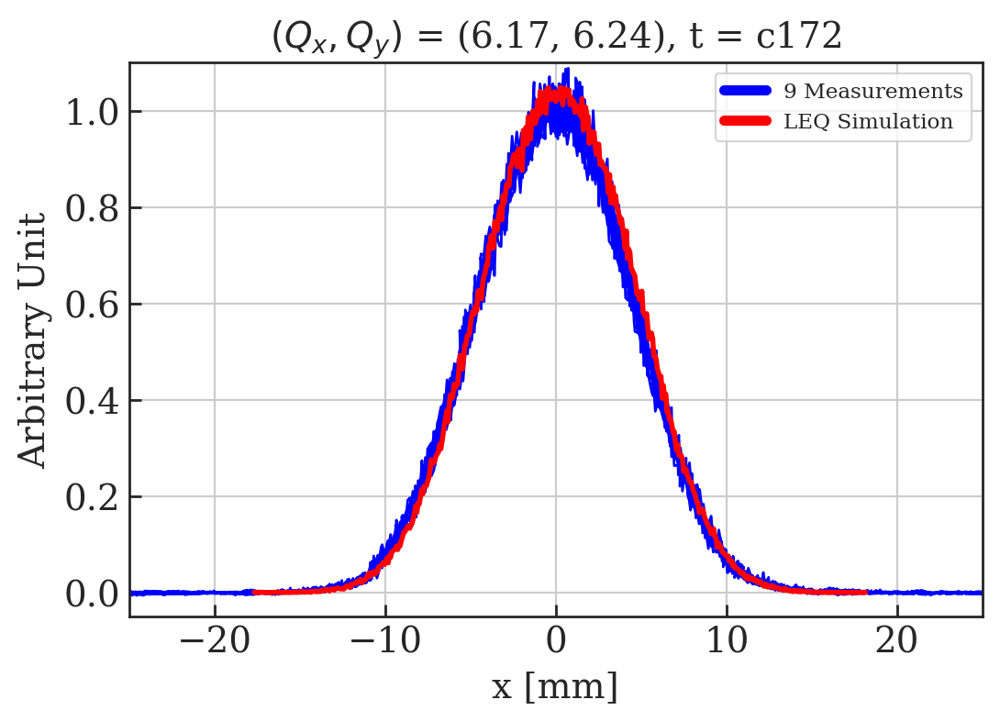

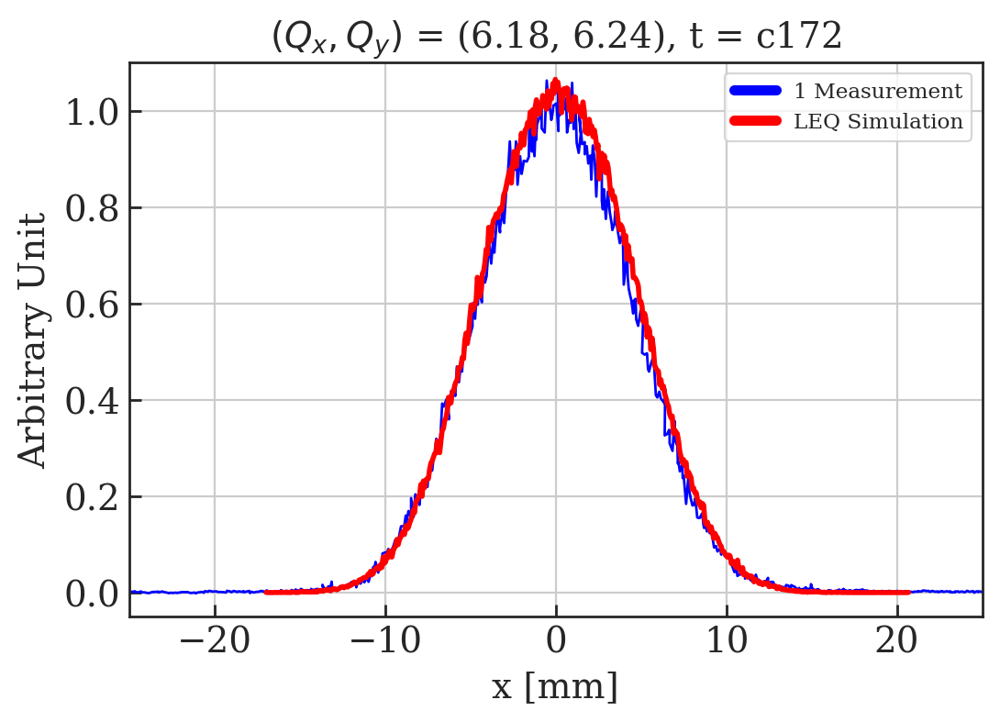

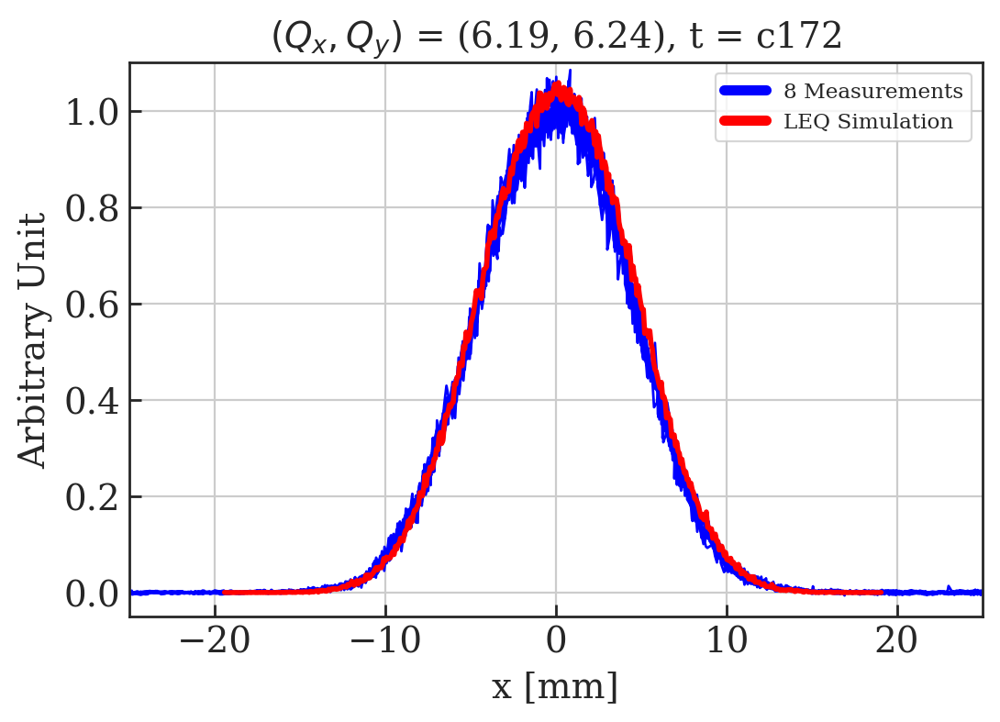

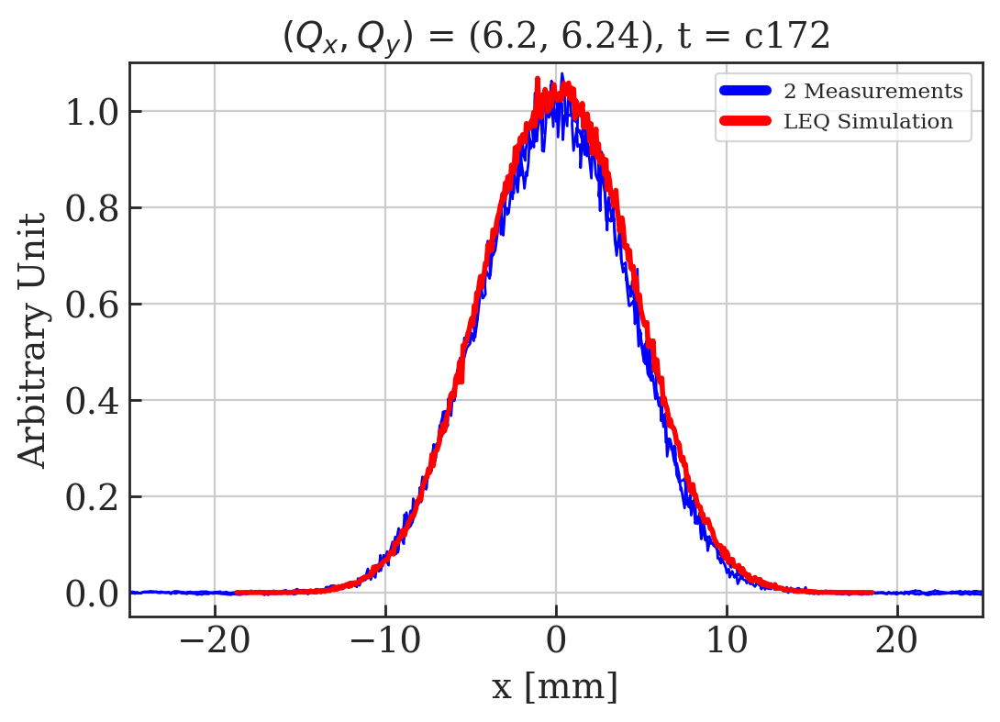

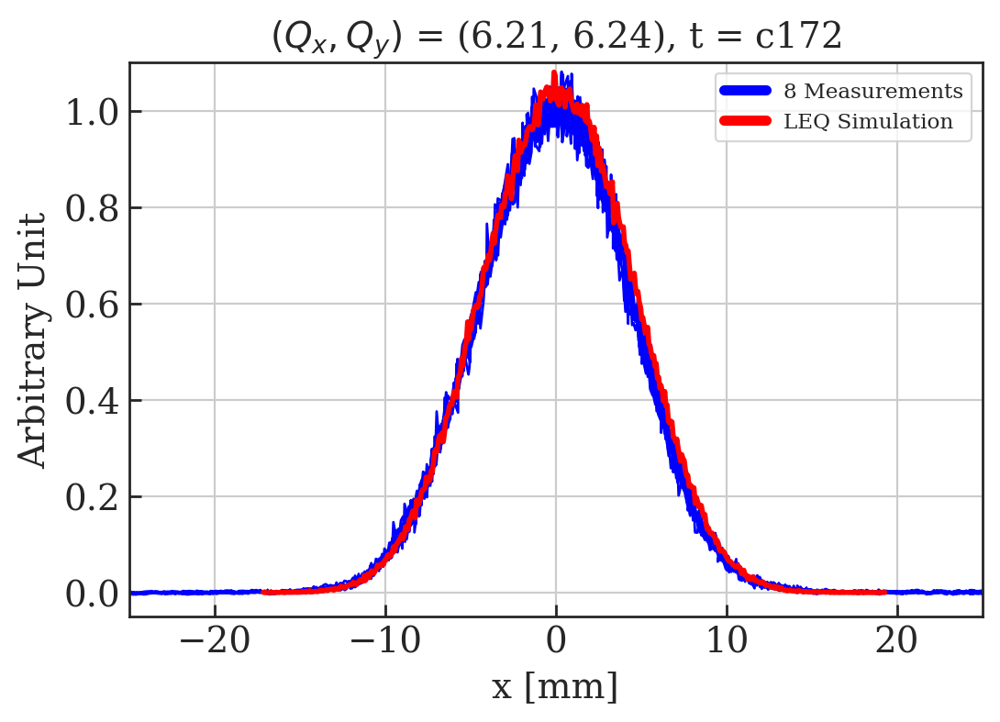

In [27]:
#Main function to plot comparison plots with MD data
verbose = True

plotted_names = []

for key, value in sorted(sims.iteritems()):
    if key not in plotted_names:        
        
        plotted_names.append(key)
        
        this_plot = []
        this_plot.append(value)
        if verbose: print '\nImporting simulation file:', key        

        tune_y = float(key.split('_')[0])/100
        ctime = (key.split('_')[2])
        time = float(ctime.split('c')[1])
        label = (key.split('_')[1])
        if verbose: print 'Qy = ', tune_y, ', ctime =', time, '[ms], label = ', label
        
        sim_labels=['Simulation']

        # Find MD data with same tune and ctime    
        for key1, value1 in sorted(sims.iteritems()):
#             if verbose: print '\tChecking other files:', key1  
            tune_y1 = float(key1.split('_')[0])/100
            ctime1 = (key1.split('_')[2])
            time1 = float(ctime1.split('c')[1])
            label1 = (key1.split('_')[1])
#             if verbose: print '\tQy = ', tune_y1, ', ctime =', time1, '[ms], label = ', label1
            if (tune_y1 == tune_y) and (time1 == time):
                if (label1 != label):
                    print '\tMATCH FOUND' 
                    print '\tQy = ', tune_y1, ', ctime =', time1, '[ms]'
                    print '\tlab = ', label, ', lab1 =', label1

                    this_plot.append(value1)
                    plotted_names.append(key1)
                    sim_labels.append(label1)

        # Find rows in dataframe at correct tune and WS time
        md_points = []
        for i in tune_points[tune_y]:
            if df0['PR.BWS.65.H_ROT:ACQ_DELAY'].iloc()[i] == time:
                md_points.append(i)          

        if verbose: print md_points                 

        # Plot data
        main_label = r'$(Q_x, Q_y)$ = (' + str(tune_y) + ', 6.24), t = ' + str(ctime)
        save_name = 'H_Scan_WS_cf_' + str(tune_y)
        Plot_profiles_cf_sc_models_single(df0, md_points, particles_from_matfile(this_plot[0]), 0, main_label=main_label, save_name=save_name, bins=512, sim_labels=sim_labels, plot_md=True)  


# Calculate emittances for simulated bunches

Qx =  6.07 , ctime = 172.0 [ms]
Qx =  6.08 , ctime = 172.0 [ms]
Qx =  6.09 , ctime = 172.0 [ms]
Qx =  6.1 , ctime = 172.0 [ms]
Qx =  6.11 , ctime = 172.0 [ms]
Qx =  6.12 , ctime = 172.0 [ms]
Qx =  6.13 , ctime = 172.0 [ms]
Qx =  6.14 , ctime = 172.0 [ms]
Qx =  6.15 , ctime = 172.0 [ms]
Qx =  6.16 , ctime = 172.0 [ms]
Qx =  6.17 , ctime = 172.0 [ms]
Qx =  6.18 , ctime = 172.0 [ms]
Qx =  6.19 , ctime = 172.0 [ms]
Qx =  6.2 , ctime = 172.0 [ms]
Qx =  6.21 , ctime = 172.0 [ms]


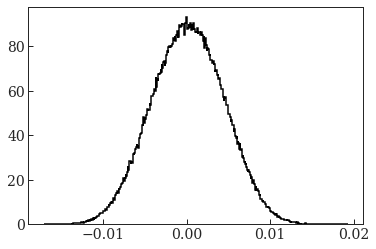

In [68]:
# Make dataframe with name, tunes, position V, profile V 
data = []

# Each row as a list
for key, value in sorted(sims.iteritems()):
    
    tune_y = float(key.split('_')[0])/100
    ctime = (key.split('_')[2])
    time = float(ctime.split('c')[1])
    if verbose: print 'Qx = ', tune_y, ', ctime =', time, '[ms]'

    d = particles_from_matfile(value)
    plt.clf()
    x1, bins_1, p1 = plt.hist(d['particles']['x'][0][0][0], bins = 500, density=True, histtype=u'step', lw=1.5, color='k')
          
    qy = 6.24
    qx = tune_y
    pos = np.array(bins_1[:-1]) + (abs(bins_1[0]-bins_1[1])/2)
    prof = x1
    
    new_data = [qx, qy, pos, prof]
    
    data.append(new_data)    

# Create dataframe
df_sim = pd.DataFrame(data, columns = ['Qx', 'Qy', 'PR.BWS.65.H_ROT:PROF_POSITION_IN', 'PR.BWS.65.H_ROT:PROF_DATA_IN'])

In [69]:
df_sim

,Qx,Qy,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN
0,6.07,6.24,"[-0.026653909756005408, -0.026549920029633287,...","[0.019232669127747494, 0.0, 0.0, 0.0, 0.019232..."
1,6.08,6.24,"[-0.0233011185803972, -0.023209823330478798, -...","[0.021906944794910226, 0.0, 0.0, 0.0, 0.0, 0.0..."
2,6.09,6.24,"[-0.021514216696801078, -0.02142885948335326, ...","[0.023430942965619615, 0.0, 0.0, 0.0, 0.0, 0.0..."
3,6.10,6.24,"[-0.020333350571904156, -0.020253034553185112,...","[0.024901632724056544, 0.0, 0.0, 0.0, 0.0, 0.0..."
4,6.11,6.24,"[-0.019676531069057025, -0.019598650531361287,...","[0.025680356853898058, 0.0, 0.0, 0.0, 0.0, 0.0..."
5,6.12,6.24,"[-0.018694937761849988, -0.018618830394216454,...","[0.026278664762525446, 0.0, 0.0262786647625254..."
6,6.13,6.24,"[-0.01833008332024732, -0.018250587400645814, ...","[0.02515852398494741, 0.0, 0.0, 0.0, 0.0, 0.0,..."
7,6.14,6.24,"[-0.01870034812706582, -0.018625437826539963, ...","[0.026698598002682036, 0.0, 0.0, 0.0, 0.0, 0.0..."
8,6.15,6.24,"[-0.018036929619395112, -0.01796398912822339, ...","[0.027419612452177604, 0.027419612452177604, 0..."
9,6.16,6.24,"[-0.017348195709028357, -0.017277417767339823,...","[0.05651478277797973, 0.0, 0.0, 0.028257391388..."


In [70]:
# Gaussian and 2nd moment fits
df_sim_filtered = Multi_filter_sim(df_sim, with_plot = True, WS = '65.H', smooth=True)


Multi_filter row  0

	initial guess: mu0 0.17543964800159628
	initial guess: offs0 0.0033657170973558147
	initial guess: ampl 60.95547202865115
	initial guess: slope 0
	initial guess: sigma0 37.09187692253967
3 parameter fit sigma =  6.659695388026655  +/-  0.010020560888301838
Removing centre shift of  0.16566370686095513
Second moment =  6.490772835217347

Multi_filter row  1

	initial guess: mu0 0.9834178978982075
	initial guess: offs0 0.005659294072018461
	initial guess: ampl 62.09846890349974
	initial guess: slope 0
	initial guess: sigma0 32.5639107989211
3 parameter fit sigma =  6.331340693944919  +/-  0.023877231628263777
Removing centre shift of  0.26968482202513167
Second moment =  5.894237425712433

Multi_filter row  2

	initial guess: mu0 0.7640160130786382
	initial guess: offs0 0.0029288678707024567
	initial guess: ampl 66.04245584289633
	initial guess: slope 0
	initial guess: sigma0 30.44588505144994
3 parameter fit sigma =  5.8719263775100705  +/-  0.02678173485669041
Re

/usr/local/bin/start_ipykernel.py:81: RuntimeWarning: invalid value encountered in sqrt
/usr/local/bin/start_ipykernel.py:83: RuntimeWarning: invalid value encountered in sqrt



Multi_filter row  6

	initial guess: mu0 0.510449625310527
	initial guess: offs0 0.0
	initial guess: ampl 83.01210732076956
	initial guess: slope 0
	initial guess: sigma0 28.35523246932837
3 parameter fit sigma =  4.731645932299792  +/-  0.01003582920802045
Removing centre shift of  0.21427450510534565
Second moment =  4.522771253547695

Multi_filter row  7

	initial guess: mu0 0.4017785070284177
	initial guess: offs0 0.0017799065335120533
	initial guess: ampl 85.62367515640962
	initial guess: slope 0
	initial guess: sigma0 26.719597639797108
3 parameter fit sigma =  4.600649872045082  +/-  0.0073872793796865175
Removing centre shift of  0.16832226220784482
Second moment =  4.424622966159144

Multi_filter row  8

	initial guess: mu0 0.41701464704974217
	initial guess: offs0 0.00456993540869695
	initial guess: ampl 87.33486046934597
	initial guess: slope 0
	initial guess: sigma0 26.016990481632174
3 parameter fit sigma =  4.53006812367288  +/-  0.006859936226137502
Removing centre shif

In [71]:
df_sim_filtered

,Qx,Qy,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,2ndMoment H,sig H,sig errH,A H,mu H,position H,profile H
0,6.07,6.24,"[-0.026653909756005408, -0.026549920029633287,...","[0.019232669127747494, 0.0, 0.0, 0.0, 0.019232...",6.490773,6.659695388026655,0.010021,1007.0506051217329,0.16566370686095513,"[-26.819573462866362, -26.715583736494242, -26...","[0.0033657170973558147, 0.003983910033604841, ..."
1,6.08,6.24,"[-0.0233011185803972, -0.023209823330478798, -...","[0.021906944794910226, 0.0, 0.0, 0.0, 0.0, 0.0...",5.894237,6.331340693944919,0.023877,1020.4696928093675,0.26968482202513167,"[-23.57080340242233, -23.47950815250393, -23.3...","[0.005659294072018461, 0.006519924046104214, 0..."
2,6.09,6.24,"[-0.021514216696801078, -0.02142885948335326, ...","[0.023430942965619615, 0.0, 0.0, 0.0, 0.0, 0.0...",5.410478,5.8719263775100705,0.026782,1023.7017114392033,0.307959882468726,"[-21.822176579269804, -21.736819365821987, -21...","[0.0029288678707024567, 0.003179913688191238, ..."
3,6.10,6.24,"[-0.020333350571904156, -0.020253034553185112,...","[0.024901632724056544, 0.0, 0.0, 0.0, 0.0, 0.0...",5.039741,5.4484450179835795,0.022652,1022.5154297314497,0.22168051938048164,"[-20.555031091284636, -20.474715072565594, -20...","[0.0037352449086085746, 0.003913113713780384, ..."
4,6.11,6.24,"[-0.019676531069057025, -0.019598650531361287,...","[0.025680356853898058, 0.0, 0.0, 0.0, 0.0, 0.0...",4.782240,5.116877362549326,0.017837,1019.4502062741988,0.15894666066039306,"[-19.835477729717418, -19.75759719202168, -19....","[0.0068480951610394815, 0.006848095161039481, ..."
5,6.12,6.24,"[-0.018694937761849988, -0.018618830394216454,...","[0.026278664762525446, 0.0, 0.0262786647625254...",4.613727,4.877931412669309,0.013009,1015.8548899143666,0.20129122620159728,"[-18.896228988051586, -18.82012162041805, -18....","[0.012263376889178543, 0.01151255789596353, 0...."
6,6.13,6.24,"[-0.01833008332024732, -0.018250587400645814, ...","[0.02515852398494741, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.522771,4.731645932299792,0.010036,1012.8243005930843,0.21427450510534565,"[-18.544357825352666, -18.46486190575116, -18....","[0.0008386174661649363, 0.0019168399226626583,..."
7,6.14,6.24,"[-0.01870034812706582, -0.018625437826539963, ...","[0.026698598002682036, 0.0, 0.0, 0.0, 0.0, 0.0...",4.424623,4.600649872045082,0.007387,1010.8141992894241,0.16832226220784482,"[-18.868670389273667, -18.793760088747806, -18...","[0.006229672867292486, 0.005848264324397015, 0..."
8,6.15,6.24,"[-0.018036929619395112, -0.01796398912822339, ...","[0.027419612452177604, 0.027419612452177604, 0...",4.362476,4.53006812367288,0.006860,1010.4147713981889,0.14089399237580863,"[-18.17782361177092, -18.104883120599197, -18....","[0.009596864358262163, 0.009792718732920574, 0..."
9,6.16,6.24,"[-0.017348195709028357, -0.017277417767339823,...","[0.05651478277797973, 0.0, 0.0, 0.028257391388...",4.350332,4.508393433695502,0.006204,1009.7751147685748,0.1629430192052364,"[-17.511138728233593, -17.44036078654506, -17....","[0.028257391388990045, 0.02745003734930462, 0...."


# Calculate Emittance for simulated bunches

In [72]:
# Calculate emittances in Horizontal
df_sim_emittance = emittance_df(df_sim_filtered, WS='65.H', verbose=True)

Emittance  0  =  3.681518723526639
Emittance  1  =  3.1690060964555564
Emittance  2  =  2.5419045858000855
Emittance  3  =  2.0262656649045585
Emittance  4  =  1.6617484574970414
Emittance  5  =  1.4216034515168081
Emittance  6  =  1.2871188777242233
Emittance  7  =  1.1727866530297664
Emittance  8  =  1.1184433510936367
Emittance  9  =  1.1098246140308639
Emittance  10  =  1.0870219957117184
Emittance  11  =  1.1304880337566245
Emittance  12  =  1.0907636290639344
Emittance  13  =  1.1230447704050048
Emittance  14  =  1.1109721507143056


In [73]:
df_sim_emittance

,Qx,Qy,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,2ndMoment H,sig H,sig errH,A H,mu H,position H,profile H,emittance H,betx,bety,dx,emittance H noDisp
0,6.07,6.24,"[-0.026653909756005408, -0.026549920029633287,...","[0.019232669127747494, 0.0, 0.0, 0.0, 0.019232...",6.490773,6.659695388026655,0.010021,1007.0506051217329,0.16566370686095513,"[-26.819573462866362, -26.715583736494242, -26...","[0.0033657170973558147, 0.003983910033604841, ...",3.681519,19.912049,11.797357,3.966339,5.032687
1,6.08,6.24,"[-0.0233011185803972, -0.023209823330478798, -...","[0.021906944794910226, 0.0, 0.0, 0.0, 0.0, 0.0...",5.894237,6.331340693944919,0.023877,1020.4696928093675,0.26968482202513167,"[-23.57080340242233, -23.47950815250393, -23.3...","[0.005659294072018461, 0.006519924046104214, 0...",3.169006,20.413116,11.791224,3.890362,4.436997
2,6.09,6.24,"[-0.021514216696801078, -0.02142885948335326, ...","[0.023430942965619615, 0.0, 0.0, 0.0, 0.0, 0.0...",5.410478,5.8719263775100705,0.026782,1023.7017114392033,0.307959882468726,"[-21.822176579269804, -21.736819365821987, -21...","[0.0029288678707024567, 0.003179913688191238, ...",2.541905,20.804788,11.785121,3.825040,3.744596
3,6.10,6.24,"[-0.020333350571904156, -0.020253034553185112,...","[0.024901632724056544, 0.0, 0.0, 0.0, 0.0, 0.0...",5.039741,5.4484450179835795,0.022652,1022.5154297314497,0.22168051938048164,"[-20.555031091284636, -20.474715072565594, -20...","[0.0037352449086085746, 0.003913113713780384, ...",2.026266,21.116999,11.779054,3.768311,3.176289
4,6.11,6.24,"[-0.019676531069057025, -0.019598650531361287,...","[0.025680356853898058, 0.0, 0.0, 0.0, 0.0, 0.0...",4.782240,5.116877362549326,0.017837,1019.4502062741988,0.15894666066039306,"[-19.835477729717418, -19.75759719202168, -19....","[0.0068480951610394815, 0.006848095161039481, ...",1.661748,21.369811,11.773030,3.718497,2.768321
5,6.12,6.24,"[-0.018694937761849988, -0.018618830394216454,...","[0.026278664762525446, 0.0, 0.0262786647625254...",4.613727,4.877931412669309,0.013009,1015.8548899143666,0.20129122620159728,"[-18.896228988051586, -18.82012162041805, -18....","[0.012263376889178543, 0.01151255789596353, 0....",1.421603,21.577147,11.767050,3.674283,2.491635
6,6.13,6.24,"[-0.01833008332024732, -0.018250587400645814, ...","[0.02515852398494741, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.522771,4.731645932299792,0.010036,1012.8243005930843,0.21427450510534565,"[-18.544357825352666, -18.46486190575116, -18....","[0.0008386174661649363, 0.0019168399226626583,...",1.287119,21.748954,11.761117,3.634635,2.325912
7,6.14,6.24,"[-0.01870034812706582, -0.018625437826539963, ...","[0.026698598002682036, 0.0, 0.0, 0.0, 0.0, 0.0...",4.424623,4.600649872045082,0.007387,1010.8141992894241,0.16832226220784482,"[-18.868670389273667, -18.793760088747806, -18...","[0.006229672867292486, 0.005848264324397015, 0...",1.172787,21.892518,11.755232,3.598747,2.184488
8,6.15,6.24,"[-0.018036929619395112, -0.01796398912822339, ...","[0.027419612452177604, 0.027419612452177604, 0...",4.362476,4.53006812367288,0.006860,1010.4147713981889,0.14089399237580863,"[-18.17782361177092, -18.104883120599197, -18....","[0.009596864358262163, 0.009792718732920574, 0...",1.118443,22.013293,11.749394,3.565979,2.106355
9,6.16,6.24,"[-0.017348195709028357, -0.017277417767339823,...","[0.05651478277797973, 0.0, 0.0, 0.028257391388...",4.350332,4.508393433695502,0.006204,1009.7751147685748,0.1629430192052364,"[-17.511138728233593, -17.44036078654506, -17....","[0.028257391388990045, 0.02745003734930462, 0....",1.109825,22.115436,11.743606,3.535821,2.076611


In [74]:
df_sim_emittance_2 = emittance_df_2(df_sim_emittance, WS='65.H', verbose=True)

Emittance from 2nd moment 0  =  3.4294493931182792
Emittance from 2nd moment 1  =  2.5775108306084715
Emittance from 2nd moment 2  =  1.976487905801311
Emittance from 2nd moment 3  =  1.5676130381088211
Emittance from 2nd moment 4  =  1.3114989495413683
Emittance from 2nd moment 5  =  1.159003297842335
Emittance from 2nd moment 6  =  1.0863004266095162
Emittance from 2nd moment 7  =  1.008821792275829
Emittance from 2nd moment 8  =  0.9654752052300075
Emittance from 2nd moment 9  =  0.9667679386436004
Emittance from 2nd moment 10  =  0.9503425606622953
Emittance from 2nd moment 11  =  0.9916730600864349
Emittance from 2nd moment 12  =  0.9690990444401051
Emittance from 2nd moment 13  =  1.002714246864349
Emittance from 2nd moment 14  =  1.0007183414018852


# Calculate Emittance using 2nd moment for simulated bunches

In [75]:
df_sim_emittance_2

,Qx,Qy,PR.BWS.65.H_ROT:PROF_POSITION_IN,PR.BWS.65.H_ROT:PROF_DATA_IN,2ndMoment H,sig H,sig errH,A H,mu H,position H,profile H,emittance H,betx,bety,dx,emittance H noDisp,emittance H 2ndMoment noDisp,emittance H 2ndMoment
0,6.07,6.24,"[-0.026653909756005408, -0.026549920029633287,...","[0.019232669127747494, 0.0, 0.0, 0.0, 0.019232...",6.490773,6.659695388026655,0.010021,1007.0506051217329,0.16566370686095513,"[-26.819573462866362, -26.715583736494242, -26...","[0.0033657170973558147, 0.003983910033604841, ...",3.681519,19.912049,11.797357,3.966339,5.032687,4.780617,3.429449
1,6.08,6.24,"[-0.0233011185803972, -0.023209823330478798, -...","[0.021906944794910226, 0.0, 0.0, 0.0, 0.0, 0.0...",5.894237,6.331340693944919,0.023877,1020.4696928093675,0.26968482202513167,"[-23.57080340242233, -23.47950815250393, -23.3...","[0.005659294072018461, 0.006519924046104214, 0...",3.169006,20.413116,11.791224,3.890362,4.436997,3.845502,2.577511
2,6.09,6.24,"[-0.021514216696801078, -0.02142885948335326, ...","[0.023430942965619615, 0.0, 0.0, 0.0, 0.0, 0.0...",5.410478,5.8719263775100705,0.026782,1023.7017114392033,0.307959882468726,"[-21.822176579269804, -21.736819365821987, -21...","[0.0029288678707024567, 0.003179913688191238, ...",2.541905,20.804788,11.785121,3.825040,3.744596,3.179180,1.976488
3,6.10,6.24,"[-0.020333350571904156, -0.020253034553185112,...","[0.024901632724056544, 0.0, 0.0, 0.0, 0.0, 0.0...",5.039741,5.4484450179835795,0.022652,1022.5154297314497,0.22168051938048164,"[-20.555031091284636, -20.474715072565594, -20...","[0.0037352449086085746, 0.003913113713780384, ...",2.026266,21.116999,11.779054,3.768311,3.176289,2.717637,1.567613
4,6.11,6.24,"[-0.019676531069057025, -0.019598650531361287,...","[0.025680356853898058, 0.0, 0.0, 0.0, 0.0, 0.0...",4.782240,5.116877362549326,0.017837,1019.4502062741988,0.15894666066039306,"[-19.835477729717418, -19.75759719202168, -19....","[0.0068480951610394815, 0.006848095161039481, ...",1.661748,21.369811,11.773030,3.718497,2.768321,2.418071,1.311499
5,6.12,6.24,"[-0.018694937761849988, -0.018618830394216454,...","[0.026278664762525446, 0.0, 0.0262786647625254...",4.613727,4.877931412669309,0.013009,1015.8548899143666,0.20129122620159728,"[-18.896228988051586, -18.82012162041805, -18....","[0.012263376889178543, 0.01151255789596353, 0....",1.421603,21.577147,11.767050,3.674283,2.491635,2.229035,1.159003
6,6.13,6.24,"[-0.01833008332024732, -0.018250587400645814, ...","[0.02515852398494741, 0.0, 0.0, 0.0, 0.0, 0.0,...",4.522771,4.731645932299792,0.010036,1012.8243005930843,0.21427450510534565,"[-18.544357825352666, -18.46486190575116, -18....","[0.0008386174661649363, 0.0019168399226626583,...",1.287119,21.748954,11.761117,3.634635,2.325912,2.125093,1.086300
7,6.14,6.24,"[-0.01870034812706582, -0.018625437826539963, ...","[0.026698598002682036, 0.0, 0.0, 0.0, 0.0, 0.0...",4.424623,4.600649872045082,0.007387,1010.8141992894241,0.16832226220784482,"[-18.868670389273667, -18.793760088747806, -18...","[0.006229672867292486, 0.005848264324397015, 0...",1.172787,21.892518,11.755232,3.598747,2.184488,2.020524,1.008822
8,6.15,6.24,"[-0.018036929619395112, -0.01796398912822339, ...","[0.027419612452177604, 0.027419612452177604, 0...",4.362476,4.53006812367288,0.006860,1010.4147713981889,0.14089399237580863,"[-18.17782361177092, -18.104883120599197, -18....","[0.009596864358262163, 0.009792718732920574, 0...",1.118443,22.013293,11.749394,3.565979,2.106355,1.953387,0.965475
9,6.16,6.24,"[-0.017348195709028357, -0.017277417767339823,...","[0.05651478277797973, 0.0, 0.0, 0.028257391388...",4.350332,4.508393433695502,0.006204,1009.7751147685748,0.1629430192052364,"[-17.511138728233593, -17.44036078654506, -17....","[0.028257391388990045, 0.02745003734930462, 0....",1.109825,22.115436,11.743606,3.535821,2.076611,1.933555,0.966768


# Save simulation dataframe to pickle file

In [76]:
df_sim_emittance_2.to_pickle('MD4224_HighBrightness_Horizontal_Using_Sim_Optics_Complete_simulation_data')

In [77]:
df0_sim = pnd.read_pickle('MD4224_HighBrightness_Horizontal_Using_Sim_Optics_Complete_simulation_data')

# Plots

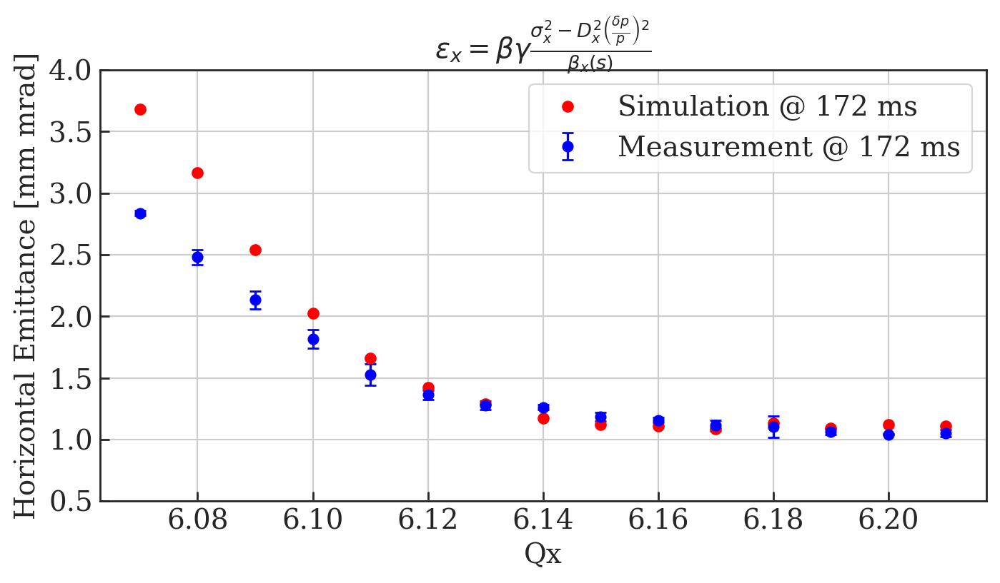

In [78]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_172.append( np.std( df0['emittance H'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
y_error_172[11] = max(y_error_172)
    
    
plt.errorbar(x_data, y_data_172, y_error_172, label='Measurement @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qx'], df0_sim['emittance H'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qx');
plt.ylabel('Horizontal Emittance [mm mrad]');

plt.title(r'$\epsilon_{x} = \beta\gamma \frac{\sigma_x^2 - D_x^2 \left(\frac{\delta p}{p}\right)^2}{\beta_{x}(s)}$')
#plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\sigma^2}{\beta_{x,y}(s)}$')

# plt.ylim(0.5, 3.5)
plt.ylim(0.5, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_Emittance_Errors_Using_Sim_Optics_Sim_172.png');

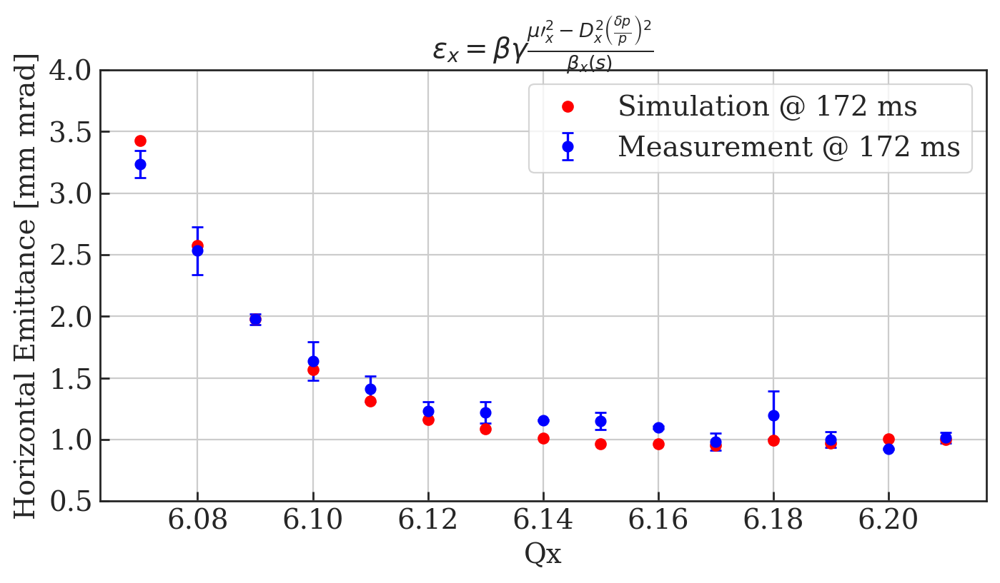

In [79]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_172.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
y_error_172[11] = max(y_error_172)
    
plt.errorbar(x_data, y_data_172, y_error_172, label='Measurement @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qx'], df0_sim['emittance H 2ndMoment'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qx');
plt.ylabel('Horizontal Emittance [mm mrad]');

plt.title(r'$\epsilon_{x} = \beta\gamma \frac{\mu\prime_x^2 - D_x^2 \left(\frac{\delta p}{p} \right)^2}{\beta_{x}(s)}$')
#plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2}{\beta_{x,y}(s)}$')

# plt.ylim(0.5, 3.5)
plt.ylim(0.5, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Horizontal_Manual_Fit_WS_Delay_Emittance_2nd_Errors_Using_Sim_Optics_Sim_172.png');

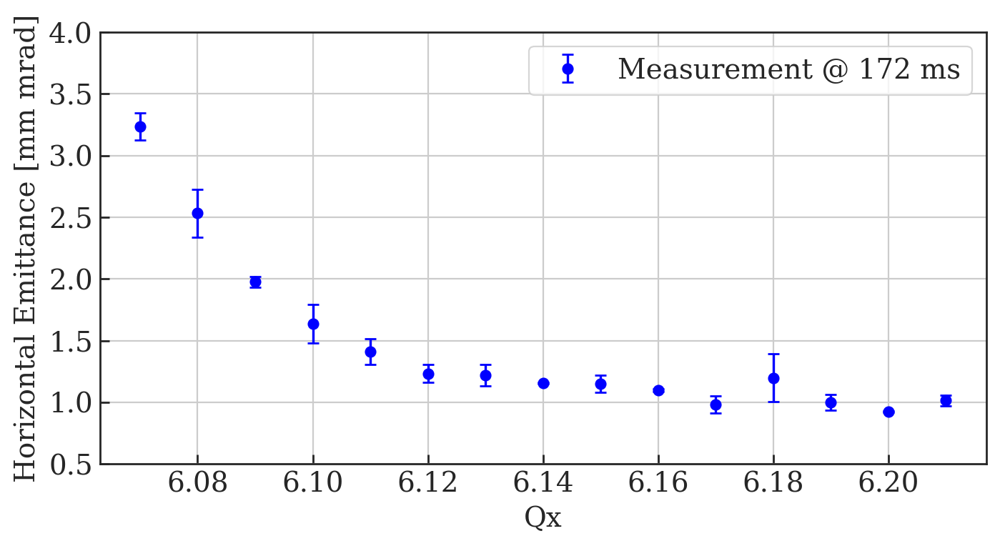

In [83]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_172.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
y_error_172[11] = max(y_error_172)
    
plt.errorbar(x_data, y_data_172, y_error_172, label='Measurement @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

#plt.plot(df0_sim['Qx'], df0_sim['emittance H 2ndMoment'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qx');
plt.ylabel('Horizontal Emittance [mm mrad]');

#plt.title(r'$\epsilon_{x} = \beta\gamma \frac{\mu\prime_x^2 - D_x^2 \left(\frac{\delta p}{p} \right)^2}{\beta_{x}(s)}$')
#plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2}{\beta_{x,y}(s)}$')

# plt.ylim(0.5, 3.5)
plt.ylim(0.5, 4)

plt.legend();
plt.grid();
fig.savefig('Write_Up/Measured_172_H.png');

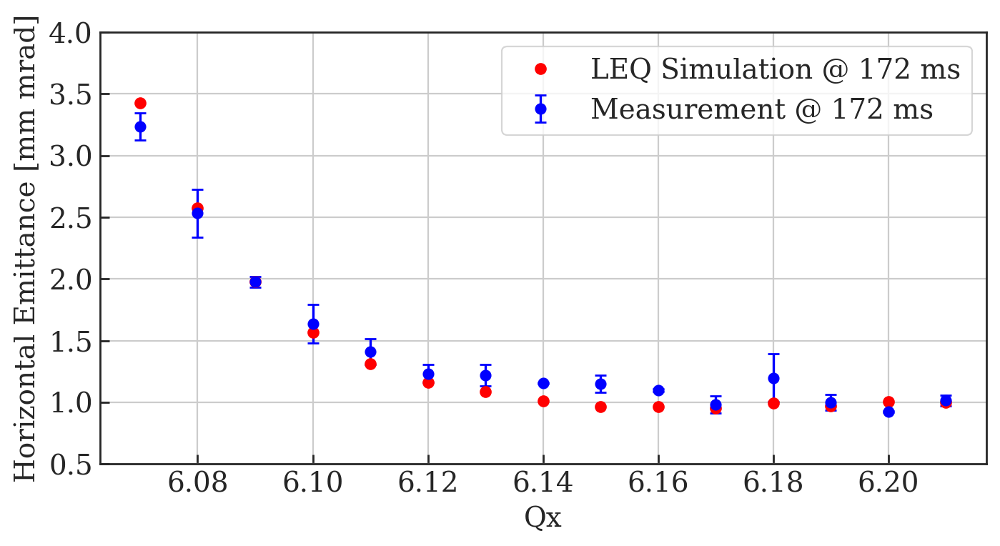

In [84]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(607, 621, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    y_error_172.append( np.std( df0['emittance H 2ndMoment'][(df0['PR.BWS.65.H_ROT:ACQ_DELAY']==172)][(df0['Qx']>lower_lim)][(df0['Qx']<upper_lim)] ) )
    
y_error_172[11] = max(y_error_172)
    
plt.errorbar(x_data, y_data_172, y_error_172, label='Measurement @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qx'], df0_sim['emittance H 2ndMoment'], label='LEQ Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qx');
plt.ylabel('Horizontal Emittance [mm mrad]');

#plt.title(r'$\epsilon_{x} = \beta\gamma \frac{\mu\prime_x^2 - D_x^2 \left(\frac{\delta p}{p} \right)^2}{\beta_{x}(s)}$')
#plt.title(r'$\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2}{\beta_{x,y}(s)}$')

# plt.ylim(0.5, 3.5)
plt.ylim(0.5, 4)

plt.legend();
plt.grid();
fig.savefig('Write_Up/Measured_LEQ_172_H.png');

In [82]:
break

SyntaxError: 'break' outside loop (<ipython-input-82-6aaf1f276005>, line 1)

# Core Fit

In [ ]:
df0

In [ ]:
df0_sim

# Test some stuff

In [ ]:
# Check cutting of data
x_data = df0['position H'].iloc()[0]
y_data = df0['profile H'].iloc()[0]

In [ ]:
len(x_data)

In [ ]:
len(y_data)

In [ ]:
plt.plot(x_data, y_data)

In [ ]:
indx_max = np.argmax(y_data)
indx_max

In [ ]:
quart_len_x_dat = int(len(x_data)/4)
quart_len_x_dat

In [ ]:
X = x_data[int(indx_max-quart_len_x_dat) : int(indx_max+quart_len_x_dat)]
Y = y_data[int(indx_max-quart_len_x_dat) : int(indx_max+quart_len_x_dat)]

In [ ]:
len(X)

In [ ]:
len(Y)

In [ ]:
plt.plot(X, Y)

## Current method doesn't work, have to manually find half-peak x axis index

In [ ]:
indx_max = np.argmax(y_data)
peak = y_data[indx_max]

print 'peak of ', peak, ' found at index ', indx_max

first = int(0)

for i in xrange(len(y_data)):
    if y_data[i] > peak/2:
        print 'half peak of ', y_data[i] , ' found at index ', i
        first = i
        break
        
for i in reversed(xrange(len(y_data))):
    if y_data[i] > peak/2:
        print 'half peak of ', y_data[i] , ' found at index ', i
        second = i
        break

X = x_data[int(first) : int(second)]
Y = y_data[int(first) : int(second)]



In [ ]:
plt.plot(X, Y)

In [ ]:
def gaussian_3_parameters(x, A, mu, sig):
    """gaussian_3_parameter(x, m, A, mu, sig)"""
    return A/np.sqrt(2*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))


ampl = max(Y)
sigma0 = 1
mu0 = 0

popt3, pcov3 = curve_fit(gaussian_3_parameters, X, Y, p0 =[ampl, mu0, sigma0])
result3 = gaussian_3_parameters(X, popt3[0], popt3[1], popt3[2])
print 'found sigma to be :', popt3[2]

In [ ]:
fig=plt.figure(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

x_dat = np.linspace(-10, 10, 1000)
result3 = gaussian_3_parameters(x_dat, popt3[0], popt3[1], popt3[2])
plt.plot(x_data, y_data, label='original data')
plt.plot(x_dat, result3, label='3 param fit');
plt.plot(X, Y, label='cut data')
plt.grid()
plt.legend()

In [ ]:
def find_factor_of_peak_indices(x_data, y_data, fac, verbose = False):
    indices = []
    first = int(0)
    second = int(0)    
    
    indx_max = np.argmax(y_data)
    peak = y_data[indx_max]
    
    for i in xrange(len(y_data)):
        if y_data[i] > peak*fac:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            first = i
            break
        
    for i in reversed(xrange(len(y_data))):
        if y_data[i] > peak*fac:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            second = i
            break
            
    
    
    indices.append(first)
    indices.append(second)
    
    return indices

def find_half_peak_indices(x_data, y_data, verbose = False):
    indices = []
    first = int(0)
    second = int(0)    
    
    indx_max = np.argmax(y_data)
    peak = y_data[indx_max]
    
    for i in xrange(len(y_data)):
        if y_data[i] > peak/2:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            first = i
            break
        
    for i in reversed(xrange(len(y_data))):
        if y_data[i] > peak/2:
            if verbose: print 'half peak of ', y_data[i] , ' found at index ', i
            second = i
            break
    
    indices.append(first)
    indices.append(second)
    
    return indices

def gaussian_3_parameters(x, A, mu, sig):
    """gaussian_3_parameter(x, m, A, mu, sig)"""
    return A/np.sqrt(2*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

def second_moment(values, weights):
    weighted_average = np.average(values, weights=weights)
    second_moment = np.sqrt(np.average((values-weighted_average)**2, weights=weights))
    return (second_moment)

def Core_filter(ndf, with_plot = True, WS = '65.H', sig_limit_mm=10, smooth = False):
    
    df = ndf.copy()
    
    position_label = 'position H'
    profile_label = 'profile H'
    window = 40
    
    
    mu_3 = []
    sigma_3 = []
    A_3 = []
    sig_err_3 = []
    
    mom_2nd = []
    
    # Iterate over dataframe
    for j in range(0, len(df), 1):
        print '\nCore_filter row ', j    
    
        y_data = df[profile_label].iloc()[j]
        x_data = df[position_label].iloc()[j]
        indx_max = np.argmax(y_data)  
        peak = y_data[indx_max]
        
#         print '\nPeak magnitude ', peak, 'found at index ', indx_max
        
        quart_len_x_dat = int(len(x_data)/4)
        
#         print '\nUsing indices', int(indx_max-quart_len_x_dat), ' to ', int(indx_max+quart_len_x_dat)
        
        # Use only half of the data, around the peak        
#         half_peak_indices = find_half_peak_indices(x_data, y_data)
        # equivalent
        half_peak_indices = find_factor_of_peak_indices(x_data, y_data, 0.5, verbose=True)
        
        X = x_data[half_peak_indices[0] : half_peak_indices[1]]
#         X = X/1000
        Y = y_data[half_peak_indices[0] : half_peak_indices[1]]
        
        indx_max = np.argmax(Y)        
        mu0 = X[indx_max]
        x_tmp = X
        y_tmp = Y
        offs0 = min(y_tmp)
        ampl = max(y_tmp)-offs0
#         x1 = x_tmp[np.searchsorted(y_tmp[:window], offs0+ampl/2)]
#         x2 = x_tmp[np.searchsorted(-y_tmp[window:], -offs0+ampl/2)]
#         FWHM = x2-x1
        #sigma0 = np.abs(2*FWHM/2.355)
        sigma0 = 1
        ampl *= np.sqrt(2*np.pi)*sigma0
        slope = 0
    
        popt3 = []
        pcov3 = []   
        
        try:
            popt3, pcov3 = curve_fit(gaussian_3_parameters, X, Y, p0 =[ampl, mu0, sigma0])

            fit_A_3 = popt3[0]
            fit_mean_3 = popt3[1]
            fit_sigma_3 = popt3[2]

            A_3.append(np.array(popt3[0]))
            mu_3.append(np.array(popt3[1]))
            sigma_3.append(np.array(abs(popt3[2])))
            sig_err_3.append(np.sqrt(np.diag(pcov3[2]))[2][2])   
            
            print '3 parameter fit sigma = ', popt3[2] , ' +/- ', np.sqrt(np.diag(pcov3[2]))[2][2]
# Plot
#------------------------------------------------      
            if with_plot:
                fig, ax1 = plt.subplots(figsize=(8, 4), dpi= 200, facecolor='w', edgecolor='k');

                x_dat = np.linspace(-20, 20, 1000)
                result3 = gaussian_3_parameters(x_dat, popt3[0], popt3[1], popt3[2])

                plt.plot(df[position_label].iloc()[j], df[profile_label].iloc()[j], label='filtered data');
                plt.plot(X, Y, label='raw core data');
                plt.plot(x_dat, result3, label='3 param core fit' );

                tit = 'WS profile & fit ' + str(j);
                savename = 'MD4224_HB_Vertical_Corefit_' + str(j);

                plt.title(tit);
                plt.ylabel('Profile [-]');
                plt.xlabel('Position [mm]');
                plt.legend();            
                plt.grid();
                fig.savefig(savename);
                plt.close();            
            
        except:            
            
            print '3 parameter fit not found'
                        
            result3 = 'NaN'

            fit_A_3 = 'NaN'
            fit_mean_3 = 'NaN'
            fit_sigma_3 = 'NaN'

            A_3.append('NaN')
            mu_3.append('NaN')
            sigma_3.append('NaN')
            sig_err_3.append('NaN')   
        
        second_mom = second_moment(X, Y)

        mom_2nd.append(second_mom)
    
    df['Core 2ndMoment '+WS[-1]] = mom_2nd   
    
    df['Core sig '+WS[-1]] = sigma_3
    df['Core sig err'+WS[-1]] = sig_err_3
    df['Core A '+WS[-1]] = A_3
    df['Core mu '+WS[-1]] = mu_3
    
    return df

In [ ]:
df0_core = Core_filter(df0)

In [ ]:
df0_core

In [ ]:
df0_sim_core = Core_filter(df0_sim)

In [ ]:
df0_sim_core

# Emittance from Core sigma and second moment

In [ ]:
# from scipy.interpolate import interp1d
# def PS_WSoptics(tunex, tuney, WS='65', verbose=False):
        
#     ptc_optics = dict()
#     #ptc_optics[float(tune)] = [(all floats) beta_x, beta_y, alpha_x, alpha_y, D_x, D_y]
#     ptc_optics[6.10] = [11.835, 24.924, 0.0115, -0.016, 2.86, 0.]
#     ptc_optics[6.12] = [11.917, 24.029, 0.0099, 0.0028, 2.83, 0.]
#     ptc_optics[6.14] = [12, 23.44, 0.0082, 0.0157, 2.8, 0.]
#     ptc_optics[6.16] = [12.083, 23.031, 0.0065, 0.0251, 2.77, 0.]
#     ptc_optics[6.18] = [12.165, 22.735, 0.0047, 0.0322, 2.74, 0.]
#     ptc_optics[6.20] = [12.247, 22.513, 0.0029, 0.0377, 2.71, 0.]
#     ptc_optics[6.22] = [12.328, 22.34, 0.0012, 0.0421, 2.68, 0.]
#     ptc_optics[6.24] = [12.409, 22.202, -0.00055, 0.0457, 2.65, 0.]
    
#     # interpolated data
    
#     Qy = [6.1, 6.12, 6.14, 6.16, 6.18, 6.2, 6.22, 6.24]
#     beta_x_ptc = [11.835, 11.917, 12, 12.083, 12.165, 12.247, 12.328, 12.409]
#     beta_x = [11.496287799470704, 11.622348183114314, 11.752791012666949, 11.882235857048215, 12.017876534237434, 12.155717432086707, 12.286640418239848, 12.418697362251356]
#     beta_x_eff = [15.71937930751325, 15.769989166689998, 15.846834580765128, 15.914760535085426, 16.012224151123437, 16.067729573281675, 16.265895421362465, 16.287392480720673]
#     beta_y_ptc = [24.924, 24.029, 23.44, 23.031, 22.735, 22.513, 22.34, 22.202]
#     beta_y = [28.784027286342415, 27.207938015726914, 25.95396311972594, 24.996666601561824, 24.16981199942386, 23.532576507285963, 23.068468704478313, 22.76306463960286]
#     beta_y_eff = [28.784021415243977, 27.20793652234759, 25.953962447008042, 24.996665150525683, 24.1698108711869, 23.532575659545216, 23.06846817340586, 22.763064622584743]
#     alpha_x_ptc = [0.0115, 0.0099, 0.0082, 0.0065, 0.0047, 0.0029, 0.0012, -0.00055]
#     alpha_x = [0.020196943327589586, 0.017627598679308795, 0.014994645269010886, 0.012378157613604897, 0.009604465728624582, 0.006771094434762246, 0.004103420240249408, 0.0014042139169805218]
#     alpha_x_eff = [0.012644756543632252, 0.010999606000298172, 0.009279390671409909, 0.007565427145992475, 0.005761468634033717, 0.0038912356469907898, 0.002097495908152698, 0.00041000161249536634]
#     alpha_y_ptc = [-0.016, 0.0028, 0.0157, 0.0251, 0.0322, 0.0377, 0.0421, 0.0457]
#     alpha_y = [-0.07633339839729839, -0.04694770375188252, -0.022726415517094378, -0.0032576706141040795, 0.013524545703849094, 0.026632494806317433, 0.03620287285371853, 0.04286149340139552]
#     alpha_y_eff = [-0.07633353873159593, -0.04694768168864276, -0.022726376530043065, -0.0032576498736779915, 0.013524555750239533, 0.026632507622584966, 0.03620287711554266, 0.04286150380905749]
#     D_x_ptc = [2.86, 2.83, 2.8, 2.77, 2.74, 2.71, 2.68, 2.65]
#     D_x = [2.7232998132262445, 2.6998500131457344, 2.6737571779004394, 2.645956067783495, 2.615602483750087, 2.5843844615942437, 2.5525948394197817, 2.5209695063465576]
#     D_y_ptc = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
#     D_y = [0.0008237864638082594, -2.8364867400863136e-05, 0.0005038574946213577, -0.00010499875711448806, 3.6980491474269093e-05, -1.014483389421703e-05, -2.01627560923344e-05, -5.804429820819794e-05]
# #     alpha_x_int = interp1d(Qy, alpha_x)
# #     alpha_y_int = interp1d(Qy, alpha_y)

# #     alpha_x_eff_int = interp1d(Qy, alpha_x_eff)
# #     alpha_y_eff_int = interp1d(Qy, alpha_y_eff)

# #     beta_x_int = interp1d(Qy, beta_x)
# #     beta_y_int = interp1d(Qy, beta_y, kind='cubic')

#     beta_x_int = interp1d(Qy, beta_x)
#     beta_y_int = interp1d(Qy, beta_y, kind='cubic')

#     D_x_int = interp1d(Qy, D_x)
# #     D_y_int = interp1d(Qy, D_y)

#     if tuney < 1:
#         tuney = 6 + tuney
    
#     if tuney > 6.24:
#         result = {'Beta_x':beta_x_int(6.24), 'Beta_y':beta_y_int(6.24),'D_x': D_x_int(6.24)}
#     elif tuney < 6.10:
#         result = {'Beta_x':beta_x_int(6.10), 'Beta_y':beta_y_int(6.10),'D_x': D_x_int(6.10)}
#     else:
#         result = {'Beta_x':beta_x_int(tuney), 'Beta_y':beta_y_int(tuney),'D_x': D_x_int(tuney)}
#     return result

# def profiles(ndf,WS='64.V',myFiles=None, lim=40):
#     df=ndf.copy()
#     # play with these limits
#     #x=np.linspace(-40,40,1000)
#     x=np.linspace(-lim,lim,1000)
#     a=df.columns
#     if 'profile '+WS[-1] not in a:
#         df['profile '+WS[-1]]=df['PR.BWS.{}_ROT:PROF_DATA_IN'.format(WS)].apply(filtered)
#         df['position '+WS[-1]]=df['PR.BWS.{}_ROT:PROF_POSITION_IN'.format(WS)].values/1000.
#     if 'sig '+WS[-1] not in a:
#         df['sig '+WS[-1]]=np.nan
#         df['mu '+WS[-1]]=np.nan
#         df['c '+WS[-1]]=np.nan
#         df['A '+WS[-1]]=np.nan

#     span=span_range(df,myFiles=myFiles)
#     if np.isnan(df['sig '+WS[-1]].iloc[span]).all():
#         for i in span:
#             df['A '+WS[-1]].iloc[i], df['c '+WS[-1]].iloc[i], df['mu '+WS[-1]].iloc[i], df['sig '+WS[-1]].iloc[i] = makeGaussianFit_5_parameters(df['position '+WS[-1]].iloc[i], df['profile '+WS[-1]].iloc[i], for_df=True, window=lim)
#             try:
#                 yz=scipy.interpolate.interp1d(df['position '+WS[-1]].iloc[i] - df['mu '+WS[-1]].iloc[i], df['profile '+WS[-1]].iloc[i] - df['c '+WS[-1]].iloc[i])(x)
#                 if np.isnan(yz[0]):
#                     yz=np.nan
#             except:
#                 yz = np.nan
#             df['profile '+WS[-1]].iloc[i]=yz
#             df['position '+WS[-1]].iloc[i]=x
#     return df

# def twiss(ndf,WS='65.H',myFiles=None, verbose=False):
#     df=ndf.copy()
#     a=df.columns
#     if 'betx' not in a:
#         df['betx']=np.nan
#     if 'bety' not in a:
#          df['bety']=np.nan
#     if 'dx' not in a:
#          df['dx']=np.nan
#     span=span_range(df,myFiles=myFiles)
#     for i in span:
#             df.loc[df.index[i],'betx']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['Beta_x']
#             df.loc[df.index[i],'dx']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['D_x']
#             df.loc[df.index[i],'bety']=PS_WSoptics( df['Qx'].iloc[i], df['Qy'].iloc[i], WS=WS[:-2], verbose=verbose )['Beta_y']
#     return df

def core_emittance_df(ndf, WS='64.V', myFiles=None, beta=0.91444281513833, gamma=2.4708737618826, dp=8.7e-4, verbose=False):
    df=ndf.copy()
    a=df.columns
    if 'Core emittance V' not in a:
        df['Core emittance V']=np.nan
    span=span_range(df,myFiles=myFiles)
    if 'bety' not in a:
        df=twiss(df, WS=WS, verbose=verbose)
    for i in span:
        df.loc[df.index[i],'Core emittance V']=beta*gamma*(df['Core sig V'].iloc[i]**2)/df['bety'].iloc[i]
        print 'Emittance ', i, ' = ', beta*gamma*(df['Core sig V'].iloc[i]**2)/df['bety'].iloc[i]
    return df

# Override original due to a bug?
def core_emittance_df_2(ndf, WS='64.V', myFiles=None, beta=0.91444281513833, gamma=2.4708737618826, dp=8.7e-4, verbose=False):
    df=ndf.copy()
    a=df.columns
    span=span_range(df,myFiles=myFiles)
    if 'bety' not in a:
        df=twiss(df, WS=WS, verbose=verbose)
    for i in span:
        df.loc[df.index[i],'Core emittance V 2ndMoment']=beta*gamma*(df['Core 2ndMoment V'].iloc[i]**2)/df['bety'].iloc[i]
        print 'Emittance ', i, ' = ', beta*gamma*(df['sig V'].iloc[i]**2)/df['bety'].iloc[i]
    return df

In [ ]:
final_md_df = core_emittance_df(df0_core)
final_md_df = core_emittance_df_2(final_md_df)

In [ ]:
final_md_df

In [ ]:
final_sim_df = core_emittance_df(df0_sim_core)
final_sim_df = core_emittance_df_2(final_sim_df)

In [ ]:
final_sim_df

In [ ]:
df0 = final_md_df
df0_sim = final_sim_df

In [ ]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 6), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['Core emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['Core emittance V'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qy'], df0_sim['Core emittance V'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'Core fit $\epsilon_{x,y} = \beta\gamma \frac{\sigma_{core}^2}{\beta_{x,y}(s)}$')

plt.ylim(0, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Core_Emittance_Errors_Using_Sim_Optics_Sim_172.png');

In [ ]:
# Plot averaged data points with error bars
fig=plt.figure(figsize=(8, 6), dpi= 200, facecolor='w', edgecolor='k');
x_data = np.linspace(610, 624, 15);
x_data = x_data/100;

y_data_172 = []
y_error_172 = []

for i in x_data:
    
    upper_lim = i+0.0049999999999 - 6
    lower_lim = i-0.0049999999999 - 6
    
    y_data_172.append( np.mean( df0['Core emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    y_error_172.append( np.std( df0['Core emittance V 2ndMoment'][(df0['PR.BWS.64.V_ROT:ACQ_DELAY']==172)][(df0['Qy']>lower_lim)][(df0['Qy']<upper_lim)] ) )
    
plt.errorbar(x_data, y_data_172, y_error_172, label='MD @ 172 ms', linestyle='None', marker='o', capsize=3, color='b')

plt.plot(df0_sim['Qy'], df0_sim['Core emittance V 2ndMoment'], label='Simulation @ 172 ms', linestyle='None', marker='o', color='r', markersize=5)

plt.xlabel('Qy');
plt.ylabel('Vertical Emittance [mm mrad]');

plt.title(r'Core fit $\epsilon_{x,y} = \beta\gamma \frac{\mu\prime^2_{core}}{\beta_{x,y}(s)}$')

plt.ylim(0, 4)

plt.legend();
plt.grid();
fig.savefig('MD4224_Vertical_Manual_Fit_WS_Delay_Core_Emittance_2nd_Errors_Using_Sim_Optics_Sim_172.png');